In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

/tmp/ipykernel_212772/1256517549.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
import numpy as np
from tqdm import tqdm as tqdm
#from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import os
import optparse
import os.path as osp
import math
import torch_geometric
import torch
import sys
from torch_geometric.data import Data
import glob
from datetime import datetime
import random


from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import torch.jit as jit

In [3]:
# tt=torch.load("/grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/ntup_pho_18082024/data_499.pt")
# np.unique(tt[0].clus2d_feat[:,5])

### check if GPU status

In [4]:
!nvidia-smi

Wed Jul  2 19:57:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla V100-SXM2-32GB           Off |   00000000:18:00.0 Off |                    0 |
| N/A   39C    P0             41W /  300W |       3MiB /  32768MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### set seed for reproducibility

In [5]:
seed = 42

In [6]:
torch.manual_seed(seed)
#torch.use_deterministic_algorithms(True) # not good: this makes the training break
random.seed(seed)
np.random.seed(seed) # this acts on the shuffle done in test and training datasets. To have always same results in the inference

### create output directory

In [7]:
#today = date.today()
now = datetime.now().strftime("%Y%m%d_%H%M%S")
out_dir = str(now)+'_checkpoints'
os.makedirs(out_dir, exist_ok=True) #check if output dir exist
print(out_dir)

20250702_195731_checkpoints


### tensors features

In [8]:
#########################################
# clus2d_feats = np.stack((ak.to_numpy(sel_clusters[ts].position_x),
#                          ak.to_numpy(sel_clusters[ts].position_y),
#                          ak.to_numpy(sel_clusters[ts].position_z),
#                          ak.to_numpy(sel_clusters[ts].energy),
#                          ak.to_numpy(sel_clusters[ts].cluster_time),
#                          ak.to_numpy(sel_clusters[ts].cluster_layer_id))).T

#                     #print(clus2d_feats.shape)
# clus3d_feats = np.stack((sel_tseta[ts][0],
#                          sel_tsphi[ts][0],
#                          sel_tsen[ts][0],
#                          sel_tst[ts][0],
#                          min(ak.to_numpy(sel_clusters[ts].cluster_layer_id)),
#                          max(ak.to_numpy(sel_clusters[ts].cluster_layer_id)))).T
# gun_feats = np.stack((sel_cpeta[ts][0],
#                       sel_cpphi[ts][0],
#                       sel_cpen[ts][0],
#                       sel_cpent[ts][0], 
#                       sel_ratem[ts][0]    trk_em/ sim_em
#                       sel_rattot[ts][0]   trk/sim
#                        )).T
########################################

### Load input data

In [9]:
from torch.utils.data import Dataset

class ClassificationDataset(Dataset):
    def __init__(self, datapath, numLC, feats, signal, ispi, abz):
        self.datapath_ = datapath
        self.numLC_ = numLC
        self.signal_ = signal
        self.ispi_ = ispi
        self.abz_ = abz
        self.feats_ = feats
        self.process = self.load_datafiles(self.datapath_)
        self.data = torch.stack(self.process[0],dim=0)
        self.labels = torch.stack(self.process[1],dim=0)
        self.masks = torch.stack(self.process[2],dim=0)
        self.info3d = torch.stack(self.process[3],dim=0)
        self.infogun = torch.stack(self.process[4],dim=0)


    def load_datafiles(self, filepath) :
        "filepath of the form /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_DATA/ntup_pho_frac0p8/ "
        print("processing files from:",filepath)
        filelist = [filen for filen in glob.glob(filepath+'data*.pt')]
        output_tensor_list = []
        label = []
        mask_tensor_list = []
        info3d_tensor_list = []
        infogun_tensor_list = []
        
        ctot = 0
        cll = 0
        
        
        for i in tqdm(filelist):
            if (len(label)>50000):
                    break
            
            for filei in torch.load(i) :
                ctot += 1
                #print(filei.gun_feat)
                passpi = False
                passpu = False
                nlay = len(np.unique(filei.clus2d_feat[:,5]))
                ratrec_true = (filei.clus3d_feat[2]/filei.gun_feat[:,3]).item()

                if (self.signal_):
#                    if (nlay < 13) :
                    if (ratrec_true < 0.7):
                        cll += 1                        
                        continue
                else:
                    feat2da = filei.clus2d_feat
                    fracen26 = torch.sum(feat2da[feat2da[:,5] <=26][:,3])/torch.sum(feat2da[:,3])
                    if self.ispi_:
                        #if (nlay > 10)and(fracen26 > 0.7)and(min(feat2da[:,5]) < 15) :
                        passpi = True
                        if not(passpi):
                            cll += 1
                            continue
                        #print("self.ispi_ & nlay < 10 & fracen26< 0.7", self.ispi_, nlay , fracen26)
                    else:
                        #if ((nlay < 10)and(fracen26 < 0.7))or ((nlay > 10)and(fracen26 < 0.7)) or ((nlay < 10)and(fracen26 > 0.7)):
                        #if not((nlay > 10)and(fracen26 > 0.7)and(min(feat2da[:,5]) < 15)):
                        if not((nlay > 10)and(fracen26 > 0.6)and(min(feat2da[:,5]) < 15)and((np.average(filei.clus2d_feat[:,2], weights=filei.clus2d_feat[:,3])) < 360)):
                            passpu = True
                        else:
                            pass
                            #print("self.ispi_ & nlay < 10 & fracen26< 0.7", self.ispi_, nlay, fracen26)
                        if not(passpu):
                            cll += 1
                            continue
                        #print("self.ispi_ & nlay < 10 & fracen26< 0.7", self.ispi_, nlay, fracen26)
               
                
                
                
                
                
                optensor = self.transform_data(filei.clus2d_feat, self.numLC_)
                output_tensor_list.append(optensor[0])
                mask_tensor_list.append(optensor[1])
                info3d_tensor_list.append(filei.clus3d_feat[[0,1,2,4,5]])
                infogun_tensor_list.append(filei.gun_feat)
                if self.signal_:
                    label.append(torch.ones(1,dtype=torch.double))
                else:
                    label.append(torch.zeros(1,dtype=torch.double))
         
        
        print ("nskipped | ntotal:",cll," | ",ctot)
        return output_tensor_list, label, mask_tensor_list, info3d_tensor_list, infogun_tensor_list
                
    def transform_data(self, tensor, nLC) :            

        #feats = [0,1,2,5]
        target = torch.zeros(nLC, len(self.feats_))
        mask0 = torch.ones(nLC)
        source = tensor[:nLC,self.feats_]
        mask1 = torch.zeros(source.shape[0])
        if self.abz_:
            source[:,2] = np.abs(source[:,2])
        target[:source.shape[0], :] = source
        #source = source.T
        mask0[:source.shape[0]] = mask1
        mask0 
        #print(mask0)
        return target, mask0 > 0
    
        
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx): 
        return self.data[idx], self.labels[idx], self.masks[idx], self.info3d[idx], self.infogun[idx]

#### Photon dataset (energy spread: 10-1000 GeV)

In [10]:
pho_path = "/grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rmin_pho_30072024/"
pho_dataset = ClassificationDataset(pho_path, 150, [0,1,5,3], True, False, True)

processing files from: /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rmin_pho_30072024/


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:18<00:00, 26.65it/s]


nskipped | ntotal: 119  |  50000


#### Low Energy Photons (2-15 GeV)

In [11]:
lowptpho_path = "/grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rmin_pho2to15_27092024/"
lowptpho_dataset = ClassificationDataset(lowptpho_path, 150, [0,1,5,3], True, False, True)

processing files from: /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rmin_pho2to15_27092024/


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 300/300 [00:10<00:00, 28.14it/s]


nskipped | ntotal: 589  |  30000


#### Pion dataset: pion sample from where high energy early showering pions are removed

In [12]:
hizpu_path = "/grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2R0p9_pi_30072024/"
hizpu_dataset = ClassificationDataset(hizpu_path, 150, [0,1,5,3], False, False, True)

processing files from: /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2R0p9_pi_30072024/


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 484/500 [00:33<00:01, 14.53it/s]


nskipped | ntotal: 20625  |  70628


#### Pion dataset: low energy clusters within CEE + others (no CEE restrictions)

##### low energy pions removing the pi0

In [13]:
lowzpu_path = "/grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rno_PUenrich_05082024/"
lowzpu_dataset = ClassificationDataset(lowzpu_path, 150, [0,1,5,3], False, False, True)

processing files from: /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rno_PUenrich_05082024/


 50%|█████████████████████████████████████████████████████████████▌                                                             | 3/6 [02:52<02:52, 57.52s/it]


nskipped | ntotal: 228603  |  287365


##### low energy pions with all inside: no skipping of pi0

In [14]:
unbiased_dataset = ClassificationDataset(lowzpu_path, 150, [0,1,5,3], False, True, True)

processing files from: /grid_mnt/data__data.polcms/cms/sghosh/NEWPID_TICLDUMPER_DATA/S2Rno_PUenrich_05082024/


 17%|████████████████████▌                                                                                                      | 1/6 [00:49<04:09, 49.99s/it]


nskipped | ntotal: 0  |  95549


In [15]:
print("lenpho:",len(pho_dataset), " lenlowptpho:",len(lowptpho_dataset)," lenhizpu:",len(hizpu_dataset), " lenlozpu:",len(lowzpu_dataset), " lenunbias:",len(unbiased_dataset))

lenpho: 49881  lenlowptpho: 29411  lenhizpu: 50003  lenlozpu: 58762  lenunbias: 95549


### Define training and testing datasets

In [16]:
### DEFINE signal COMPOSITION
nphos_low = len(lowptpho_dataset) # number of low pt photons
nphos_normal = len(pho_dataset) # number of normal photons
# since nphos_low < nphos_normal, tot number of pho = 2 times n low pt pho, so that nphos_tot = 50% low pt pho + 50% normal pho
nphos_tot = int(2. * nphos_low) 

idxstotsamp = np.arange(nphos_tot)

normalpho = torch.utils.data.Subset(pho_dataset, idxstotsamp[:int(nphos_low)]) # normal photons: same number as low pt photons 

#### ATTENTION!
## for training up to number 7, then we changed it for training number 8
CEE_dataset = unbiased_dataset # for training up to number 7; comment for training number 8 inference
#CEE_dataset = lowzpu_dataset # for training number 8

### DEFINE Background COMPOSITION
hizpusel = torch.utils.data.Subset(hizpu_dataset, idxstotsamp[:int(0.3*nphos_tot)])
lowzpusel = torch.utils.data.Subset(CEE_dataset, idxstotsamp[:int(0.7*nphos_tot)])
#npusel = len(pho_dataset) - len(pisel)
#pusel = torch.utils.data.Subset(pu_dataset, idxstotsamp[:int(npusel)])

combdataset = torch.utils.data.ConcatDataset([normalpho, lowptpho_dataset, hizpusel, lowzpusel])

nsamp = len(combdataset)

idxs = np.arange(nsamp)
np.random.shuffle(idxs)
tridx = idxs[:int(0.8*nsamp)]
tsidx = idxs[int(0.8*nsamp):nsamp]
trdata = torch.utils.data.Subset(combdataset, tridx)
tsdata = torch.utils.data.Subset(combdataset, tsidx)

ntrainbatch = 600
## load train and test dataset
trainloader = torch.utils.data.DataLoader(trdata, batch_size=ntrainbatch ,shuffle=True)#, num_workers=2)
testloader = torch.utils.data.DataLoader(tsdata, batch_size=ntrainbatch,shuffle=True)#, num_workers=2)
## load all data, for plots later
totalloader = torch.utils.data.DataLoader(combdataset, batch_size=ntrainbatch,shuffle=True)#, num_workers=2)
## load unbiased dataset, for plots and inference later
unbiasloader = torch.utils.data.DataLoader(unbiased_dataset, batch_size=ntrainbatch,shuffle=True)


print("total samples") 
print("nphonormal ",len(normalpho))
print("nlowptpho  ",len(lowptpho_dataset))
print("nhizpu     ",len(hizpusel))
print("nlozpu     ",len(lowzpusel))
print("nTOT       ",nsamp)
print("nunbias    ",len(unbiased_dataset))
print("N_train, N_test:",len(trdata),",",len(tsdata))

total samples
nphonormal  29411
nlowptpho   29411
nhizpu      17646
nlozpu      41175
nTOT        117643
nunbias     95549
N_train, N_test: 94114 , 23529


### Define model

In [17]:
## Define model
## refer https://github.com/ludovicobuizza/HAR-Transformer/blob/main/src/transformer/transformer.py for batchnorm
import torch.nn as nn
import torch.nn.functional as F

class MHA_model(jit.ScriptModule):
    

    def __init__(
        self,
        input_dim = 6,
        dim_emb = 64,
        n_heads = 16,
        num_enclayers = 6,
        dim_feedforward = 64,
        n_seq = 150,
        output_dim = 2,
        norm=torch.tensor([1./100., 1./100., 1./100., 1./100.]),
    ):
        
        super(MHA_model, self).__init__()
        self.datanorm = nn.Parameter(norm, requires_grad=False) 
        self.emb_inp = nn.Sequential(
            nn.Linear(input_dim, dim_emb),
            nn.Dropout(0.1),
            nn.ELU(),
            #nn.LeakyReLU(negative_slope=0.4),
            nn.Linear(dim_emb, dim_emb),
            nn.Dropout(0.1),
#            nn.LeakyReLU(negative_slope=0.4),
#            nn.Linear(hidden_dim*2, hidden_dim),
            nn.ELU(),
            #nn.LeakyReLU(negative_slope=0.4),
        )
        
#        self.emb_inp =  nn.Linear(input_dim, dim_emb)      
        encoder_layer = nn.TransformerEncoderLayer(
                dim_emb,
                n_heads,
                dim_feedforward,
                dropout = 0.2,
                batch_first= True,
                activation=nn.ELU(),  #nn.LeakyReLU(negative_slope=0.4),
            )
        
        
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_enclayers)
        
        self.output_layer = nn.Sequential(nn.Linear(n_seq*dim_emb + 5, dim_emb//2),
                                    
                                    #nn.LeakyReLU(negative_slope=0.4),
                                    nn.Dropout(0.3),
                                    nn.ELU(),
                                    #nn.Softplus(),
                                    nn.Linear(dim_emb//2, dim_emb//2),#added
                                    nn.Dropout(0.3),
                                    nn.ELU(),
                                    nn.Linear(dim_emb//2, dim_emb//2),#added
                                    nn.Dropout(0.3),
                                    nn.ELU(),
                                    #nn.Softplus(),
                                    nn.Linear(dim_emb//2, output_dim)
                                   )
    
    
    @jit.script_method
    def forward(self, X, mask, info3d) :
        
        
        #project input to dim_emb dimensional space
        X = self.datanorm*X
        inp = self.emb_inp(X) #* math.sqrt(self.dim_embed)
        
        output = self.transformer_encoder(inp, src_key_padding_mask=mask)  # (batch, seq, feat)
        output = output.reshape(output.shape[0], -1)  # (batch, seq * feat)
        output = torch.concat((output,info3d), dim = -1)
        output = self.output_layer(output)  # (batch, num_classes)

        return F.log_softmax(output, dim=-1)

### define training and testing functions

In [18]:
### define training and testing functions
#from lr_modulation import *
device = torch.device('cuda:0')#('cuda' if torch.cuda.is_available() else 'cpu')
#device = torch.device('cpu')
#model = NetCNN().to(float) ### change to NetDNN().to(float) for DNN
#model = model.to(device)


model = MHA_model(n_seq=150,
        input_dim = 4,
        dim_emb = 16,#32
        n_heads = 16,
        num_enclayers = 6,#4
        dim_feedforward = 64,
        output_dim = 2)


model = model.to(device)


optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-3)
#scheduler = CyclicLRWithRestarts(optimizer, ntrainbatch, epoch_size, restart_period=10, t_mult=1.2, policy="cosine")
#scheduler = CyclicLRWithRestarts(optimizer, 200, 200, restart_period=30, t_mult=1.2, policy="cosine")
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer,50)
#lossfunction = nn.BCELoss()



def train(epoch):
    model.train()
    torch.cuda.empty_cache()
    loss = []
    true_preds, num_preds = 0., 0.
    iters = len(trainloader)
    cc = 0
    for data in tqdm(trainloader):  ### change to loaderDNN for DNN
            #datax, label = data[0].to(device), data[1].to(device)
            datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
            label = label.to(torch.long).squeeze()
            optimizer.zero_grad()
            result = model(datax, masks, info3d)
            #print(result)
            
            #print(label)
            #print(result.dtype)
            #lossc = lossfunction(result, label)
            lossc = F.nll_loss(result, label)
            
            loss.append(lossc.item()) 
            lossc.backward()
            optimizer.step()
            scheduler.step(epoch + cc / iters)
            cc += 1
            pred_labels = torch.argmax(result.cpu(), dim=-1) 
            true_preds += (pred_labels == label.cpu()).sum()
            num_preds += label.shape[0]
            
    acc = true_preds / num_preds
    #print( 'batches for train:',len(loss)) 
    print('train loss:',np.mean(np.array(loss)))
    print('train acc:',np.mean(np.array(acc)))
    return np.mean(np.array(loss)), np.array(acc)


def test(epoch):
    model.eval()
    loss = []
    true_preds, num_preds = 0., 0.
    for data in tqdm(testloader): ### change to loaderDNN for DNN
            datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)            
            label = label.to(torch.long).squeeze()
            result = model(datax, masks, info3d)
            lossc = F.nll_loss(result, label)
            loss.append(lossc.item())
            
            pred_labels = torch.argmax(result.cpu(), dim=-1) 
            true_preds += (pred_labels == label.cpu()).sum()
            num_preds += label.shape[0]
            
            
    acc = true_preds / num_preds
    #print( 'batches for train:',len(loss)) 
    print('test loss:',np.mean(np.array(loss)))
    print('test acc:',np.mean(np.array(acc)))
    return np.mean(np.array(loss)), np.array(acc)

/opt/exp_soft/vo.gridcl.fr/software/torch/2.0.1/py311-cuda117/lib/python3.11/site-packages/torch/jit/_recursive.py:266: UserWarning: 'batch_first' was found in ScriptModule constants, but was not actually set in __init__. Consider removing it.
  warnings.warn("'{}' was found in ScriptModule constants, "


## Define output, training parameters, and launch training

epoch: 0
Learning rate: 0.001


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:37<00:00,  4.14it/s]


train loss: 0.4881927422277487
train acc: 0.7546061


  0%|                                                                                                                                  | 0/40 [00:00<?, ?it/s]/opt/exp_soft/vo.gridcl.fr/software/torch/2.0.1/py311-cuda117/lib/python3.11/site-packages/torch/nn/modules/module.py:1501: UserWarning: FALLBACK path has been taken inside: runCudaFusionGroup. This is an indication that codegen Failed for some reason.
To debug try disable codegen fallback path via setting the env variable `export PYTORCH_NVFUSER_DISABLE=fallback`
 (Triggered internally at ../third_party/nvfuser/csrc/manager.cpp:335.)
  return forward_call(*args, **kwargs)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 12.71it/s]


test loss: 0.3136420793831348
test acc: 0.8511199
new best acc: 0.8511199
epoch: 1
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.3117861578798598
train acc: 0.86926496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.27it/s]


test loss: 0.23627860918641092
test acc: 0.8969357
new best acc: 0.8969357
epoch: 2
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.27527327209141605
train acc: 0.88648874


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.91it/s]


test loss: 0.2157276589423418
test acc: 0.9040758
new best acc: 0.9040758
epoch: 3
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.2528416165121042
train acc: 0.8984317


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.88it/s]


test loss: 0.22411378659307957
test acc: 0.90683836
new best acc: 0.90683836
epoch: 4
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.23978531351135035
train acc: 0.9057951


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.85it/s]


test loss: 0.23588183894753456
test acc: 0.8981682
epoch: 5
Learning rate: 0.0009755900548115213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.23871425021985535
train acc: 0.90539134


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.18970583640038968
test acc: 0.9246462
new best acc: 0.9246462
epoch: 6
Learning rate: 0.0009649618679675238


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.22845679673419636
train acc: 0.91025776


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.81it/s]


test loss: 0.18764814157038928
test acc: 0.9270687
new best acc: 0.9270687
epoch: 7
Learning rate: 0.00095249868905153


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.2303522605045586
train acc: 0.90841955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.03it/s]


test loss: 0.18434542864561082
test acc: 0.9215011
epoch: 8
Learning rate: 0.0009382497045368368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.10it/s]


train loss: 0.22313405279141324
train acc: 0.91325414


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.02it/s]


test loss: 0.1991336613893509
test acc: 0.91827106
epoch: 9
Learning rate: 0.0009222711486555816


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.39it/s]


train loss: 0.21837790614100777
train acc: 0.91388106


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.18456432335078715
test acc: 0.92740875
new best acc: 0.92740875


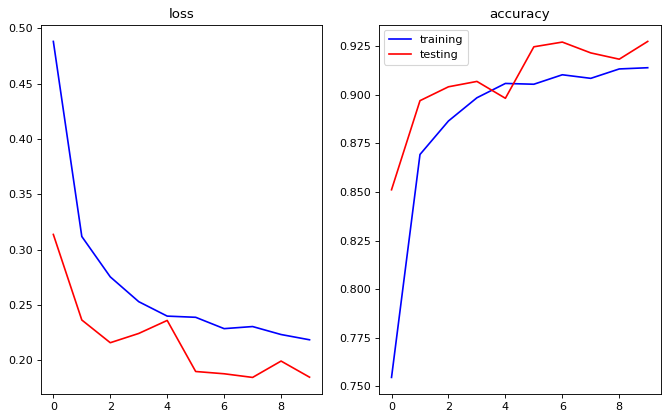

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.24it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


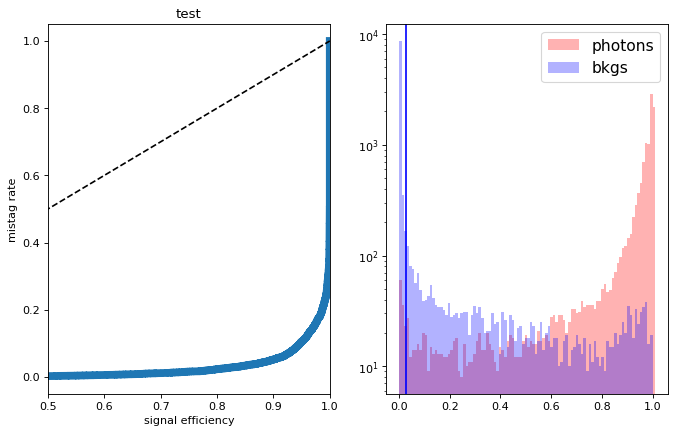

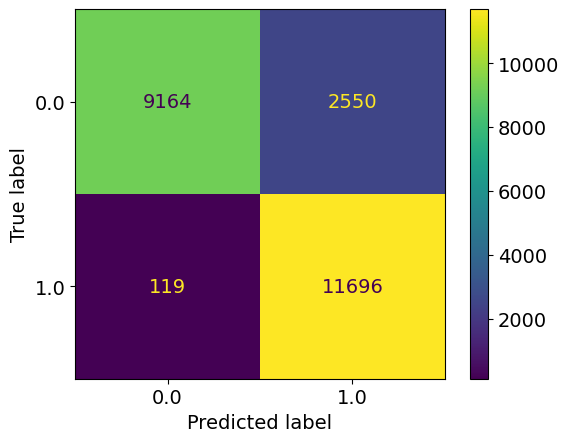

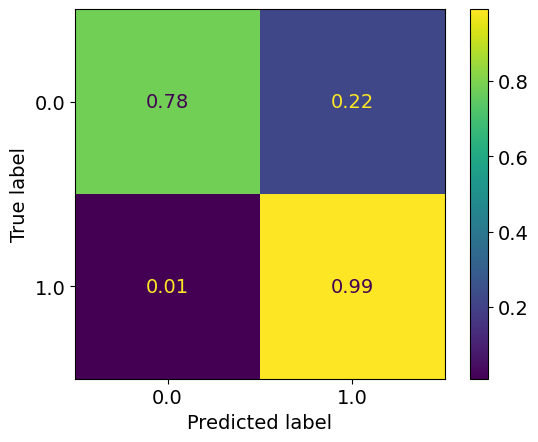

epoch: 10
Learning rate: 0.0009046260814679201


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.21713122231945112
train acc: 0.9146142


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.17474611513316632
test acc: 0.9316163
new best acc: 0.9316163
epoch: 11
Learning rate: 0.0008853841399927776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.2138533883603515
train acc: 0.91584677


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.70it/s]


test loss: 0.18080084808170796
test acc: 0.9294913
epoch: 12
Learning rate: 0.0008646212633823496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.21274945044973095
train acc: 0.9156555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.85it/s]


test loss: 0.16637880057096482
test acc: 0.9351439
new best acc: 0.9351439
epoch: 13
Learning rate: 0.0008424193932249613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.20769223921997532
train acc: 0.916378


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]


test loss: 0.1963389851152897
test acc: 0.92443365
epoch: 14
Learning rate: 0.0008188661501590545


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.39it/s]


train loss: 0.20676739324050344
train acc: 0.91806746


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.24it/s]


test loss: 0.20791840739548206
test acc: 0.9213736
epoch: 15
Learning rate: 0.0007940544880745568


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.20683445843162052
train acc: 0.9184606


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.85it/s]


test loss: 0.19091048873960972
test acc: 0.92774874
epoch: 16
Learning rate: 0.000768082327266346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.20272900714616107
train acc: 0.9193


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.17it/s]


test loss: 0.22381070554256438
test acc: 0.9234987
epoch: 17
Learning rate: 0.0007410521679875801


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.20283791745544238
train acc: 0.91928935


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]


test loss: 0.17161168307065963
test acc: 0.9317013
epoch: 18
Learning rate: 0.0007130706859280274


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.2006642827942113
train acc: 0.92016065


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.95it/s]


test loss: 0.19274456482380628
test acc: 0.9269837
epoch: 19
Learning rate: 0.0006842483112138538


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.19847705039628752
train acc: 0.92137194


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.1983863741159439
test acc: 0.9267287


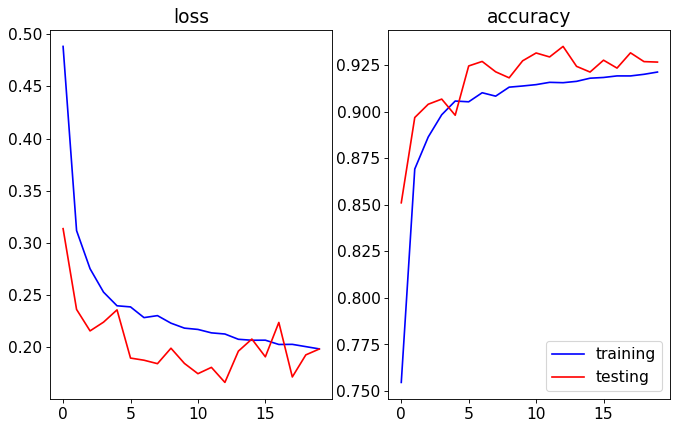

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.95it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


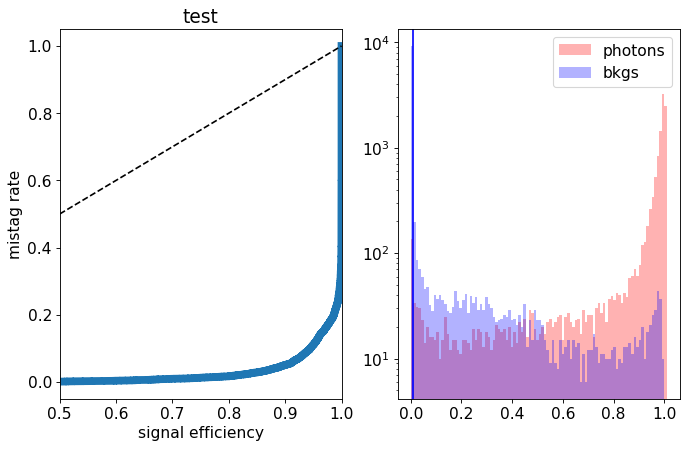

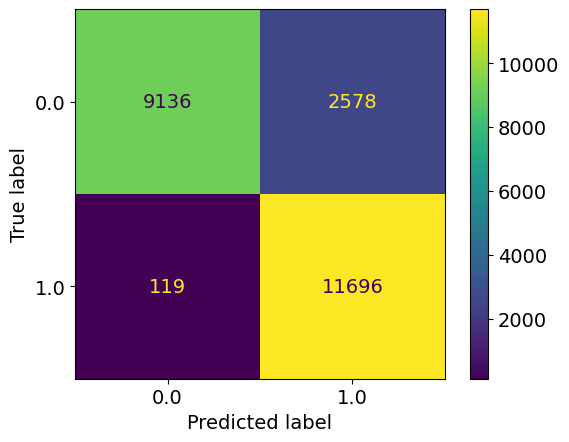

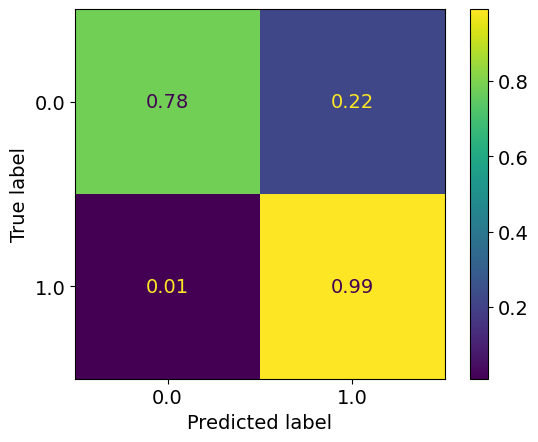

epoch: 20
Learning rate: 0.0006546987925903657


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.10it/s]


train loss: 0.20021920475610502
train acc: 0.92037314


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.79it/s]


test loss: 0.1765175312757492
test acc: 0.92851377
epoch: 21
Learning rate: 0.0006245387485076789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.19558485127558375
train acc: 0.921627


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.20288239531219004
test acc: 0.9260062
epoch: 22
Learning rate: 0.0005938872068809746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.19319798574326144
train acc: 0.922732


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.67it/s]


test loss: 0.15793793816119434
test acc: 0.9367589
new best acc: 0.9367589
epoch: 23
Learning rate: 0.0005628651353416957


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.38it/s]


train loss: 0.19342053164342407
train acc: 0.9227426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.90it/s]


test loss: 0.1679593849927187
test acc: 0.93484634
epoch: 24
Learning rate: 0.0005315949638335716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.18917862102863894
train acc: 0.9237096


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.86it/s]


test loss: 0.17366400379687547
test acc: 0.93012875
epoch: 25
Learning rate: 0.0005002001014375625


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.19042716588184333
train acc: 0.922732


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.17960029393434523
test acc: 0.9305113
epoch: 26
Learning rate: 0.00046880444933259687


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.189153896965039
train acc: 0.92379457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.16436706557869912
test acc: 0.93433636
epoch: 27
Learning rate: 0.00043753191181422396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.1858589891225669
train acc: 0.924804


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.17426814660429954
test acc: 0.93450636
epoch: 28
Learning rate: 0.0004065059073009655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.1866848050219238
train acc: 0.92409205


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.16345280185341834
test acc: 0.93446386
epoch: 29
Learning rate: 0.0003758488812582022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.18485208577031542
train acc: 0.925569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.1485600221902132
test acc: 0.9382889
new best acc: 0.9382889


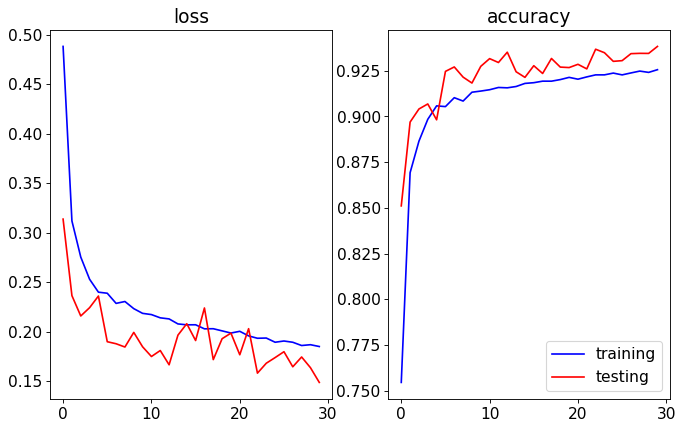

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.03it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


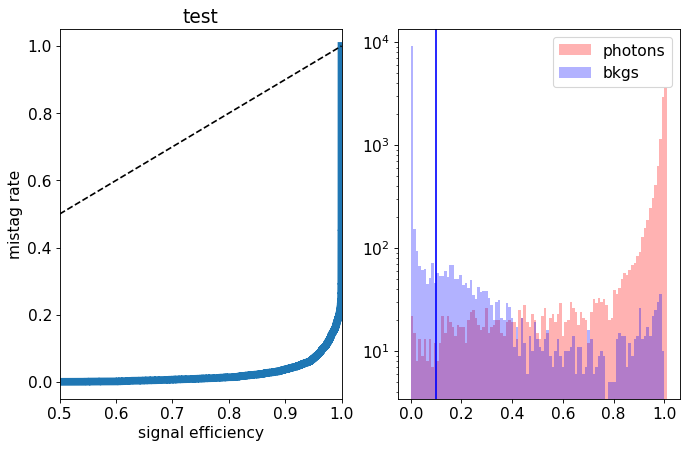

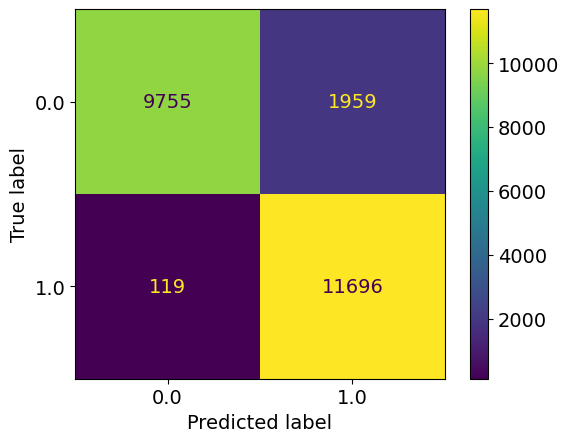

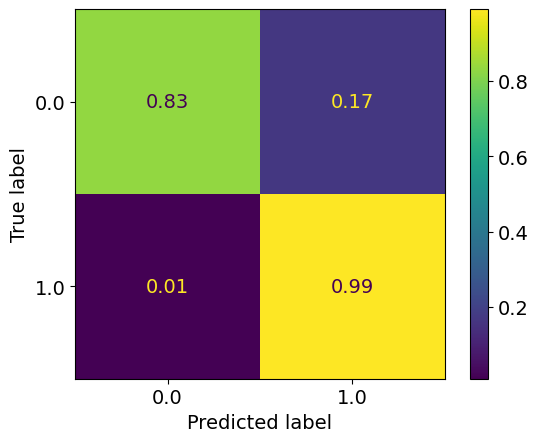

epoch: 30
Learning rate: 0.0003456818229618619


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.18471723889848987
train acc: 0.9248571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.91it/s]


test loss: 0.15115886460989714
test acc: 0.9373964
epoch: 31
Learning rate: 0.0003161237880090222


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.18284225805549864
train acc: 0.9257284


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]


test loss: 0.15504626650363207
test acc: 0.9369714
epoch: 32
Learning rate: 0.0002872914284598601


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.18097446460253114
train acc: 0.9263765


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]


test loss: 0.16173443831503392
test acc: 0.9371839
epoch: 33
Learning rate: 0.00025929853246526446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.18065079989706634
train acc: 0.9265359


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.95it/s]


test loss: 0.1594819212332368
test acc: 0.93794894
epoch: 34
Learning rate: 0.00023225557519698797


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.42it/s]


train loss: 0.1824425574700544
train acc: 0.92576027


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.10it/s]


test loss: 0.16042449716478585
test acc: 0.9352289
epoch: 35
Learning rate: 0.0002062692828526166


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.07it/s]


train loss: 0.17915904531433324
train acc: 0.926419


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.12it/s]


test loss: 0.15210039652884005
test acc: 0.9384589
new best acc: 0.9384589
epoch: 36
Learning rate: 0.0001814422114560259


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.43it/s]


train loss: 0.17908709937599815
train acc: 0.9273222


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.1776336396113038
test acc: 0.9309363
epoch: 37
Learning rate: 0.00015787234211560842


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.17855824112512503
train acc: 0.92797035


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.19it/s]


test loss: 0.16198502574115992
test acc: 0.9361639
epoch: 38
Learning rate: 0.00013565269433760135


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.17866313637821538
train acc: 0.9277578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.73it/s]


test loss: 0.16051277685910464
test acc: 0.9367164
epoch: 39
Learning rate: 0.00011487095892059324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.17757023054703025
train acc: 0.9279597


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.69it/s]


test loss: 0.16233103293925524
test acc: 0.9365464


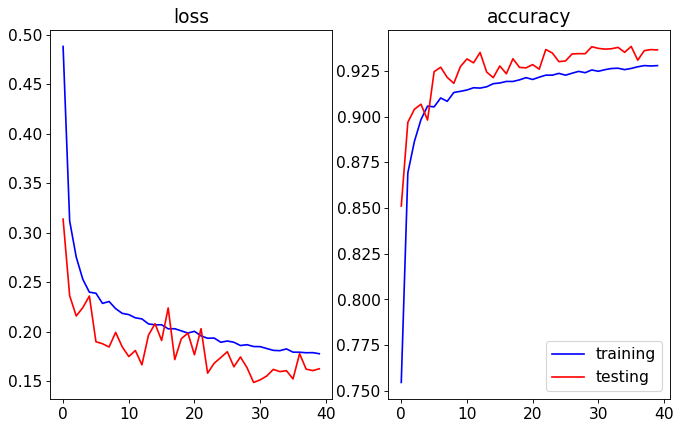

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.84it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


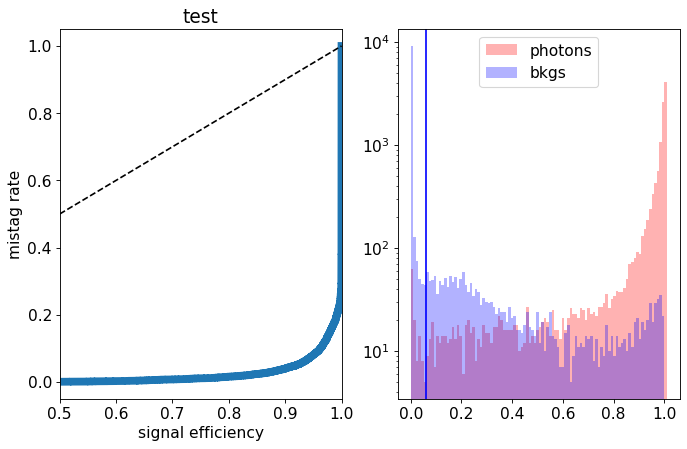

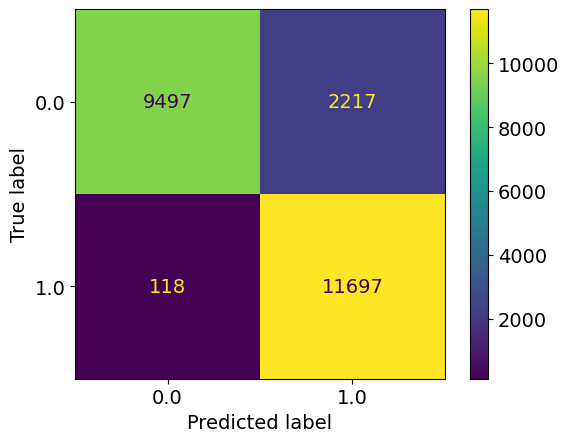

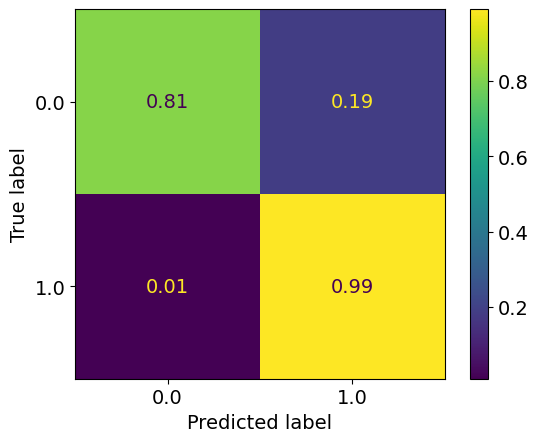

epoch: 40
Learning rate: 9.560915188000319e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.17795720051048666
train acc: 0.928406


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.09it/s]


test loss: 0.17450282573699952
test acc: 0.93476135
epoch: 41
Learning rate: 7.794329076833779e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1764737342003804
train acc: 0.9286929


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.89it/s]


test loss: 0.15412704255431892
test acc: 0.9372264
epoch: 42
Learning rate: 6.194309466864067e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.17838223791046506
train acc: 0.92793846


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.12it/s]


test loss: 0.16501326402649283
test acc: 0.9350589
epoch: 43
Learning rate: 4.767170904512302e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.1757041921091687
train acc: 0.92922413


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.13it/s]


test loss: 0.16733052339404822
test acc: 0.93442136
epoch: 44
Learning rate: 3.518545653686467e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.17627155486565488
train acc: 0.9286929


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.27it/s]


test loss: 0.1567117625847459
test acc: 0.9368014
epoch: 45
Learning rate: 2.4533614678089956e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.17395046315375406
train acc: 0.93001044


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.84it/s]


test loss: 0.16172178667038678
test acc: 0.9361639
epoch: 46
Learning rate: 1.575822142225153e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.17380239202338418
train acc: 0.9304885


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]


test loss: 0.16043986547738315
test acc: 0.93692887
epoch: 47
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.17514579928225013
train acc: 0.92903286


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.84it/s]


test loss: 0.16186849921941757
test acc: 0.93599385
epoch: 48
Learning rate: 3.96776842782659e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.37it/s]


train loss: 0.17621170174164377
train acc: 0.9285122


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.56it/s]


test loss: 0.16374992597848176
test acc: 0.9361639
epoch: 49
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.37it/s]


train loss: 0.17624190715467855
train acc: 0.9293941


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 13.33it/s]


test loss: 0.1602991335093975
test acc: 0.9363764


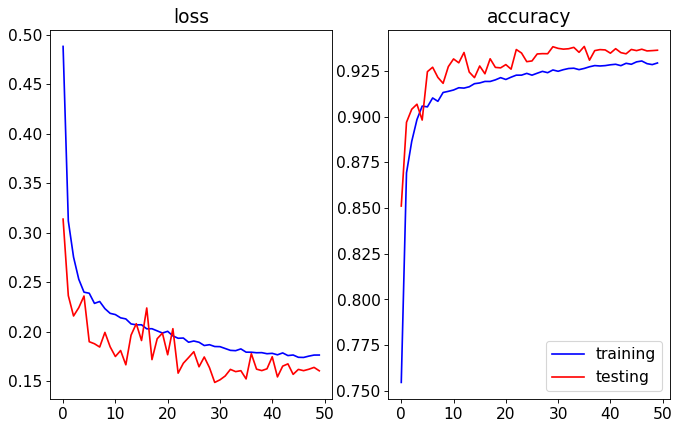

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.50it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


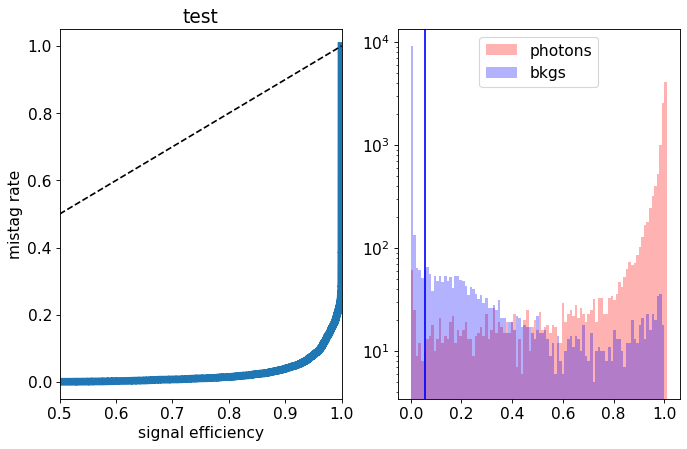

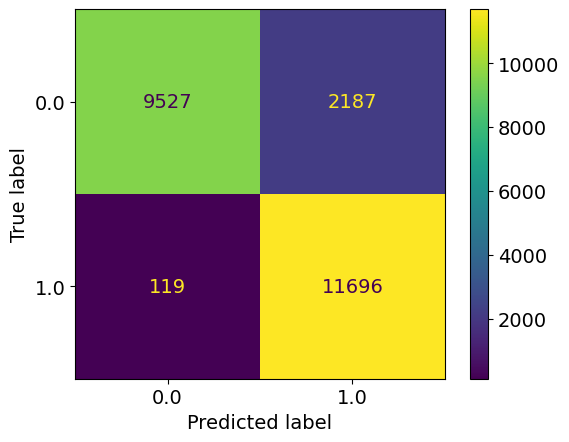

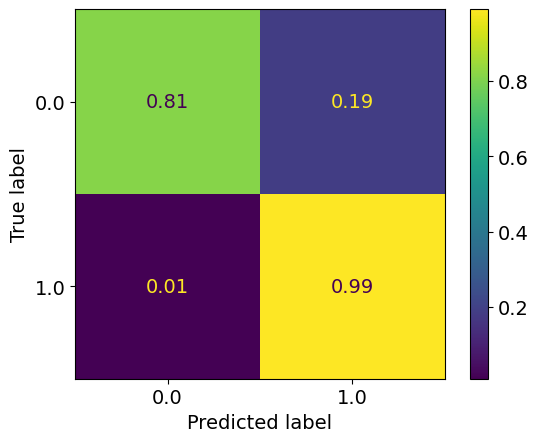

epoch: 50
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.19019393404577947
train acc: 0.9227214


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.04it/s]


test loss: 0.14845440182834863
test acc: 0.93816143
epoch: 51
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.42it/s]


train loss: 0.18954175976431295
train acc: 0.92325264


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.19it/s]


test loss: 0.1719395261257887
test acc: 0.93229634
epoch: 52
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.10it/s]


train loss: 0.18677730991202554
train acc: 0.92386895


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.90it/s]


test loss: 0.1548606911674142
test acc: 0.93433636
epoch: 53
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.41it/s]


train loss: 0.18670131275608282
train acc: 0.9246871


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.02it/s]


test loss: 0.1957341216504574
test acc: 0.9250287
epoch: 54
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.1855911166424964
train acc: 0.9244002


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.30it/s]


test loss: 0.1589646553620696
test acc: 0.9360789
epoch: 55
Learning rate: 0.0009755900548115213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.1827495774835538
train acc: 0.926419


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.99it/s]


test loss: 0.15632395055145026
test acc: 0.93344384
epoch: 56
Learning rate: 0.0009649618679675238


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.18396908880039387
train acc: 0.92631274


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.15it/s]


test loss: 0.1545213432982564
test acc: 0.93374133
epoch: 57
Learning rate: 0.0009524986890515299


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.18594279467679892
train acc: 0.92437893


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.79it/s]


test loss: 0.16166630610823632
test acc: 0.93344384
epoch: 58
Learning rate: 0.0009382497045368368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.18280888543387128
train acc: 0.92625964


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.93it/s]


test loss: 0.17065178640186787
test acc: 0.93110627
epoch: 59
Learning rate: 0.0009222711486555816


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.08it/s]


train loss: 0.18046445532399377
train acc: 0.9270353


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.14it/s]


test loss: 0.15520624537020922
test acc: 0.9353564


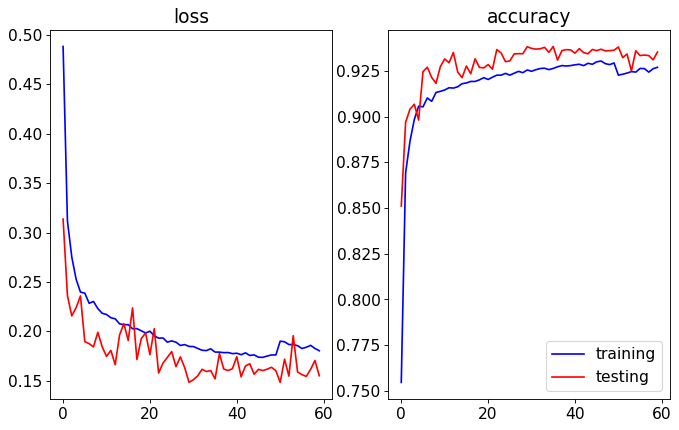

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.64it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


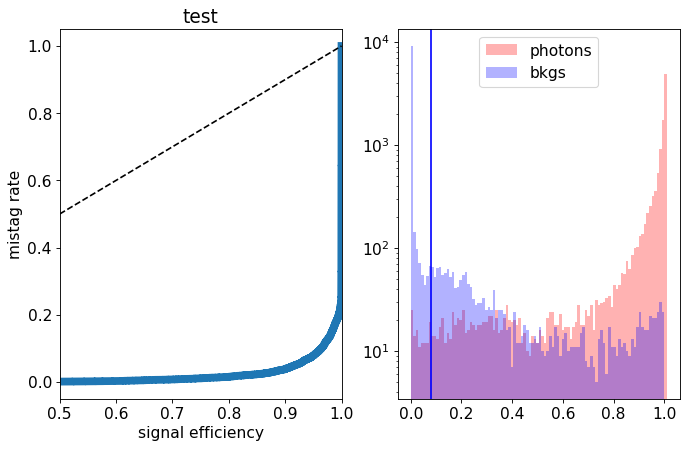

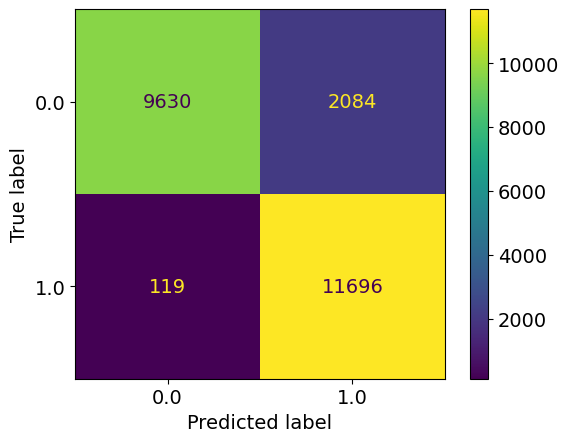

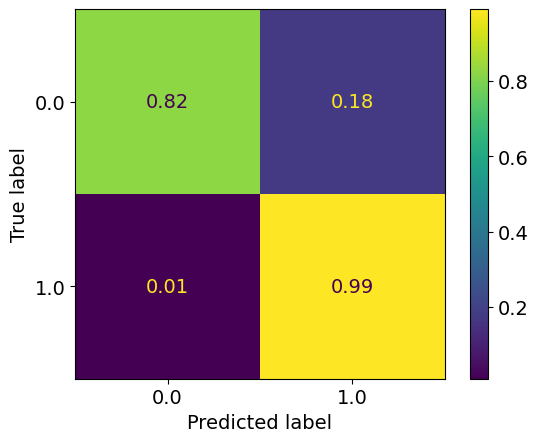

epoch: 60
Learning rate: 0.0009046260814679201


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1814993356063867
train acc: 0.9255052


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.86it/s]


test loss: 0.15809760242700577
test acc: 0.93216884
epoch: 61
Learning rate: 0.0008853841399927776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.17685954025976217
train acc: 0.9283422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.99it/s]


test loss: 0.15202439334243537
test acc: 0.9383314
epoch: 62
Learning rate: 0.0008646212633823496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.35it/s]


train loss: 0.17616573137462518
train acc: 0.9286079


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.99it/s]


test loss: 0.15528956148773432
test acc: 0.93578136
epoch: 63
Learning rate: 0.0008424193932249613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1770802976409341
train acc: 0.92872477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.78it/s]


test loss: 0.16059387493878602
test acc: 0.9326788
epoch: 64
Learning rate: 0.0008188661501590544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.17581957521711944
train acc: 0.92909664


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]


test loss: 0.15419217459857465
test acc: 0.93493134
epoch: 65
Learning rate: 0.0007940544880745568


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.39it/s]


train loss: 0.1780040179658088
train acc: 0.9276197


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.20it/s]


test loss: 0.148618420958519
test acc: 0.9376514
epoch: 66
Learning rate: 0.000768082327266346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.17536736778013265
train acc: 0.92914975


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.19it/s]


test loss: 0.16987258158624172
test acc: 0.9312338
epoch: 67
Learning rate: 0.00074105216798758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.38it/s]


train loss: 0.1757848487727961
train acc: 0.92701405


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.11it/s]


test loss: 0.18344123139977456
test acc: 0.93021375
epoch: 68
Learning rate: 0.0007130706859280273


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.17301628368485505
train acc: 0.92927724


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.92it/s]


test loss: 0.1606643995270133
test acc: 0.9370989
epoch: 69
Learning rate: 0.0006842483112138537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.17435968102543217
train acc: 0.9293091


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.10it/s]


test loss: 0.15680720023810862
test acc: 0.9364189


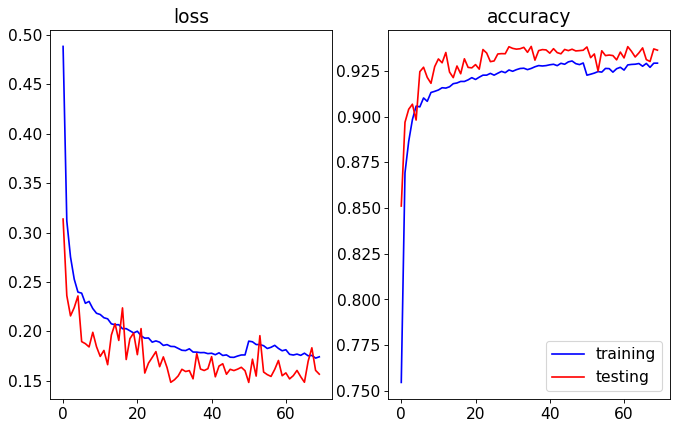

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


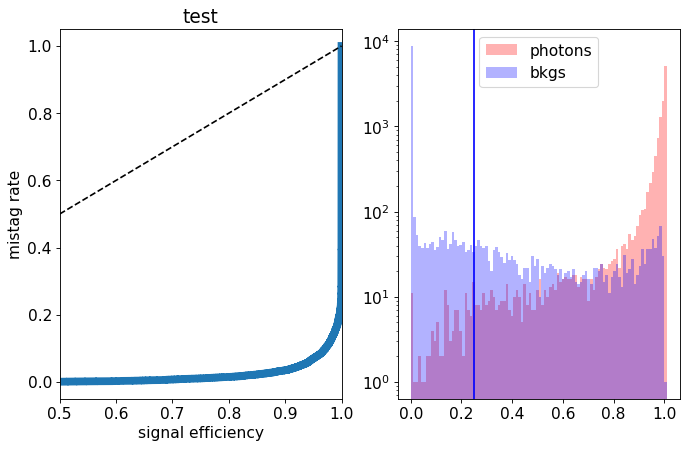

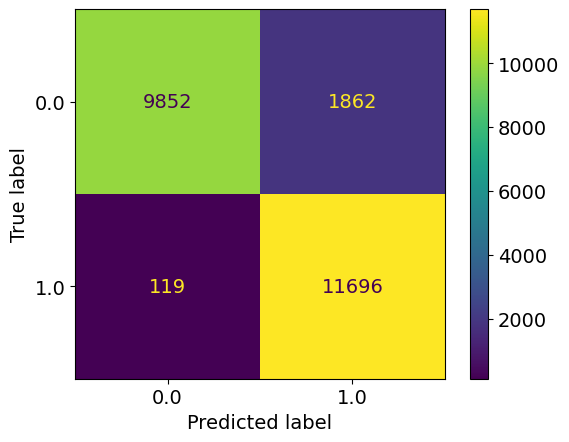

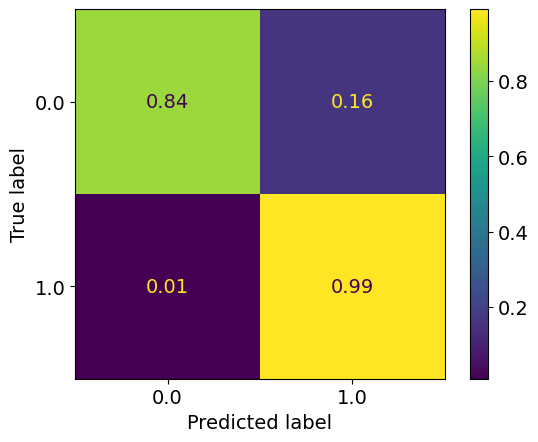

epoch: 70
Learning rate: 0.0006546987925903656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.1731903599041283
train acc: 0.9286822


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]


test loss: 0.16724874768406153
test acc: 0.92910874
epoch: 71
Learning rate: 0.0006245387485076789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.17216996962477446
train acc: 0.92903286


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.88it/s]


test loss: 0.14857490584254265
test acc: 0.93935144
new best acc: 0.93935144
epoch: 72
Learning rate: 0.0005938872068809745


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.17077668922342312
train acc: 0.9299573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.09it/s]


test loss: 0.16005297917872668
test acc: 0.93463385
epoch: 73
Learning rate: 0.0005628651353416956


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1703787587440697
train acc: 0.9304567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.88it/s]


test loss: 0.15509235356003045
test acc: 0.9370564
epoch: 74
Learning rate: 0.0005315949638335715


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.20it/s]


train loss: 0.16970013912506166
train acc: 0.93177426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.85it/s]


test loss: 0.14895236045122145
test acc: 0.9379064
epoch: 75
Learning rate: 0.0005002001014375625


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.16819550889502666
train acc: 0.93182737


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.90it/s]


test loss: 0.17266698069870473
test acc: 0.93480384
epoch: 76
Learning rate: 0.00046880444933259676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.08it/s]


train loss: 0.16903687629160608
train acc: 0.9314661


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.06it/s]


test loss: 0.14821765515953303
test acc: 0.93943644
new best acc: 0.93943644
epoch: 77
Learning rate: 0.00043753191181422385


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.1675252966630231
train acc: 0.93211424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.83it/s]


test loss: 0.15904510635882615
test acc: 0.93484634
epoch: 78
Learning rate: 0.0004065059073009654


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.39it/s]


train loss: 0.16843264317436582
train acc: 0.93186986


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.04it/s]


test loss: 0.15405967496335507
test acc: 0.9384589
epoch: 79
Learning rate: 0.0003758488812582022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.07it/s]


train loss: 0.16716429818967346
train acc: 0.93206114


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.13it/s]


test loss: 0.14694331157952548
test acc: 0.94020146
new best acc: 0.94020146


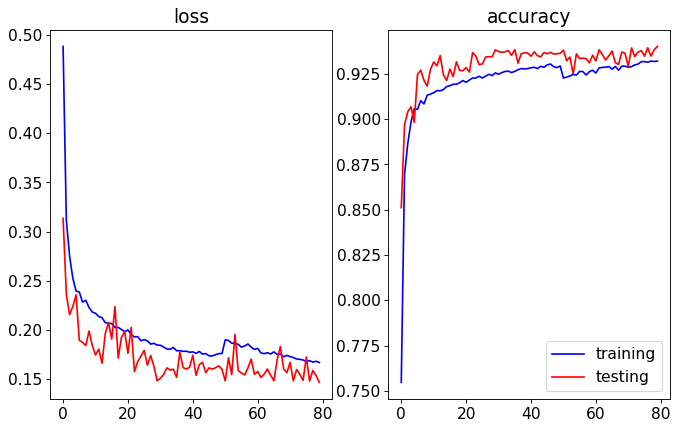

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.24it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


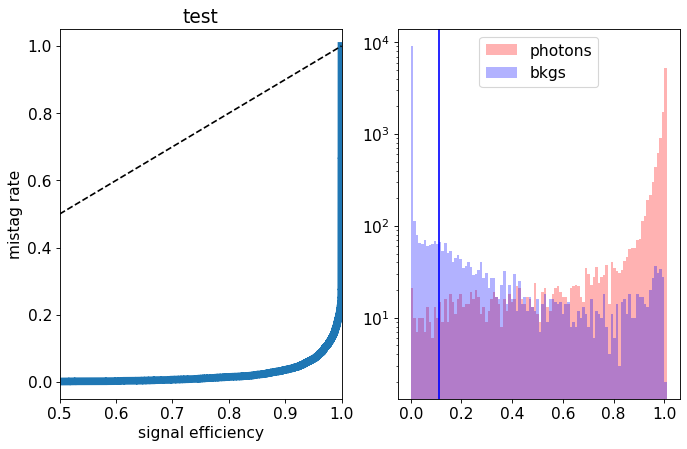

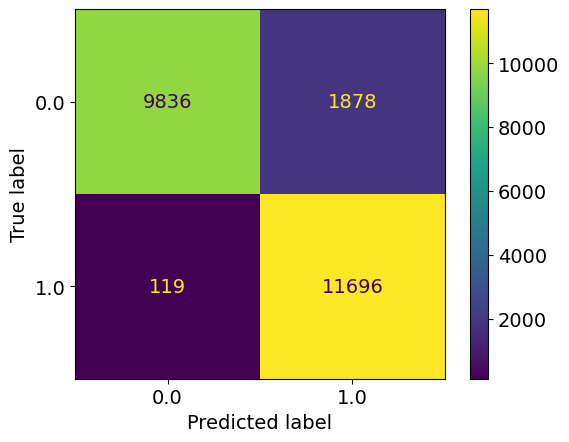

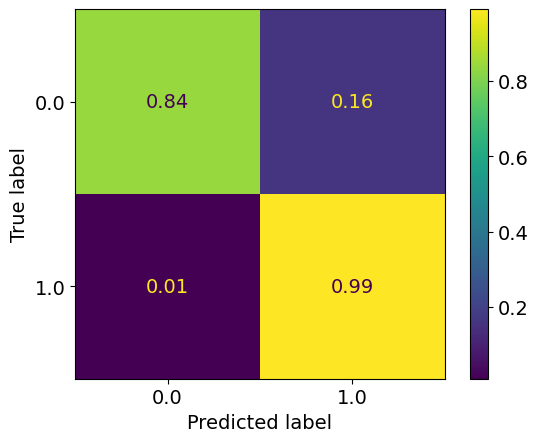

epoch: 80
Learning rate: 0.00034568182296186177


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.16684619114277469
train acc: 0.9316149


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.94it/s]


test loss: 0.1508955392986536
test acc: 0.93909645
epoch: 81
Learning rate: 0.000316123788009022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.16671488258489378
train acc: 0.9324649


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]


test loss: 0.14974552411586045
test acc: 0.93926644
epoch: 82
Learning rate: 0.0002872914284598601


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.16562574181207426
train acc: 0.9331874


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.15961433053016663
test acc: 0.9366314
epoch: 83
Learning rate: 0.00025929853246526446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.16366489886478253
train acc: 0.9337081


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.27it/s]


test loss: 0.15135453529655934
test acc: 0.9384164
epoch: 84
Learning rate: 0.00023225557519698797


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.1635155428177232
train acc: 0.9345581


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.92it/s]


test loss: 0.15805448740720748
test acc: 0.9375239
epoch: 85
Learning rate: 0.0002062692828526166


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.16467935777014228
train acc: 0.9338143


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.14769792053848504
test acc: 0.9398189
epoch: 86
Learning rate: 0.0001814422114560259


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.16399333047069561
train acc: 0.93413305


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.1508361551910639
test acc: 0.9387139
epoch: 87
Learning rate: 0.00015787234211560842


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.38it/s]


train loss: 0.163902807862136
train acc: 0.93309176


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.12it/s]


test loss: 0.14553895480930806
test acc: 0.9398189
epoch: 88
Learning rate: 0.00013565269433760135


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.42it/s]


train loss: 0.16460747366688053
train acc: 0.9333893


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.81it/s]


test loss: 0.14528706353157758
test acc: 0.940839
new best acc: 0.940839
epoch: 89
Learning rate: 0.00011487095892059324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.42it/s]


train loss: 0.16414763066609195
train acc: 0.9332724


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.14699068684130906
test acc: 0.94045645


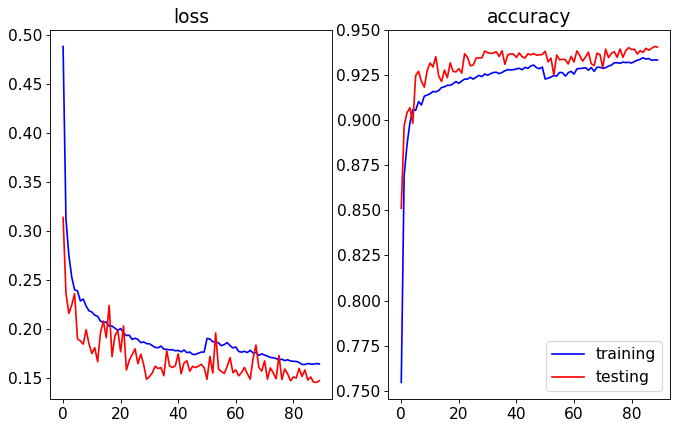

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.94it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


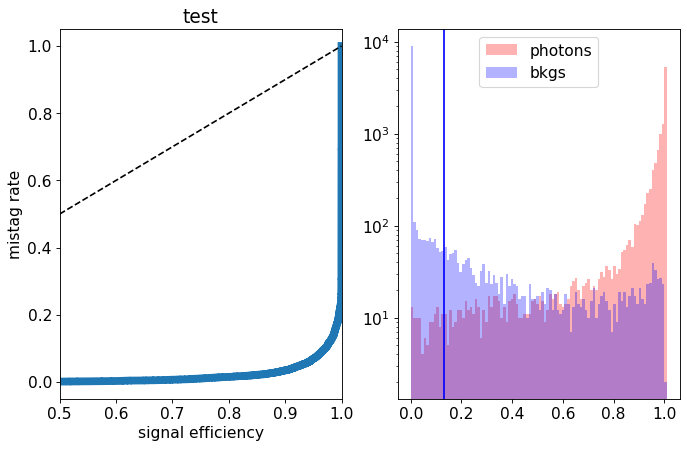

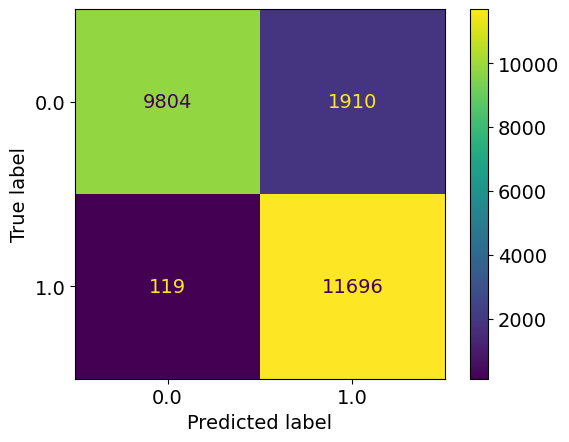

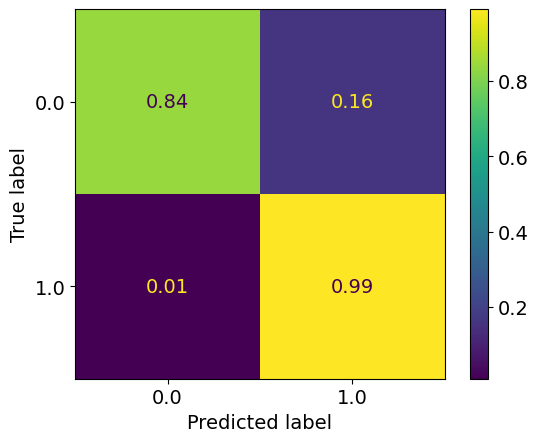

epoch: 90
Learning rate: 9.560915188000319e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.36it/s]


train loss: 0.16296466909776067
train acc: 0.93420744


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.10it/s]


test loss: 0.14939745664596557
test acc: 0.93952143
epoch: 91
Learning rate: 7.794329076833779e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.08it/s]


train loss: 0.1629587243411951
train acc: 0.9334318


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.15170309450477362
test acc: 0.94011647
epoch: 92
Learning rate: 6.194309466864067e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.43it/s]


train loss: 0.1616619187080936
train acc: 0.93474936


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.97it/s]


test loss: 0.155840078368783
test acc: 0.9385864
epoch: 93
Learning rate: 4.767170904512302e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.16046147826750567
train acc: 0.9353231


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.19it/s]


test loss: 0.1481304271146655
test acc: 0.94045645
epoch: 94
Learning rate: 3.518545653686467e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1623024535217103
train acc: 0.9343456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.05it/s]


test loss: 0.1511022135615349
test acc: 0.93939394
epoch: 95
Learning rate: 2.4533614678089956e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.16195056188827867
train acc: 0.93512124


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.63it/s]


test loss: 0.15126071609556674
test acc: 0.93930894
epoch: 96
Learning rate: 1.575822142225153e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.1615414836793948
train acc: 0.9345475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.92it/s]


test loss: 0.14958417918533087
test acc: 0.94011647
epoch: 97
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.16160502996604154
train acc: 0.93513185


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.57it/s]


test loss: 0.14871322233229875
test acc: 0.94007397
epoch: 98
Learning rate: 3.96776842782659e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.16155336806728582
train acc: 0.93496186


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.76it/s]


test loss: 0.1500647185370326
test acc: 0.9397764
epoch: 99
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.1602401031999831
train acc: 0.93417555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.05it/s]


test loss: 0.14992394726723432
test acc: 0.9399465


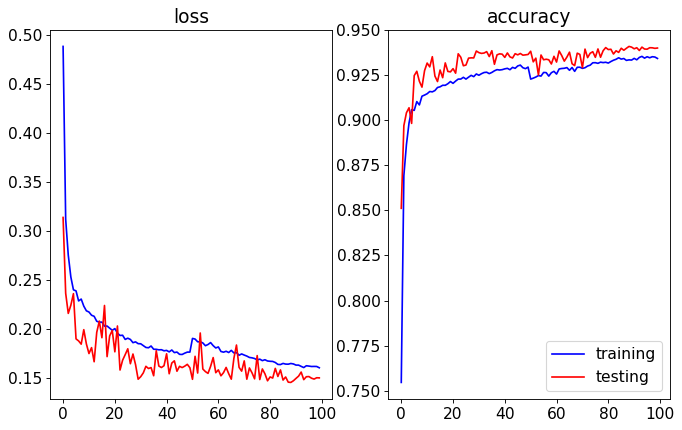

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.79it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


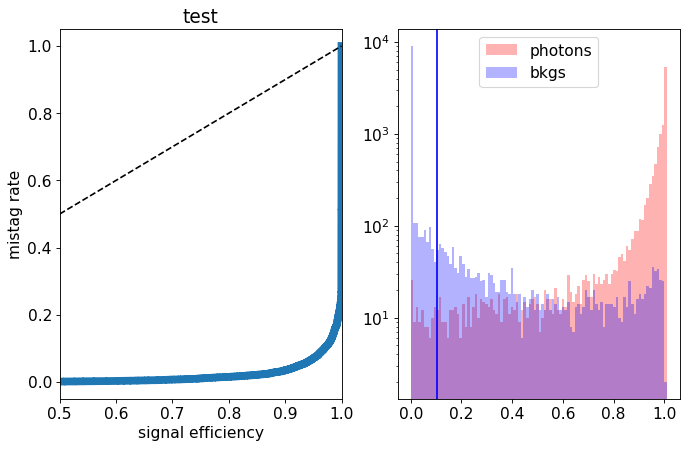

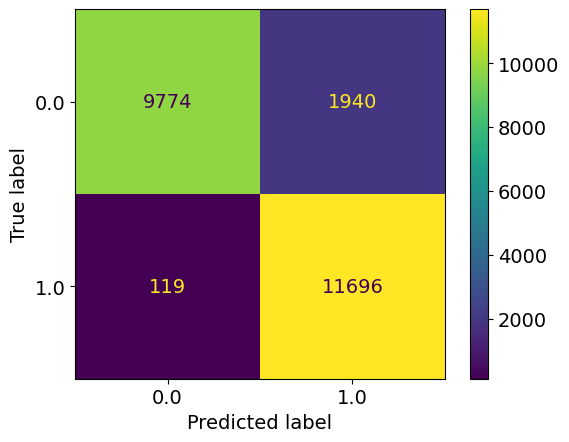

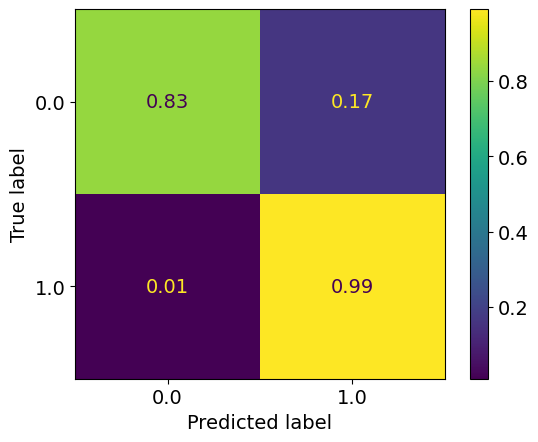

epoch: 100
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.35it/s]


train loss: 0.17208527341769758
train acc: 0.9294154


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.58it/s]


test loss: 0.168540283665061
test acc: 0.93229634
epoch: 101
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.38it/s]


train loss: 0.17413188241849278
train acc: 0.92913914


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.09it/s]


test loss: 0.18390521109104158
test acc: 0.9318288
epoch: 102
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.37it/s]


train loss: 0.17133197596498356
train acc: 0.9303292


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.09it/s]


test loss: 0.15365793239325284
test acc: 0.9364614
epoch: 103
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.11it/s]


train loss: 0.1706415770729636
train acc: 0.93099856


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.11it/s]


test loss: 0.15086494497954844
test acc: 0.9385439
epoch: 104
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.17172810368856806
train acc: 0.9305948


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.84it/s]


test loss: 0.14423425905406476
test acc: 0.94011647
epoch: 105
Learning rate: 0.0009755900548115213


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.17235412510337345
train acc: 0.92923474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.01it/s]


test loss: 0.1606349103152752
test acc: 0.93471885
epoch: 106
Learning rate: 0.0009649618679675238


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.36it/s]


train loss: 0.16834626138020473
train acc: 0.9314236


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.74it/s]


test loss: 0.16354901269078254
test acc: 0.9355264
epoch: 107
Learning rate: 0.0009524986890515299


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.41it/s]


train loss: 0.16769324005789057
train acc: 0.9318486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]


test loss: 0.1481366639956832
test acc: 0.9396914
epoch: 108
Learning rate: 0.0009382497045368368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.1695893979186465
train acc: 0.93031853


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.81it/s]


test loss: 0.14880009405314923
test acc: 0.9385439
epoch: 109
Learning rate: 0.0009222711486555816


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.16825076325494012
train acc: 0.9312111


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.15558020994067193
test acc: 0.93433636


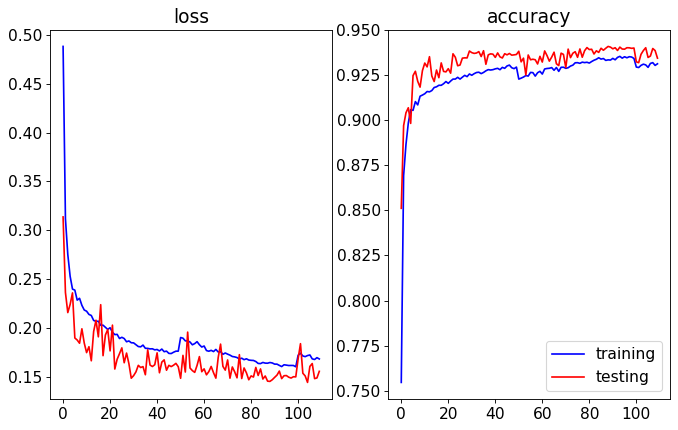

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


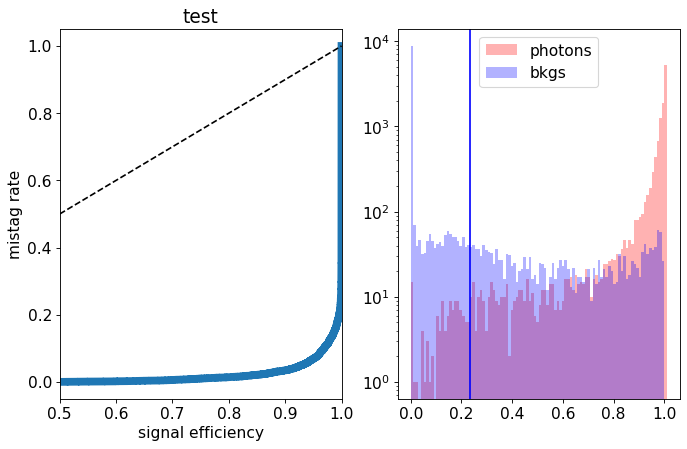

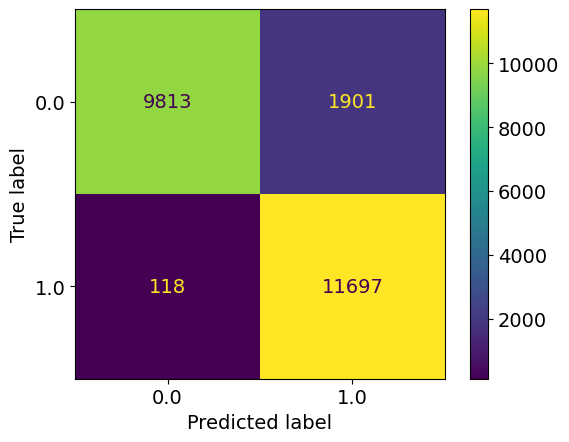

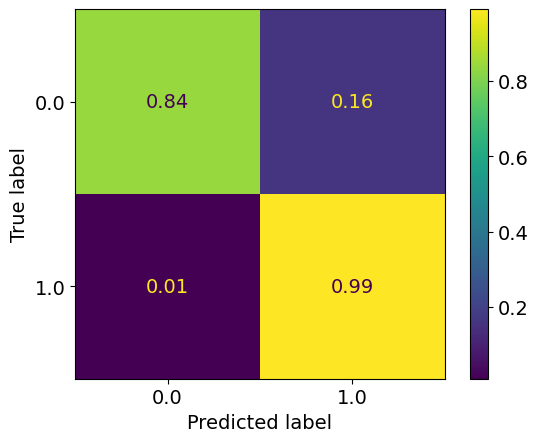

epoch: 110
Learning rate: 0.0009046260814679201


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.1680497019818634
train acc: 0.9325286


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.23it/s]


test loss: 0.1534897455945611
test acc: 0.9372264
epoch: 111
Learning rate: 0.0008853841399927776


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.17058375952350105
train acc: 0.9303717


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.19it/s]


test loss: 0.15287152640521526
test acc: 0.9376089
epoch: 112
Learning rate: 0.0008646212633823496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.16670696850225425
train acc: 0.932688


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.10it/s]


test loss: 0.14529806692153216
test acc: 0.9411365
new best acc: 0.9411365
epoch: 113
Learning rate: 0.0008424193932249613


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.20it/s]


train loss: 0.16903764892155956
train acc: 0.9329749


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.91it/s]


test loss: 0.15205572862178088
test acc: 0.9373964
epoch: 114
Learning rate: 0.0008188661501590544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.16656087191811034
train acc: 0.9327093


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]


test loss: 0.1468796132132411
test acc: 0.93935144
epoch: 115
Learning rate: 0.0007940544880745568


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.16546928222961488
train acc: 0.9336549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.64it/s]


test loss: 0.14463202506303788
test acc: 0.940839
epoch: 116
Learning rate: 0.000768082327266346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.1652609520846871
train acc: 0.9334212


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.83it/s]


test loss: 0.14598385486751794
test acc: 0.941264
new best acc: 0.941264
epoch: 117
Learning rate: 0.00074105216798758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.40it/s]


train loss: 0.1660784195847572
train acc: 0.9333255


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.17it/s]


test loss: 0.1619180381298065
test acc: 0.9368014
epoch: 118
Learning rate: 0.0007130706859280273


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.09it/s]


train loss: 0.16469910266293084
train acc: 0.9334955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.92it/s]


test loss: 0.14486994948238135
test acc: 0.94139147
new best acc: 0.94139147
epoch: 119
Learning rate: 0.0006842483112138537


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1642876426410523
train acc: 0.9343031


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.16557764448225498
test acc: 0.9353989


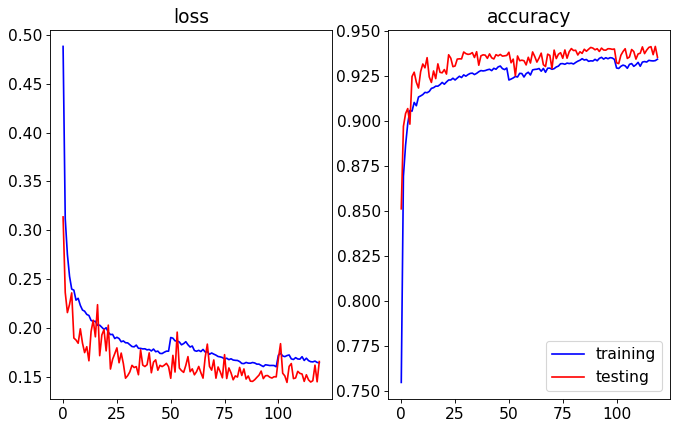

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.98it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


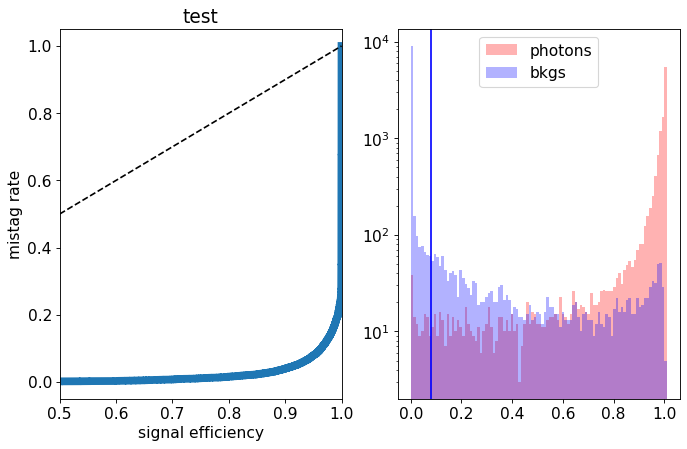

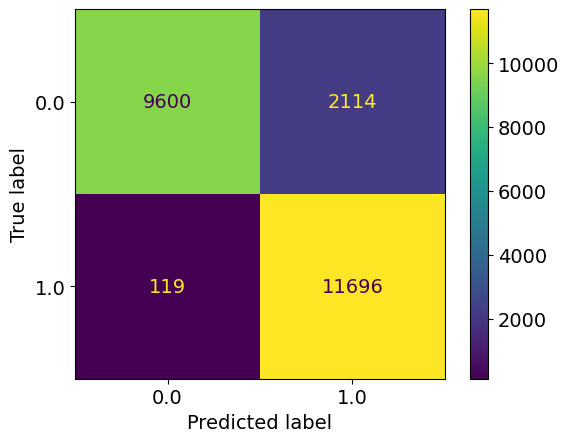

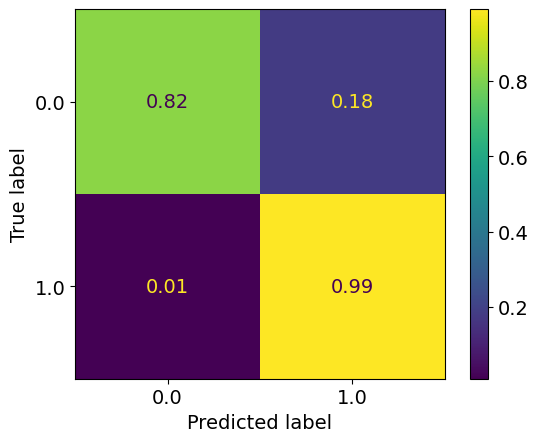

epoch: 120
Learning rate: 0.0006546987925903656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.19it/s]


train loss: 0.1639332732387409
train acc: 0.9343031


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.92it/s]


test loss: 0.17049542497843503
test acc: 0.93327385
epoch: 121
Learning rate: 0.0006245387485076789


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.16293471467912576
train acc: 0.93520623


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.63it/s]


test loss: 0.15056505873799325
test acc: 0.93820393
epoch: 122
Learning rate: 0.0005938872068809745


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.11it/s]


train loss: 0.16206612846084462
train acc: 0.9343137


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.19it/s]


test loss: 0.1618357652798295
test acc: 0.9365039
epoch: 123
Learning rate: 0.0005628651353416956


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.16194138728129637
train acc: 0.93491936


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.25it/s]


test loss: 0.15301708467304706
test acc: 0.93816143
epoch: 124
Learning rate: 0.0005315949638335715


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.16066178655738284
train acc: 0.93527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


test loss: 0.1628821987658739
test acc: 0.9388414
epoch: 125
Learning rate: 0.0005002001014375625


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.16089683064040106
train acc: 0.93504685


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.95it/s]


test loss: 0.1550488591194153
test acc: 0.93926644
epoch: 126
Learning rate: 0.00046880444933259676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.16087309759893234
train acc: 0.93544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.16711846012622117
test acc: 0.9369714
epoch: 127
Learning rate: 0.00043753191181422385


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.43it/s]


train loss: 0.16030934861131535
train acc: 0.93580127


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.21it/s]


test loss: 0.14975786358118057
test acc: 0.939904
epoch: 128
Learning rate: 0.0004065059073009654


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.15969167483650196
train acc: 0.9358119


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.65it/s]


test loss: 0.15609565209597348
test acc: 0.93794894
epoch: 129
Learning rate: 0.0003758488812582026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1598343863418907
train acc: 0.93529123


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.01it/s]


test loss: 0.14687939044088125
test acc: 0.942624
new best acc: 0.942624


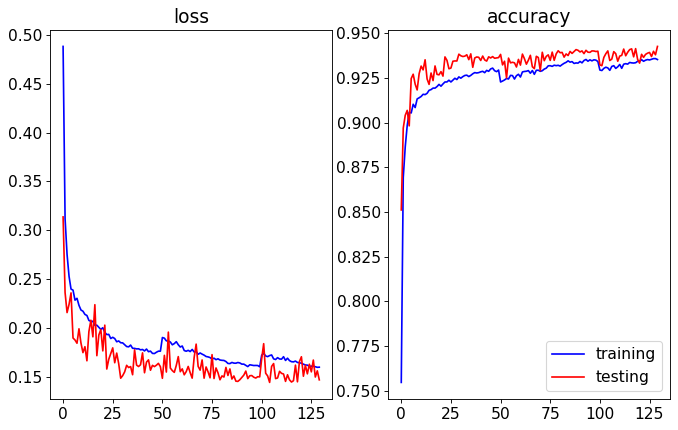

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.94it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


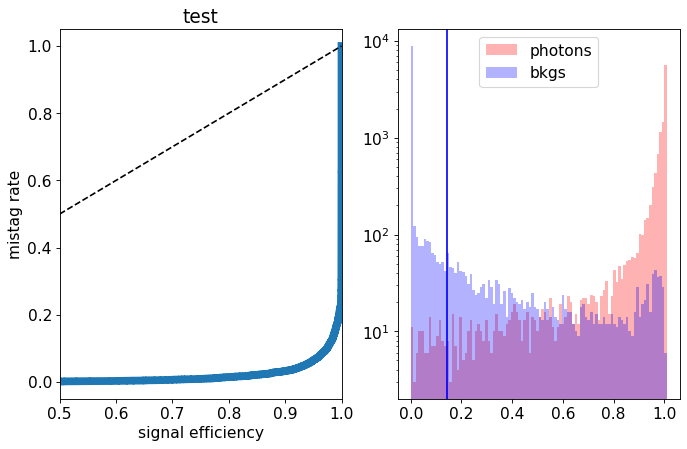

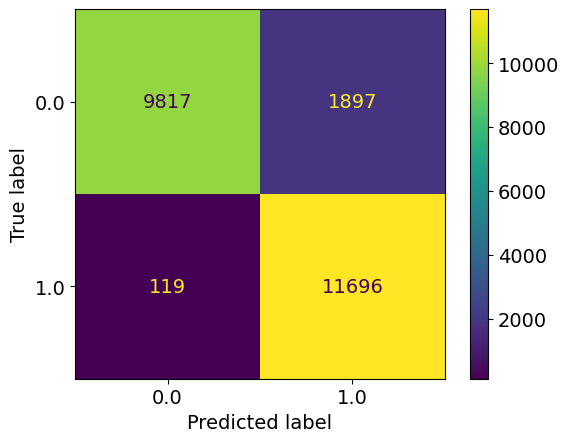

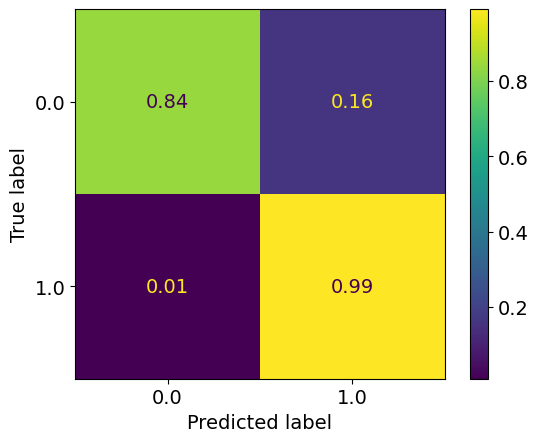

epoch: 130
Learning rate: 0.00034568182296186226


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.15994126501546543
train acc: 0.93587565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.06it/s]


test loss: 0.15134514216333628
test acc: 0.93888396
epoch: 131
Learning rate: 0.0003161237880090224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.15921173178276438
train acc: 0.9361519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]


test loss: 0.13909588605165482
test acc: 0.9442815
new best acc: 0.9442815
epoch: 132
Learning rate: 0.00028729142845986054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.08it/s]


train loss: 0.15705456579946409
train acc: 0.9373632


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.89it/s]


test loss: 0.14902973119169474
test acc: 0.94032896
epoch: 133
Learning rate: 0.0002592985324652648


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.1576597502656803
train acc: 0.93688506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]


test loss: 0.14511301331222057
test acc: 0.94134897
epoch: 134
Learning rate: 0.00023225557519698832


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.15681645625336155
train acc: 0.9374057


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.96it/s]


test loss: 0.1538782764226198
test acc: 0.9383739
epoch: 135
Learning rate: 0.00020626928285261698


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.15719060315068362
train acc: 0.9373844


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.14266455210745335
test acc: 0.9436015
epoch: 136
Learning rate: 0.00018144221145602646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1576434505783069
train acc: 0.9362794


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.20it/s]


test loss: 0.13881269730627538
test acc: 0.943304
epoch: 137
Learning rate: 0.00015787234211560875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.15544202259391737
train acc: 0.9378307


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.13it/s]


test loss: 0.15626894552260637
test acc: 0.9383739
epoch: 138
Learning rate: 0.00013565269433760168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.15608286259660295
train acc: 0.9372357


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.1480323916301131
test acc: 0.9419015
epoch: 139
Learning rate: 0.00011487095892059351


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.15598687164153263
train acc: 0.93779886


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.14800779968500138
test acc: 0.941264


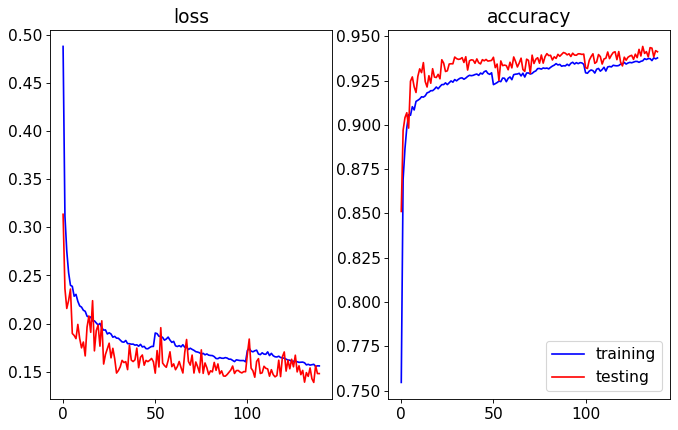

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.05it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


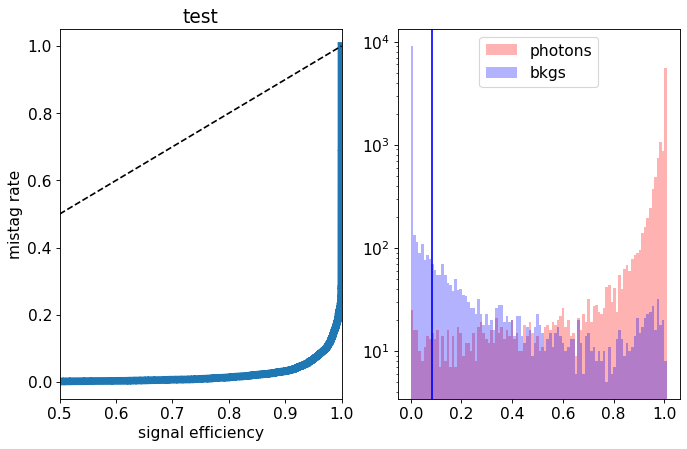

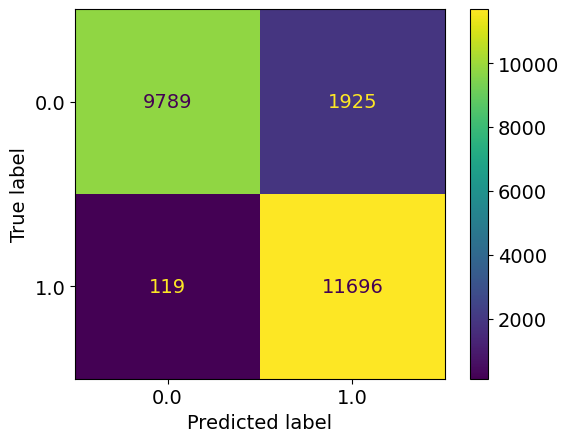

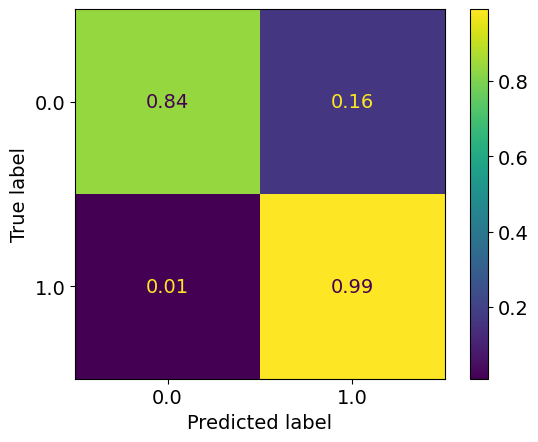

epoch: 140
Learning rate: 9.560915188000358e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.15464784874088444
train acc: 0.9375545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.12it/s]


test loss: 0.1446879619732499
test acc: 0.9428365
epoch: 141
Learning rate: 7.794329076833811e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.15510738137990807
train acc: 0.9374057


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.68it/s]


test loss: 0.14544041119515896
test acc: 0.942454
epoch: 142
Learning rate: 6.194309466864101e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.1552568168681898
train acc: 0.9375013


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.06it/s]


test loss: 0.14553678464144468
test acc: 0.942964
epoch: 143
Learning rate: 4.767170904512308e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.42it/s]


train loss: 0.1547127272577802
train acc: 0.93799007


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.14628968201577663
test acc: 0.9424965
epoch: 144
Learning rate: 3.518545653686489e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1551224122381514
train acc: 0.93791574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.86it/s]


test loss: 0.14401875678449869
test acc: 0.94270897
epoch: 145
Learning rate: 2.453361467809001e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.15371146380521689
train acc: 0.9385745


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.06it/s]


test loss: 0.1457890035584569
test acc: 0.9426665
epoch: 146
Learning rate: 1.5758221422251696e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.15320322297181294
train acc: 0.9381176


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.59it/s]


test loss: 0.14499570559710265
test acc: 0.9422415
epoch: 147
Learning rate: 8.893909237434717e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.15432392687174926
train acc: 0.93835133


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.06it/s]


test loss: 0.14420156143605709
test acc: 0.942454
epoch: 148
Learning rate: 3.967768427826646e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.15481941197897978
train acc: 0.9375545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.14it/s]


test loss: 0.1465919805690646
test acc: 0.9424965
epoch: 149
Learning rate: 9.992402206633334e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.15505530006566626
train acc: 0.9385001


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.97it/s]


test loss: 0.1445935120806098
test acc: 0.9424965


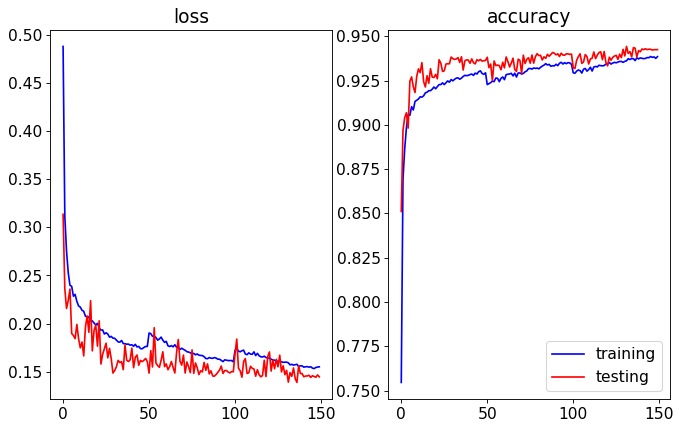

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.04it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


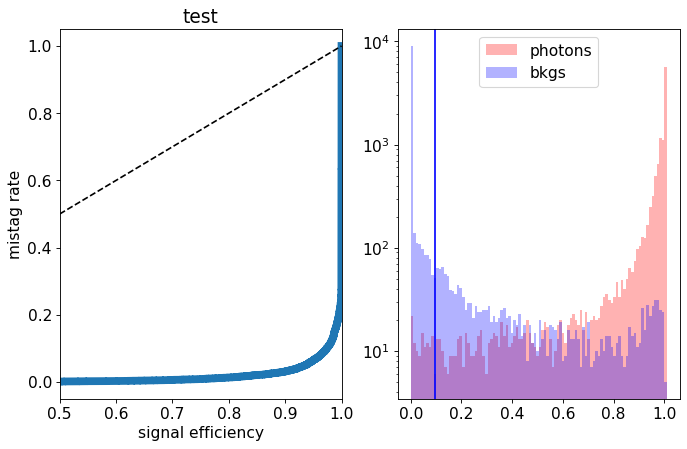

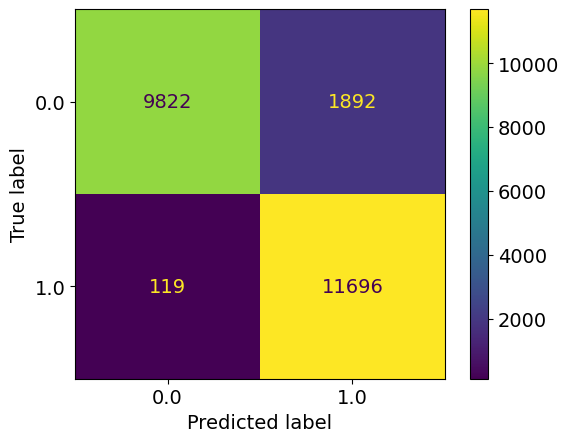

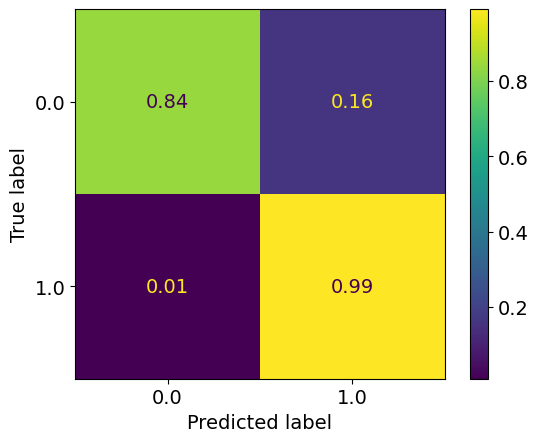

epoch: 150
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.16344276412277464
train acc: 0.93437743


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.18it/s]


test loss: 0.16529103145003318
test acc: 0.9373539
epoch: 151
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.43it/s]


train loss: 0.1643170820205075
train acc: 0.93373996


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.20975590571761132
test acc: 0.9304263
epoch: 152
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.16410359469758476
train acc: 0.93406934


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.1711466159671545
test acc: 0.93425137
epoch: 153
Learning rate: 0.0009911810813034074


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.1632367271431692
train acc: 0.9347175


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.16282976027578117
test acc: 0.9366739
epoch: 154
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.16126159611780932
train acc: 0.9344093


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.15768435336649417
test acc: 0.9370989
epoch: 155
Learning rate: 0.0009755900548115216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.1634074750409764
train acc: 0.93379307


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.05it/s]


test loss: 0.14857877120375634
test acc: 0.94168895
epoch: 156
Learning rate: 0.0009649618679675239


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.16160755784838063
train acc: 0.9348025


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.03it/s]


test loss: 0.1672406869009137
test acc: 0.9361639
epoch: 157
Learning rate: 0.0009524986890515301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.15994589291750247
train acc: 0.93621564


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.17785753645002841
test acc: 0.9366739
epoch: 158
Learning rate: 0.0009382497045368369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1627108958211674
train acc: 0.9347812


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.43it/s]


test loss: 0.1450251005589962
test acc: 0.942284
epoch: 159
Learning rate: 0.0009222711486555818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.15934128361712596
train acc: 0.93592876


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.16111526135355234
test acc: 0.93803394


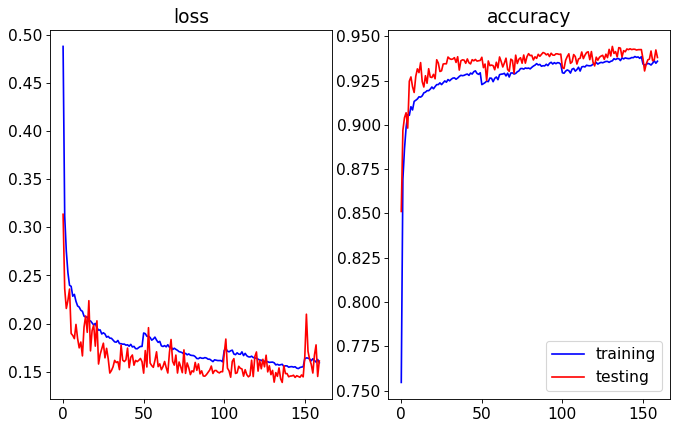

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.34it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


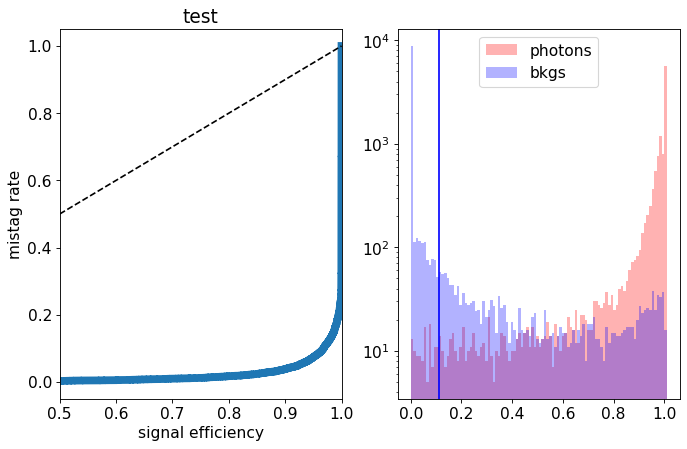

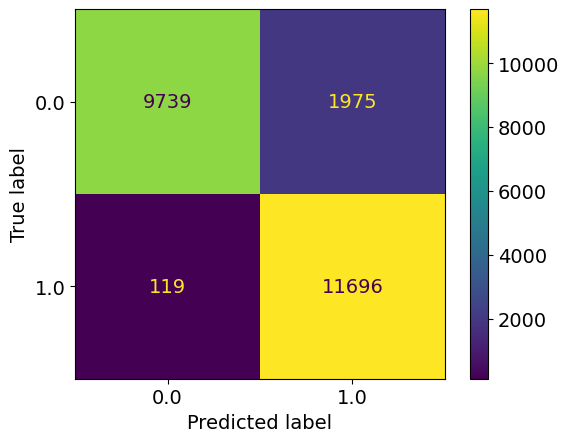

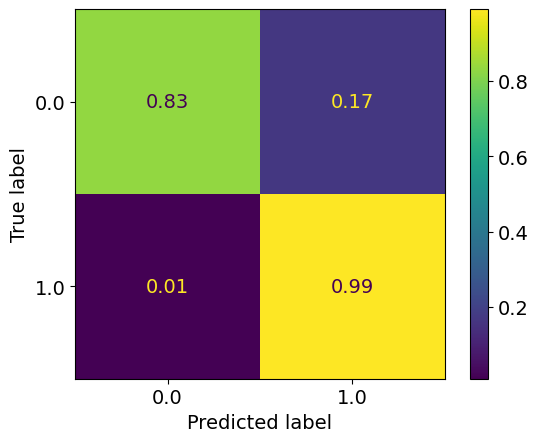

epoch: 160
Learning rate: 0.0009046260814679204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.15961333791351623
train acc: 0.9361094


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]


test loss: 0.1793513920158148
test acc: 0.9328063
epoch: 161
Learning rate: 0.0008853841399927779


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.07it/s]


train loss: 0.1608651403313989
train acc: 0.93498313


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.95it/s]


test loss: 0.1640434678643942
test acc: 0.9372264
epoch: 162
Learning rate: 0.0008646212633823498


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.15983744592044005
train acc: 0.9367257


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.2063360683619976
test acc: 0.9281737
epoch: 163
Learning rate: 0.0008424193932249617


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.16048083544536762
train acc: 0.9354506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.13it/s]


test loss: 0.17382122445851564
test acc: 0.93930894
epoch: 164
Learning rate: 0.0008188661501590547


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.11it/s]


train loss: 0.15751633456178532
train acc: 0.9364388


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.34it/s]


test loss: 0.1508351532742381
test acc: 0.941094
epoch: 165
Learning rate: 0.0007940544880745573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.15805611431978311
train acc: 0.9365663


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.14900663886219262
test acc: 0.94066894
epoch: 166
Learning rate: 0.0007680823272663462


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.15897952608621804
train acc: 0.9355356


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.87it/s]


test loss: 0.1481710184365511
test acc: 0.942114
epoch: 167
Learning rate: 0.0007410521679875803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.15676825972879008
train acc: 0.9374694


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.17796176988631487
test acc: 0.9382889
epoch: 168
Learning rate: 0.0007130706859280277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.15830751086116596
train acc: 0.9355037


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.36it/s]


test loss: 0.13843169882893563
test acc: 0.9431765
epoch: 169
Learning rate: 0.0006842483112138542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.15646732323298787
train acc: 0.93789446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.23869744837284088
test acc: 0.9272812


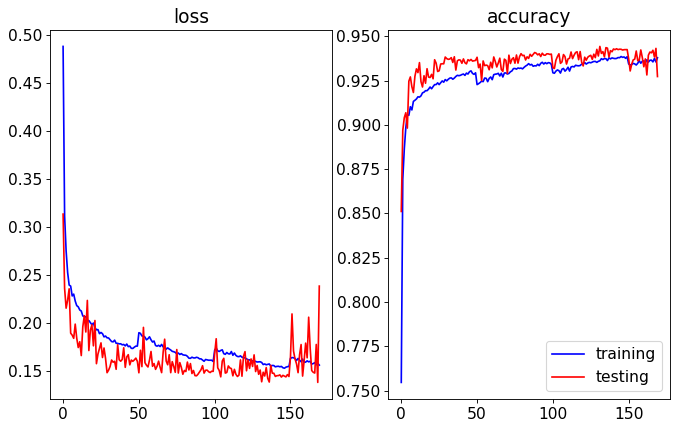

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.28it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


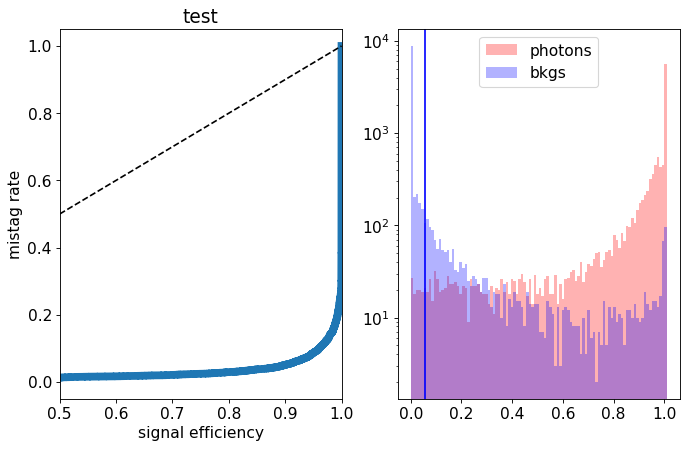

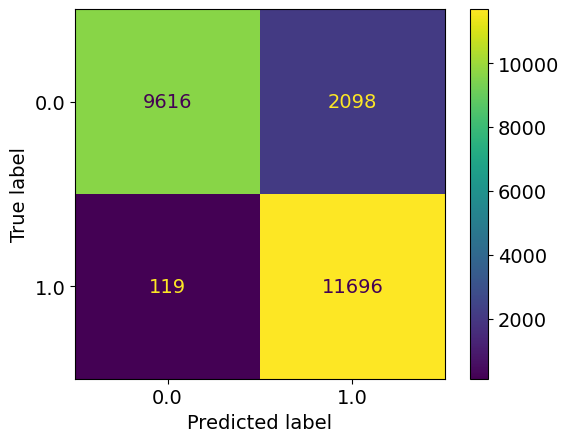

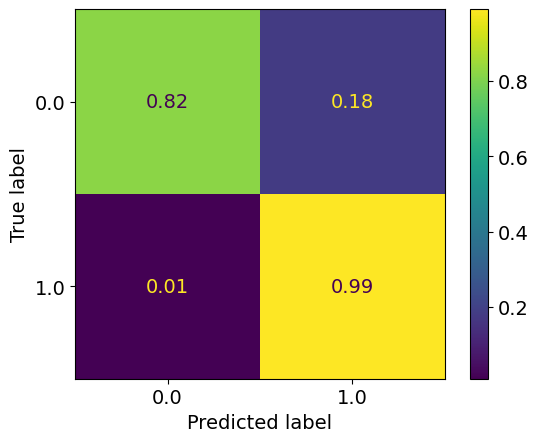

epoch: 170
Learning rate: 0.0006546987925903661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.1561061069369316
train acc: 0.93708694


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.59it/s]


test loss: 0.17010409850627184
test acc: 0.93794894
epoch: 171
Learning rate: 0.0006245387485076793


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.1559406780418317
train acc: 0.9373844


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.1415584037080407
test acc: 0.94394153
epoch: 172
Learning rate: 0.0005938872068809749


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.15662605528998527
train acc: 0.9367469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.52it/s]


test loss: 0.14227512180805207
test acc: 0.944324
new best acc: 0.944324
epoch: 173
Learning rate: 0.000562865135341696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.153873152603769
train acc: 0.93868077


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]


test loss: 0.16585412491112947
test acc: 0.9398189
epoch: 174
Learning rate: 0.000531594963833572


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.15517901211597357
train acc: 0.9386595


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.14775262363255023
test acc: 0.9412215
epoch: 175
Learning rate: 0.0005002001014375628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.15389296170442726
train acc: 0.9385745


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.06it/s]


test loss: 0.2097098972648382
test acc: 0.93484634
epoch: 176
Learning rate: 0.0004688044493325971


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.15255090380740013
train acc: 0.9383407


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.14838056024163962
test acc: 0.94062644
epoch: 177
Learning rate: 0.0004375319118142243


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.15246356648814147
train acc: 0.9391695


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.22it/s]


test loss: 0.15933268796652555
test acc: 0.93943644
epoch: 178
Learning rate: 0.000406505907300966


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1509898873935839
train acc: 0.9396052


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.13676811167970299
test acc: 0.9442815
epoch: 179
Learning rate: 0.0003758488812582026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.14993112795292193
train acc: 0.9394033


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.14083159789443017
test acc: 0.9446215
new best acc: 0.9446215


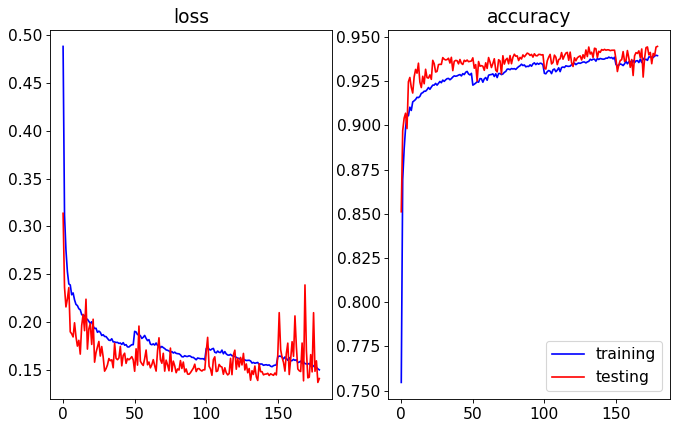

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.14it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


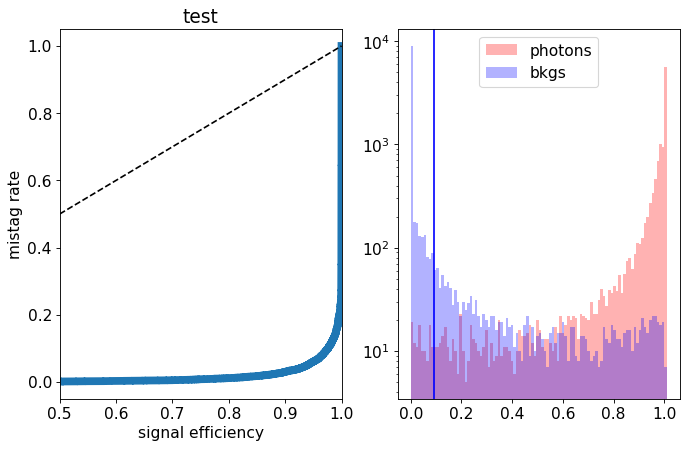

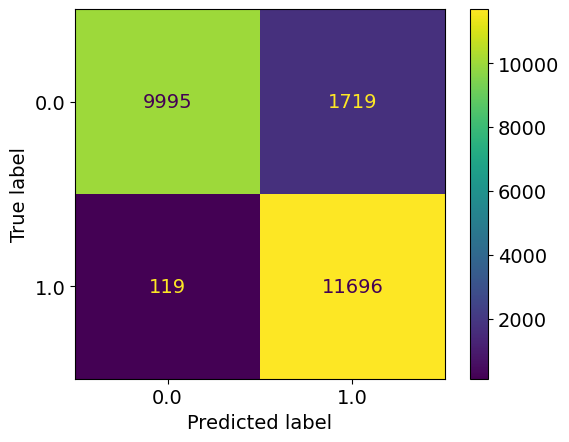

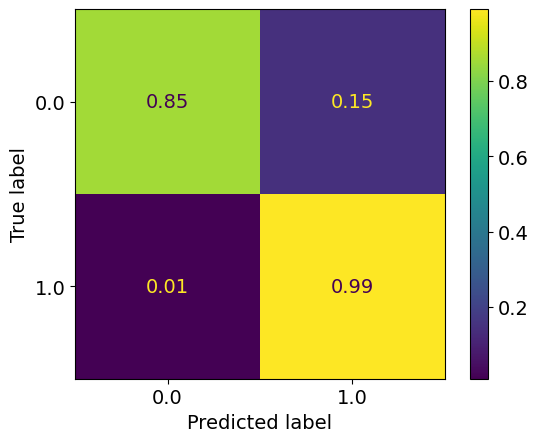

epoch: 180
Learning rate: 0.00034568182296186226


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.1521916625321291
train acc: 0.9386595


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.78it/s]


test loss: 0.13957095853984355
test acc: 0.94517404
new best acc: 0.94517404
epoch: 181
Learning rate: 0.0003161237880090224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.15101189683577057
train acc: 0.939212


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.14751001074910164
test acc: 0.9418165
epoch: 182
Learning rate: 0.00028729142845986054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.15109829125320837
train acc: 0.93908453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.00it/s]


test loss: 0.16062158346176147
test acc: 0.941179
epoch: 183
Learning rate: 0.0002592985324652648


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.14971366852142248
train acc: 0.9393183


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.94it/s]


test loss: 0.2005956221371889
test acc: 0.93905395
epoch: 184
Learning rate: 0.00023225557519698832


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.15004655286954466
train acc: 0.94014704


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.30it/s]


test loss: 0.15392156392335893
test acc: 0.9412215
epoch: 185
Learning rate: 0.00020626928285261698


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.15060980466141063
train acc: 0.9396477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.13it/s]


test loss: 0.14383624978363513
test acc: 0.942879
epoch: 186
Learning rate: 0.00018144221145602646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.14991519690319233
train acc: 0.93989205


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.26it/s]


test loss: 0.17087043840438126
test acc: 0.93918145
epoch: 187
Learning rate: 0.00015787234211560875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.14769261747978296
train acc: 0.9414646


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.1566502798348665
test acc: 0.9408815
epoch: 188
Learning rate: 0.00013565269433760168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.1483210217990693
train acc: 0.9405189


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.85it/s]


test loss: 0.14868307635188102
test acc: 0.9424115
epoch: 189
Learning rate: 0.00011487095892059351


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14813698851948331
train acc: 0.94199586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.36it/s]


test loss: 0.14555043522268535
test acc: 0.944494


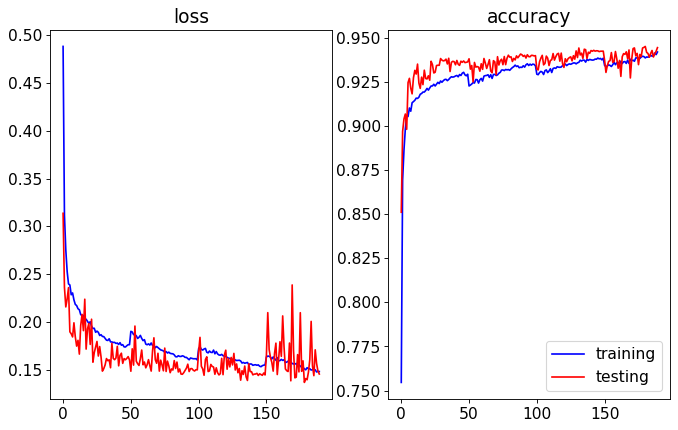

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


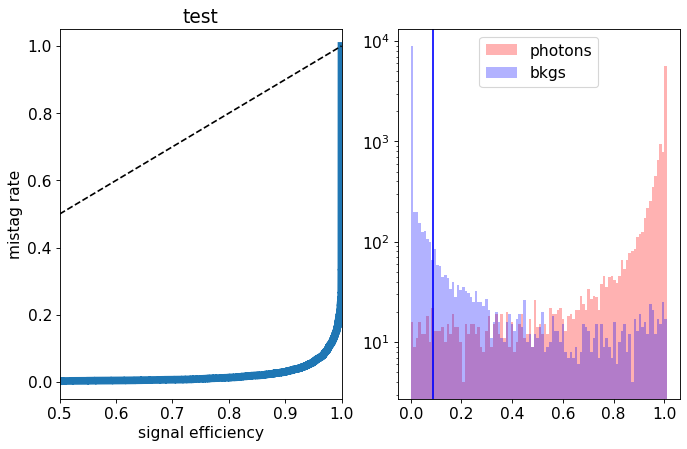

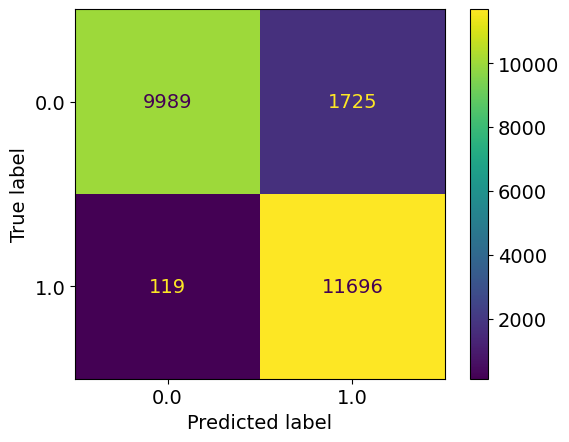

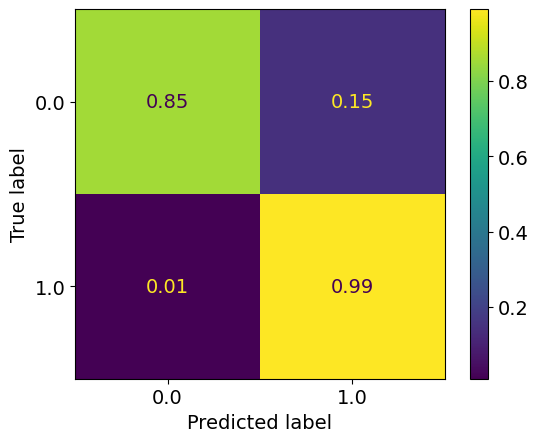

epoch: 190
Learning rate: 9.560915188000358e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.14834417322069215
train acc: 0.94095457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.05it/s]


test loss: 0.14860636554658413
test acc: 0.9427515
epoch: 191
Learning rate: 7.794329076833811e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.1485378023260718
train acc: 0.94072086


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.1465960144996643
test acc: 0.94377154
epoch: 192
Learning rate: 6.194309466864101e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14763854871130294
train acc: 0.94211274


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.17it/s]


test loss: 0.15770343281328678
test acc: 0.94134897
epoch: 193
Learning rate: 4.767170904512308e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.14694706070574987
train acc: 0.94090146


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.31it/s]


test loss: 0.14718752279877662
test acc: 0.942624
epoch: 194
Learning rate: 3.518545653686489e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.14710608343030238
train acc: 0.94081646


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]


test loss: 0.14462001100182534
test acc: 0.943559
epoch: 195
Learning rate: 2.453361467809001e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.14763734978475387
train acc: 0.9408377


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.57it/s]


test loss: 0.14572643097490073
test acc: 0.943219
epoch: 196
Learning rate: 1.5758221422251696e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.14700458754020132
train acc: 0.941709


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.87it/s]


test loss: 0.14467900823801755
test acc: 0.9432615
epoch: 197
Learning rate: 8.893909237434717e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.14727876207251459
train acc: 0.941624


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.29it/s]


test loss: 0.14680681768804787
test acc: 0.9431765
epoch: 198
Learning rate: 3.967768427826646e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.23it/s]


train loss: 0.14658363742433536
train acc: 0.94119895


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1488531181588769
test acc: 0.943389
epoch: 199
Learning rate: 9.992402206633334e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.14719999130744083
train acc: 0.94205964


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.34it/s]


test loss: 0.15008055698126554
test acc: 0.943474


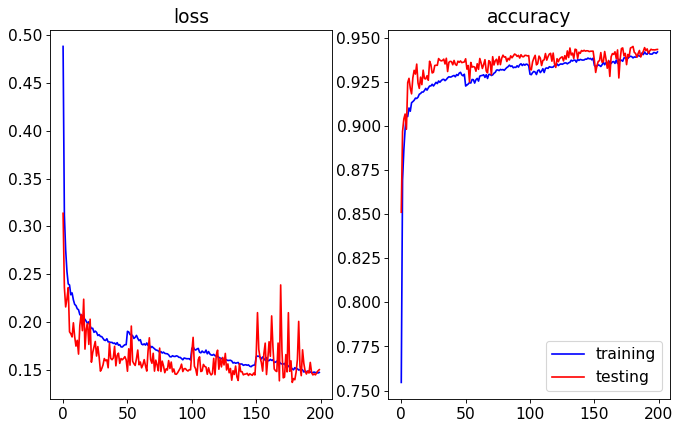

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


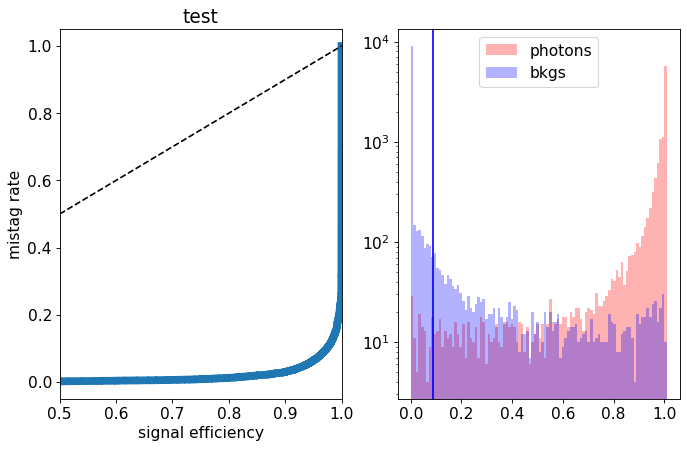

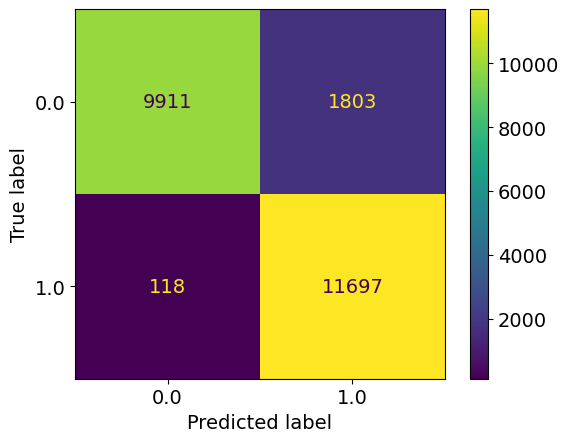

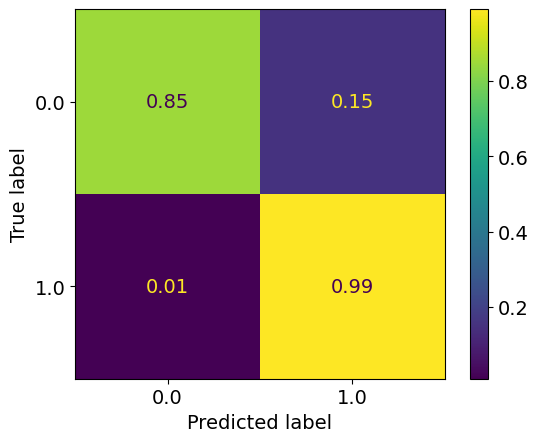

epoch: 200
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1590351207525867
train acc: 0.9354825


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.27it/s]


test loss: 0.1484826324507594
test acc: 0.9422415
epoch: 201
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.15665139561625802
train acc: 0.9366513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.02it/s]


test loss: 0.14824369605630636
test acc: 0.94173145
epoch: 202
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.15438644108688757
train acc: 0.93793696


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.03it/s]


test loss: 0.1997231125831604
test acc: 0.93561137
epoch: 203
Learning rate: 0.0009911810813034074


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.15787112238300835
train acc: 0.9361944


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.64it/s]


test loss: 0.1603518757969141
test acc: 0.9396489
epoch: 204
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.15554927327450674
train acc: 0.9366619


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]


test loss: 0.1733014749363065
test acc: 0.9384164
epoch: 205
Learning rate: 0.0009755900548115216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.15487529717053578
train acc: 0.9374057


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.84it/s]


test loss: 0.15213476475328208
test acc: 0.939904
epoch: 206
Learning rate: 0.0009649618679675239


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.1573839811192956
train acc: 0.93608814


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.55it/s]


test loss: 0.16110463701188565
test acc: 0.93922395
epoch: 207
Learning rate: 0.0009524986890515301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.15390777668565703
train acc: 0.938277


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.86it/s]


test loss: 0.18892814721912146
test acc: 0.93429387
epoch: 208
Learning rate: 0.0009382497045368369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.15552457963015623
train acc: 0.9374269


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.17703171726316214
test acc: 0.9360364
epoch: 209
Learning rate: 0.0009222711486555818


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.15257577370306488
train acc: 0.93919075


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.30it/s]


test loss: 0.17512314803898335
test acc: 0.94049895


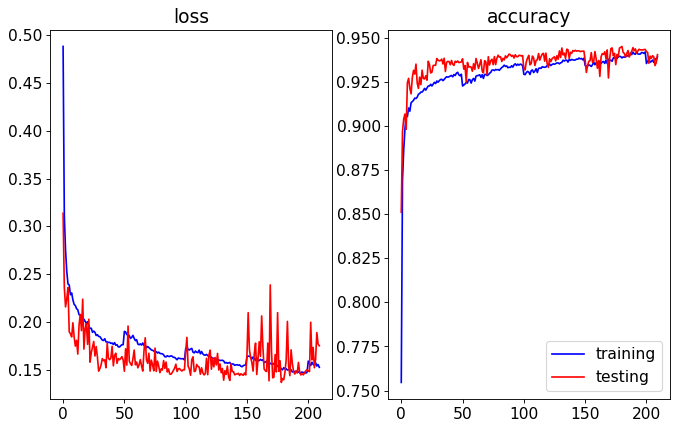

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


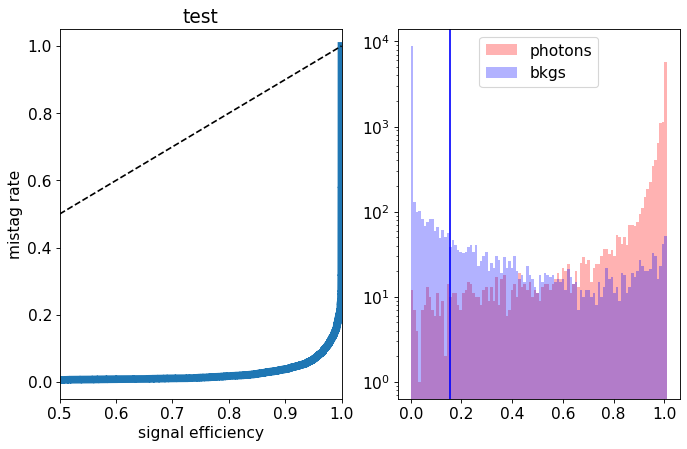

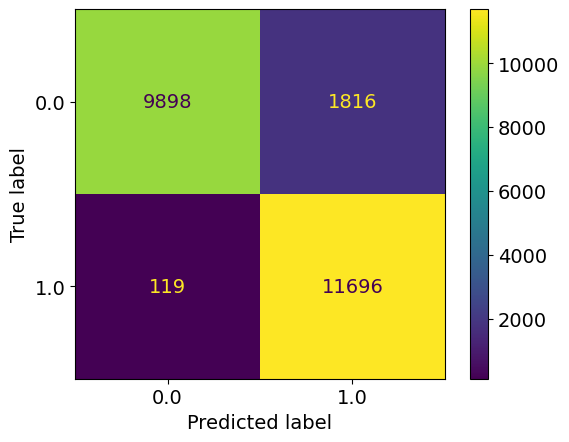

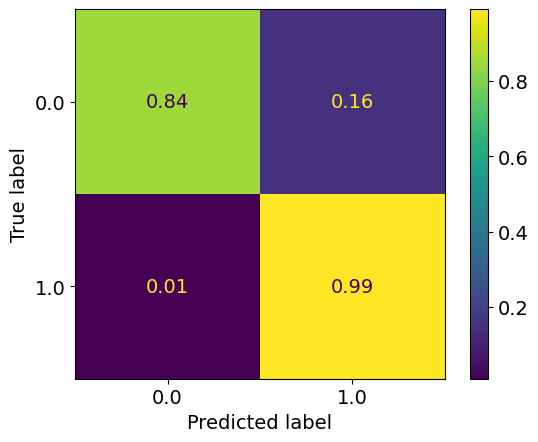

epoch: 210
Learning rate: 0.0009046260814679204


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.1532300830741597
train acc: 0.93810695


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.23it/s]


test loss: 0.14694776460528375
test acc: 0.9423265
epoch: 211
Learning rate: 0.0008853841399927779


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.15268277467056446
train acc: 0.93904203


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.05it/s]


test loss: 0.15219092201441525
test acc: 0.942794
epoch: 212
Learning rate: 0.0008646212633823498


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.1515810617785545
train acc: 0.93997705


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.1558452794328332
test acc: 0.942454
epoch: 213
Learning rate: 0.0008424193932249617


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.153305845275806
train acc: 0.9387126


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1501445561647415
test acc: 0.9410515
epoch: 214
Learning rate: 0.0008188661501590547


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.15231927175810384
train acc: 0.9392439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.16212998274713755
test acc: 0.93930894
epoch: 215
Learning rate: 0.0007940544880745573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.10it/s]


train loss: 0.1529177003984998
train acc: 0.9384789


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.28it/s]


test loss: 0.21182550564408303
test acc: 0.9373114
epoch: 216
Learning rate: 0.0007680823272663462


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1535509812888826
train acc: 0.93835133


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.14452948328107595
test acc: 0.942794
epoch: 217
Learning rate: 0.0007410521679875803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.15084730240569752
train acc: 0.94015765


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.1449440151453018
test acc: 0.943389
epoch: 218
Learning rate: 0.0007130706859280277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.15081283431144277
train acc: 0.9393183


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.1354546830058098
test acc: 0.94623655
new best acc: 0.94623655
epoch: 219
Learning rate: 0.0006842483112138542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.15014564487964485
train acc: 0.9395095


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]


test loss: 0.16625066865235566
test acc: 0.93913895


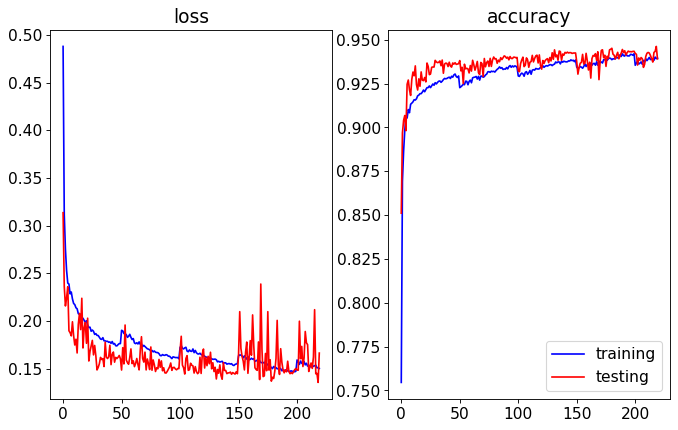

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


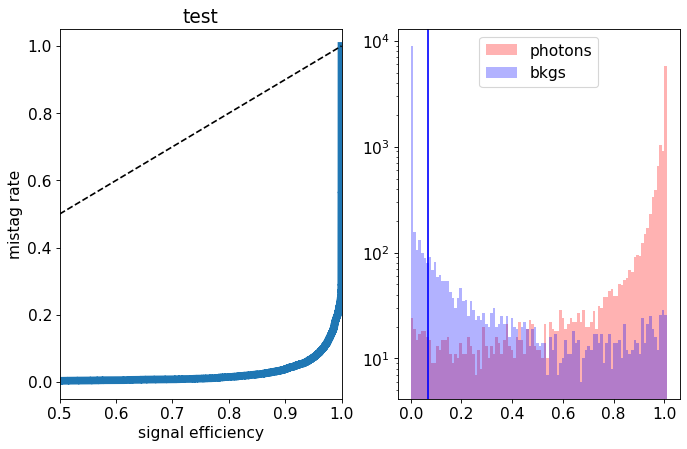

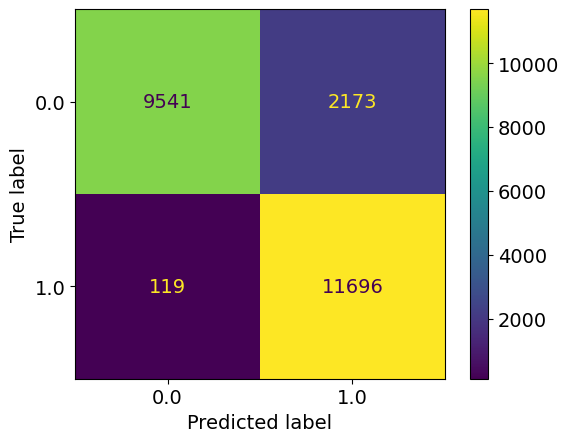

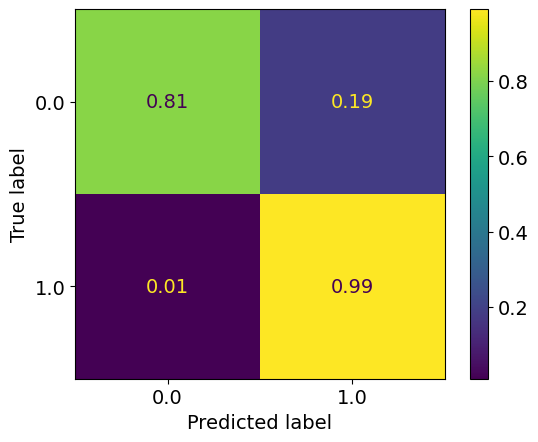

epoch: 220
Learning rate: 0.0006546987925903661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.11it/s]


train loss: 0.14977110310155115
train acc: 0.9397539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.25it/s]


test loss: 0.18397335801273584
test acc: 0.93922395
epoch: 221
Learning rate: 0.0006245387485076793


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.14942589767609432
train acc: 0.94101834


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.20516548603773116
test acc: 0.9367589
epoch: 222
Learning rate: 0.0005938872068809749


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.14847681215804093
train acc: 0.94098645


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.29it/s]


test loss: 0.13124776519834996
test acc: 0.94598156
epoch: 223
Learning rate: 0.000562865135341696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.1488543746008235
train acc: 0.9403808


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.05it/s]


test loss: 0.13903379011899233
test acc: 0.94632155
new best acc: 0.94632155
epoch: 224
Learning rate: 0.000531594963833572


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.14836892438162663
train acc: 0.9423465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.21it/s]


test loss: 0.16523971259593964
test acc: 0.93807644
epoch: 225
Learning rate: 0.0005002001014375628


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.14739334170415902
train acc: 0.9410821


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.13it/s]


test loss: 0.1867308473214507
test acc: 0.93425137
epoch: 226
Learning rate: 0.0004688044493325971


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.1473930116956401
train acc: 0.9414008


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.13530142586678268
test acc: 0.9469166
new best acc: 0.9469166
epoch: 227
Learning rate: 0.0004375319118142243


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.146268440944374
train acc: 0.9416346


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


test loss: 0.14630808550864458
test acc: 0.944154
epoch: 228
Learning rate: 0.000406505907300966


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.14482062452348174
train acc: 0.9425803


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.14812159724533558
test acc: 0.94470656
epoch: 229
Learning rate: 0.0003758488812582026


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.14584838504054745
train acc: 0.9419215


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1861996728926897
test acc: 0.9385864


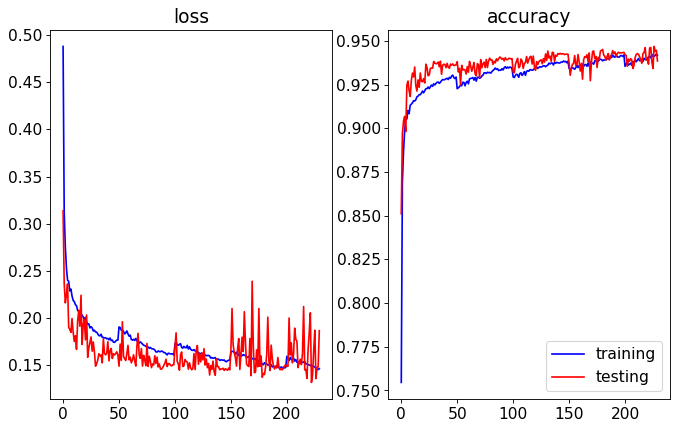

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


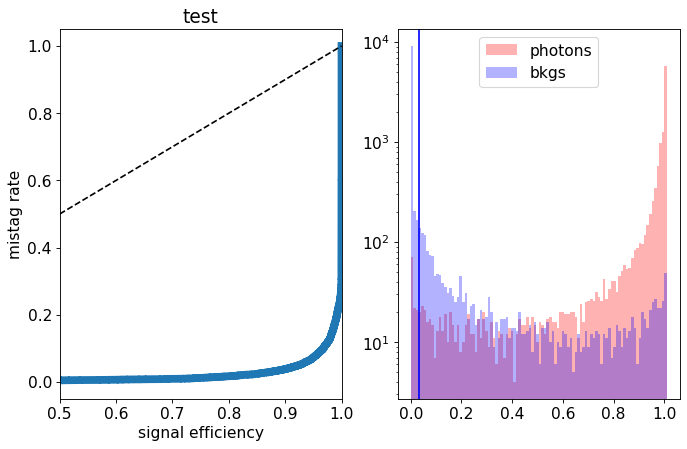

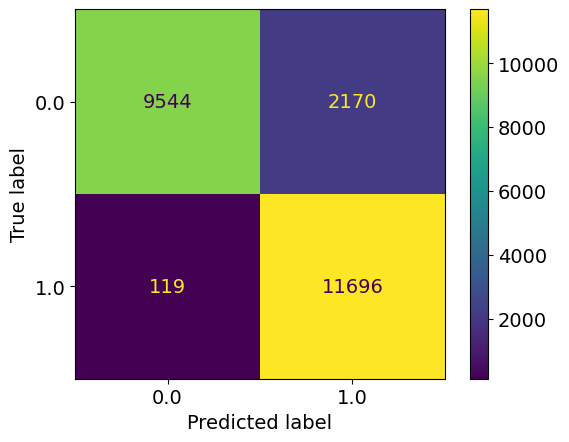

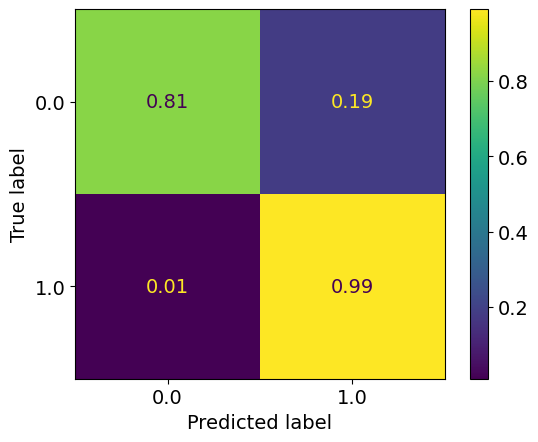

epoch: 230
Learning rate: 0.00034568182296186226


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.14674525091033072
train acc: 0.9419215


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]


test loss: 0.14764626566320657
test acc: 0.94470656
epoch: 231
Learning rate: 0.0003161237880090224


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.14555443263357612
train acc: 0.94203836


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.17it/s]


test loss: 0.13361443001776935
test acc: 0.9469591
new best acc: 0.9469591
epoch: 232
Learning rate: 0.00028729142845986054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.14485898927138868
train acc: 0.9424846


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.20it/s]


test loss: 0.13689876161515713
test acc: 0.94627905
epoch: 233
Learning rate: 0.0002592985324652648


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.14487916454198255
train acc: 0.94199586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.70it/s]


test loss: 0.13537600431591273
test acc: 0.94717157
new best acc: 0.94717157
epoch: 234
Learning rate: 0.00023225557519698832


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.14404902464834748
train acc: 0.9423359


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]


test loss: 0.14160997234284878
test acc: 0.94496155
epoch: 235
Learning rate: 0.00020626928285261698


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.14459132189583626
train acc: 0.9423678


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.14343716967850922
test acc: 0.94534403
epoch: 236
Learning rate: 0.00018144221145602646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14497596381386374
train acc: 0.9432178


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.77it/s]


test loss: 0.161025164462626
test acc: 0.9424115
epoch: 237
Learning rate: 0.00015787234211560875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.14464197801366732
train acc: 0.9426122


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.03it/s]


test loss: 0.13206751998513938
test acc: 0.94717157
epoch: 238
Learning rate: 0.00013565269433760168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14405054651248228
train acc: 0.94294155


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.25it/s]


test loss: 0.1421614445745945
test acc: 0.94585407
epoch: 239
Learning rate: 0.00011487095892059351


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14321118877951505
train acc: 0.9423146


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.14650454539805652
test acc: 0.9446215


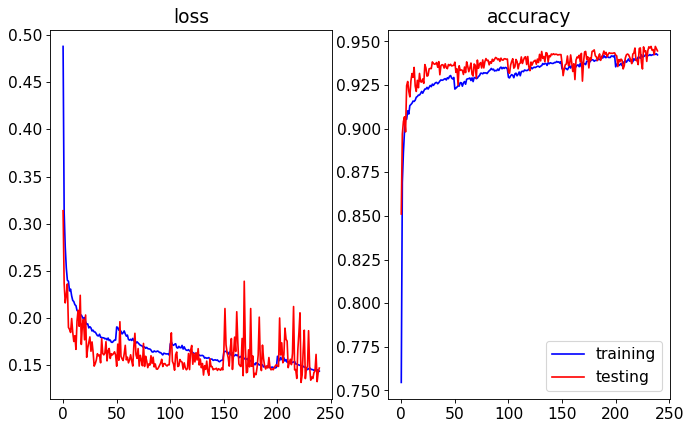

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


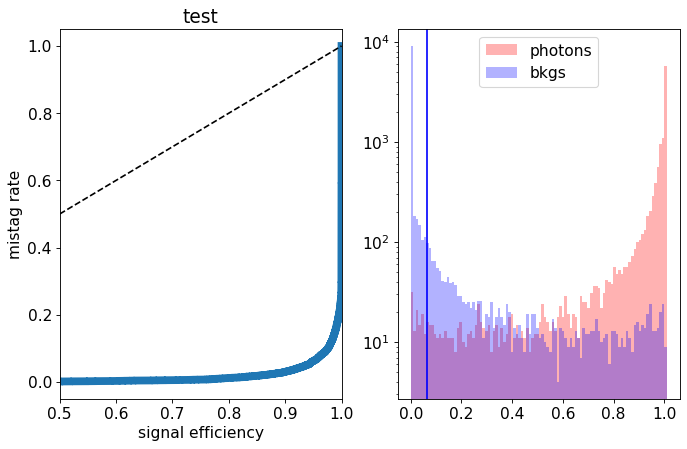

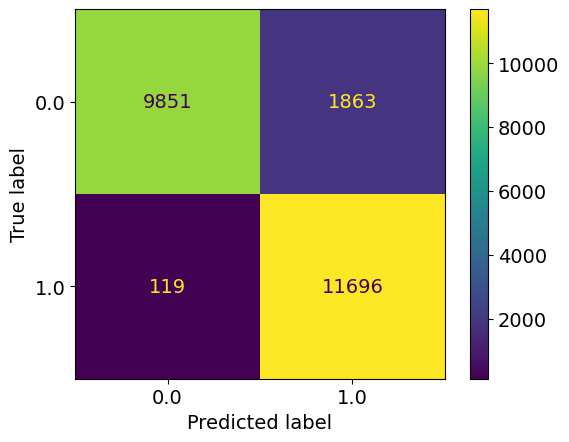

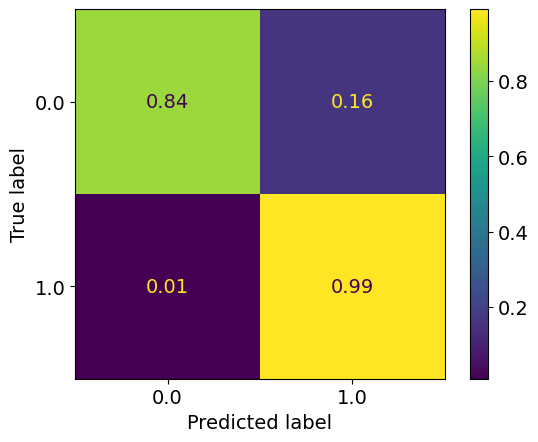

epoch: 240
Learning rate: 9.560915188000358e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.1421957334895043
train acc: 0.94377035


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.13809405583888293
test acc: 0.9457691
epoch: 241
Learning rate: 7.794329076833811e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14028579305121852
train acc: 0.94381285


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]


test loss: 0.1449041599407792
test acc: 0.944494
epoch: 242
Learning rate: 6.194309466864101e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.14194670205662965
train acc: 0.943324


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.47it/s]


test loss: 0.14659831039607524
test acc: 0.94381404
epoch: 243
Learning rate: 4.767170904512308e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.14256650223663658
train acc: 0.9436641


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.72it/s]


test loss: 0.1421688675880432
test acc: 0.944069
epoch: 244
Learning rate: 3.518545653686489e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14198587132487328
train acc: 0.94383407


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.31it/s]


test loss: 0.14260405898094178
test acc: 0.94593906
epoch: 245
Learning rate: 2.453361467809001e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.14193194938503254
train acc: 0.94397223


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.61it/s]


test loss: 0.14603904262185097
test acc: 0.94500405
epoch: 246
Learning rate: 1.5758221422251696e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.14216014818780742
train acc: 0.9435153


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.1427524771541357
test acc: 0.945514
epoch: 247
Learning rate: 8.893909237434717e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.14184791917444034
train acc: 0.944291


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.14281931798905134
test acc: 0.9456416
epoch: 248
Learning rate: 3.967768427826646e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1415217692969711
train acc: 0.9441316


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.14293878804892302
test acc: 0.9456416
epoch: 249
Learning rate: 9.992402206633334e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.14197733993553052
train acc: 0.94424844


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.93it/s]


test loss: 0.14520894791930913
test acc: 0.9455565


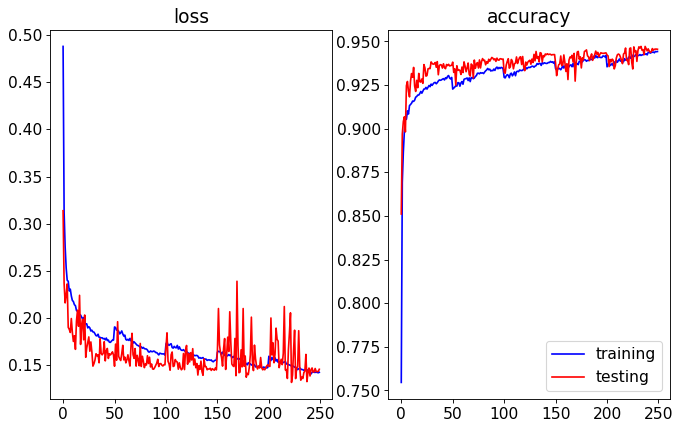

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.02it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


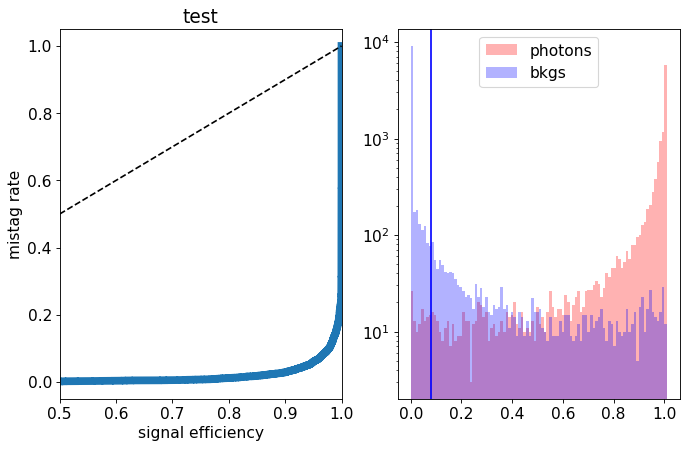

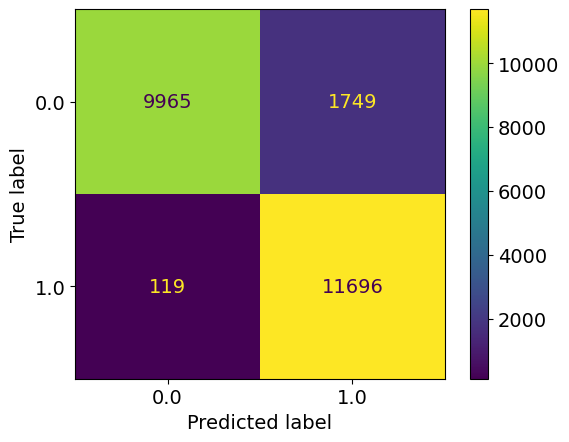

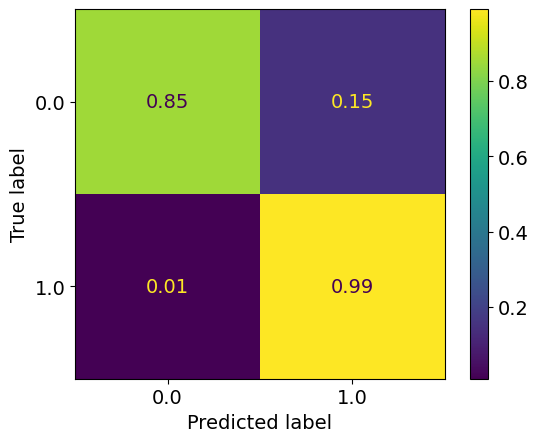

epoch: 250
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.15279504794413876
train acc: 0.9384151


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]


test loss: 0.16743000447750092
test acc: 0.9372264
epoch: 251
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1503512112862745
train acc: 0.94018954


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.25it/s]


test loss: 0.13843136914074422
test acc: 0.94513154
epoch: 252
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.15340261806727976
train acc: 0.93918014


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.1754651939496398
test acc: 0.93820393
epoch: 253
Learning rate: 0.0009911810813034074


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.1508579166356925
train acc: 0.9395202


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.24it/s]


test loss: 0.1535325925797224
test acc: 0.942029
epoch: 254
Learning rate: 0.0009843413049856063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.14871911448278244
train acc: 0.9406677


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.60it/s]


test loss: 0.13582040686160327
test acc: 0.945599
epoch: 255
Learning rate: 0.0009755900548115216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1491123174975632
train acc: 0.9403383


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.15550824590027332
test acc: 0.9418165
epoch: 256
Learning rate: 0.0009649618679675239


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.15293751557351679
train acc: 0.93930763


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.1420560644939542
test acc: 0.94164646
epoch: 257
Learning rate: 0.0009524986890515297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.15111809427950793
train acc: 0.9396158


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.62it/s]


test loss: 0.20720839388668538
test acc: 0.93480384
epoch: 258
Learning rate: 0.0009382497045368365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.14933471813513216
train acc: 0.9405083


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.16819859705865384
test acc: 0.941859
epoch: 259
Learning rate: 0.0009222711486555812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.15146546307832573
train acc: 0.93980706


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.14it/s]


test loss: 0.17029167674481868
test acc: 0.93896896


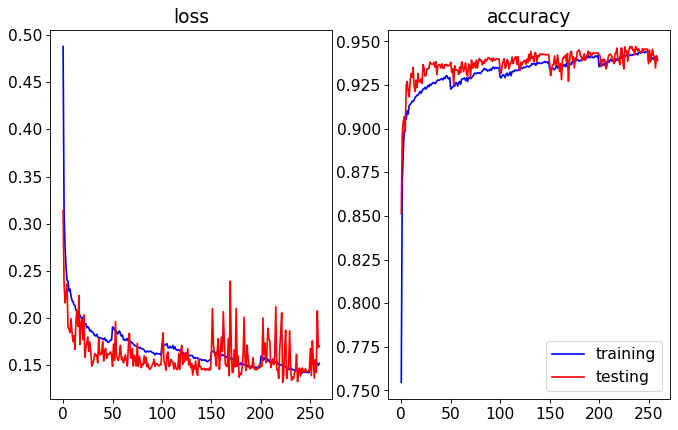

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.82it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


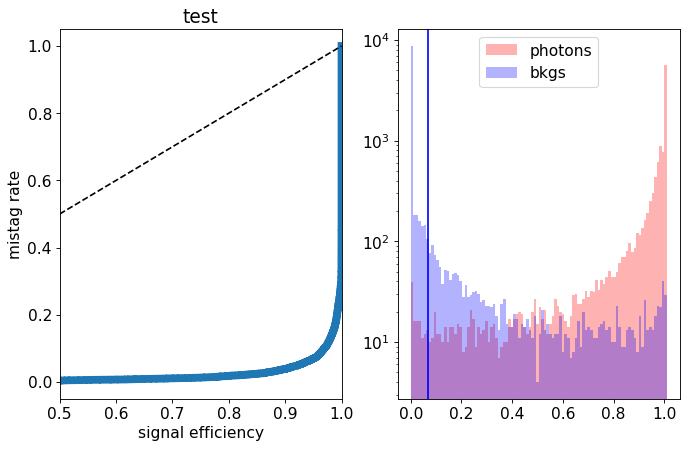

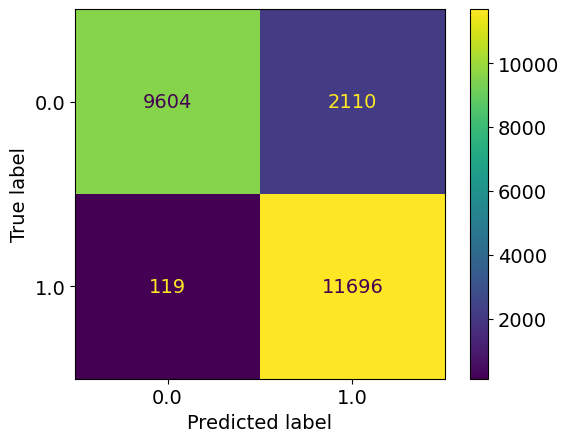

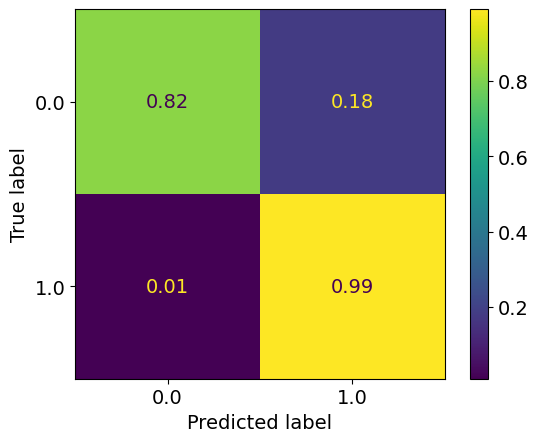

epoch: 260
Learning rate: 0.0009046260814679198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.15001678139350977
train acc: 0.9402214


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]


test loss: 0.13886108249425888
test acc: 0.94521654
epoch: 261
Learning rate: 0.0008853841399927774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14759830290534695
train acc: 0.94180465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.189661917835474
test acc: 0.9383739
epoch: 262
Learning rate: 0.0008646212633823492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.1480915875286813
train acc: 0.941539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.16564268246293068
test acc: 0.942029
epoch: 263
Learning rate: 0.000842419393224961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14769217808535146
train acc: 0.94098645


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.17it/s]


test loss: 0.16890886910259723
test acc: 0.94011647
epoch: 264
Learning rate: 0.0008188661501590542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.29it/s]


train loss: 0.1471556568411505
train acc: 0.941794


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.25it/s]


test loss: 0.13700334019958973
test acc: 0.94606656
epoch: 265
Learning rate: 0.0007940544880745564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14724816799543466
train acc: 0.9414646


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.123152313567698
test acc: 0.9492966
new best acc: 0.9492966
epoch: 266
Learning rate: 0.0007680823272663455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.61it/s]


train loss: 0.1476535345338712
train acc: 0.9415496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.87it/s]


test loss: 0.1463552290573716
test acc: 0.94479156
epoch: 267
Learning rate: 0.0007410521679875796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:31<00:00,  5.03it/s]


train loss: 0.14530515129778795
train acc: 0.94194275


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.1317306874319911
test acc: 0.9478941
epoch: 268
Learning rate: 0.0007130706859280269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1468385198408631
train acc: 0.942304


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.15843762122094632
test acc: 0.9445365
epoch: 269
Learning rate: 0.0006842483112138533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.09it/s]


train loss: 0.14629711784944413
train acc: 0.9422934


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.21it/s]


test loss: 0.1571411507204175
test acc: 0.942369


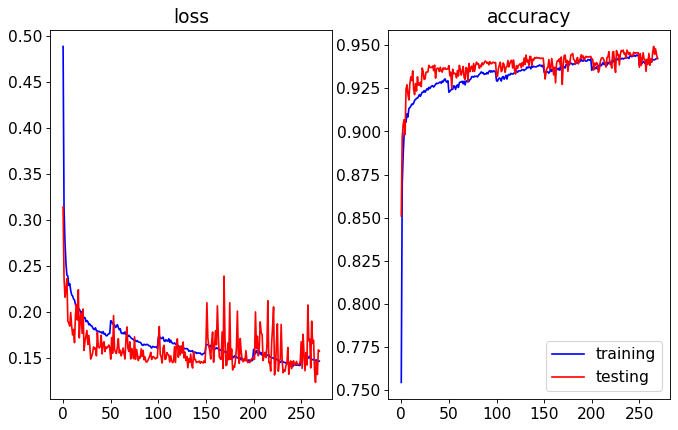

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.62it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


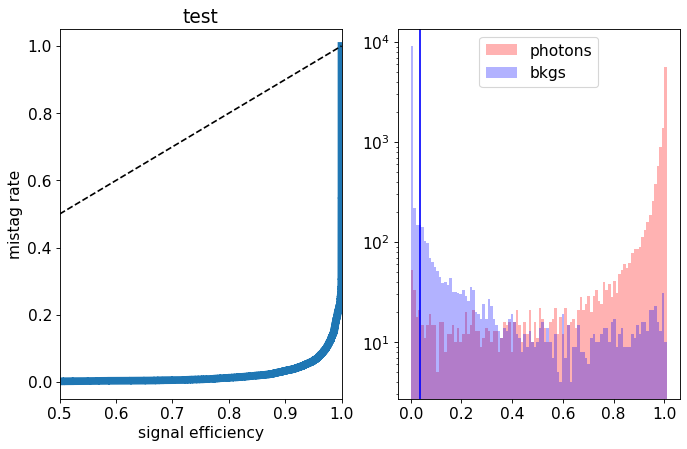

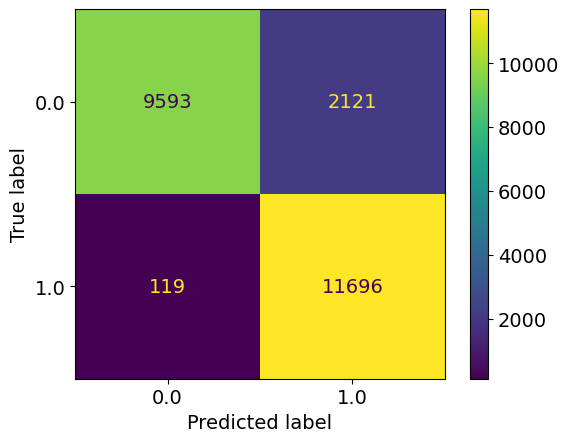

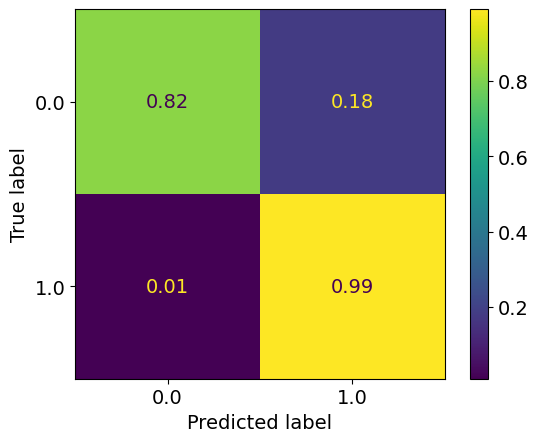

epoch: 270
Learning rate: 0.0006546987925903651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.14471273522847777
train acc: 0.9427928


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.87it/s]


test loss: 0.15757454391568898
test acc: 0.94479156
epoch: 271
Learning rate: 0.0006245387485076785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.14271660590437568
train acc: 0.9432709


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.20it/s]


test loss: 0.13876463565975428
test acc: 0.9466191
epoch: 272
Learning rate: 0.000593887206880974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.14482094964404016
train acc: 0.9423146


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.03it/s]


test loss: 0.13059376664459704
test acc: 0.9488716
epoch: 273
Learning rate: 0.0005628651353416952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.1443414572792448
train acc: 0.9430478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.13950056545436382
test acc: 0.94636405
epoch: 274
Learning rate: 0.000531594963833571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.14360999923412968
train acc: 0.94287777


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]


test loss: 0.1431443126872182
test acc: 0.9475541
epoch: 275
Learning rate: 0.000500200101437562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14316248485616817
train acc: 0.9435259


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.69it/s]


test loss: 0.13659944981336594
test acc: 0.9483616
epoch: 276
Learning rate: 0.0004688044493325963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.1423313933762775
train acc: 0.94373846


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.40it/s]


test loss: 0.14091873895376922
test acc: 0.94734156
epoch: 277
Learning rate: 0.0004375319118142234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.14255235325189153
train acc: 0.9443972


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.15368567407131195
test acc: 0.94483405
epoch: 278
Learning rate: 0.000406505907300965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.14278355890968045
train acc: 0.9433984


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.17582012843340636
test acc: 0.94151896
epoch: 279
Learning rate: 0.00037584888125820174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.14201423421407203
train acc: 0.9437597


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.20it/s]


test loss: 0.1479893485084176
test acc: 0.945599


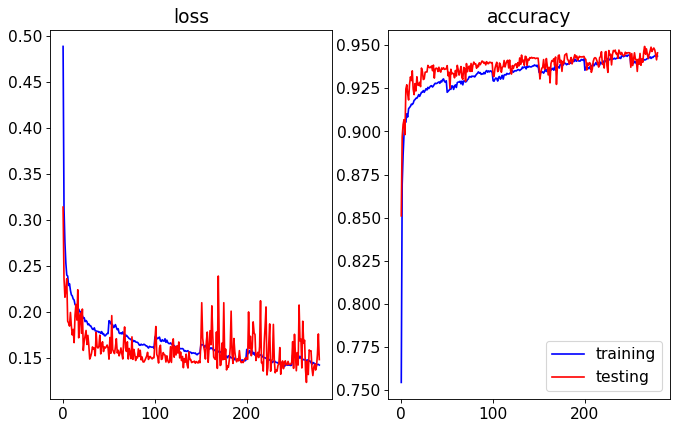

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.17it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


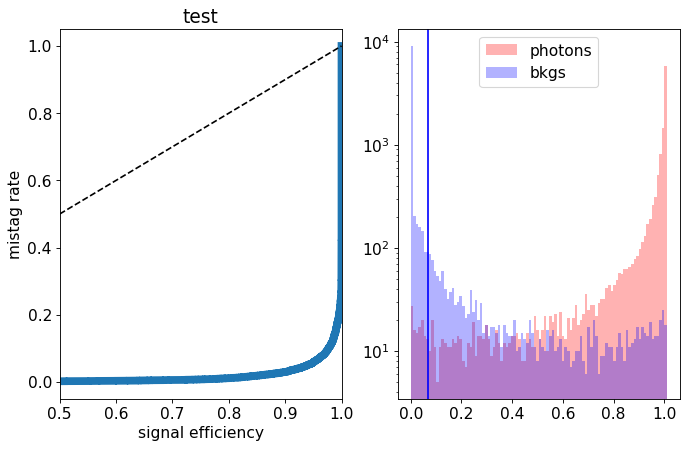

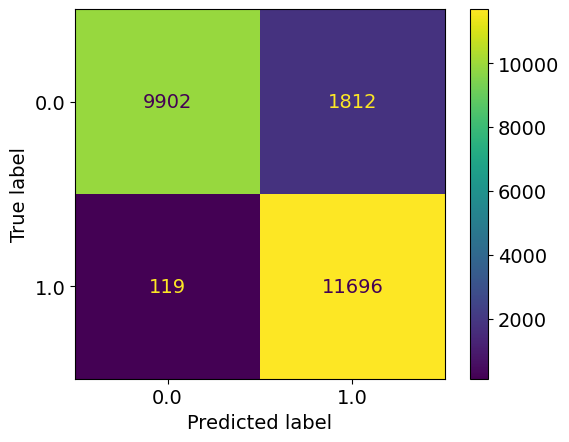

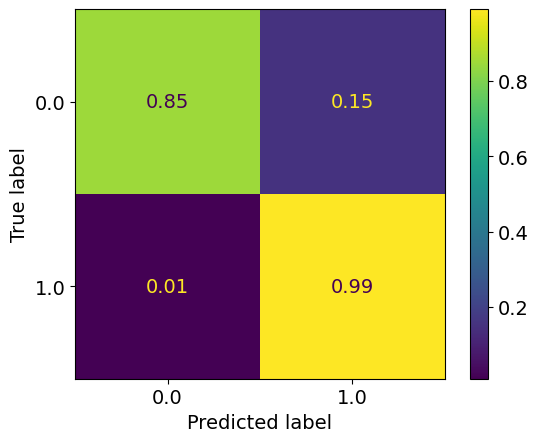

epoch: 280
Learning rate: 0.00034568182296186134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.14146954794028763
train acc: 0.94383407


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.44it/s]


test loss: 0.1497702918946743
test acc: 0.9471291
epoch: 281
Learning rate: 0.0003161237880090216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.14257204992945788
train acc: 0.9435897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.1361066771671176
test acc: 0.9484041
epoch: 282
Learning rate: 0.0002872914284598598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14033273132933174
train acc: 0.9444503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.44it/s]


test loss: 0.14541976265609263
test acc: 0.94619405
epoch: 283
Learning rate: 0.00025929853246526403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.13859082710970738
train acc: 0.9455873


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.1417655859142542
test acc: 0.94848907
epoch: 284
Learning rate: 0.0002322555751969876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.13923653893789667
train acc: 0.9444503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.18426971435546874
test acc: 0.943049
epoch: 285
Learning rate: 0.00020626928285261644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1389587371592309
train acc: 0.945141


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]


test loss: 0.16100981850177049
test acc: 0.94632155
epoch: 286
Learning rate: 0.00018144221145602573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.13916047377761004
train acc: 0.945226


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.1758004268631339
test acc: 0.94513154
epoch: 287
Learning rate: 0.00015787234211560807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.1377038604514614
train acc: 0.94566166


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.44it/s]


test loss: 0.14055245351046325
test acc: 0.9491266
epoch: 288
Learning rate: 0.00013565269433760108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.13781089397372714
train acc: 0.94592726


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.14it/s]


test loss: 0.1643587676808238
test acc: 0.9470441
epoch: 289
Learning rate: 0.00011487095892059296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.13812992916365338
train acc: 0.94592726


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.04it/s]


test loss: 0.18719389252364635
test acc: 0.9436865


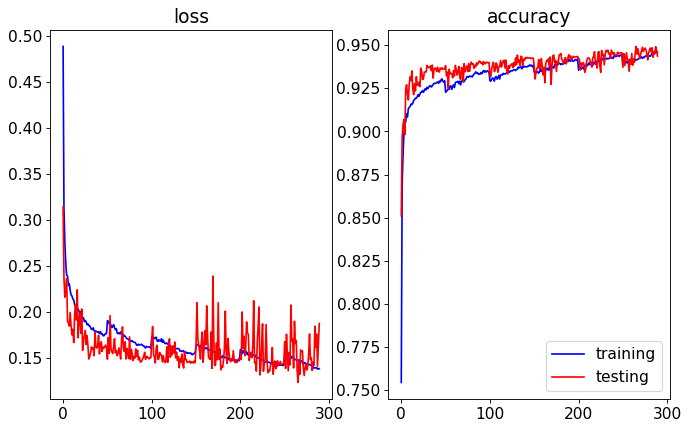

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.04it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


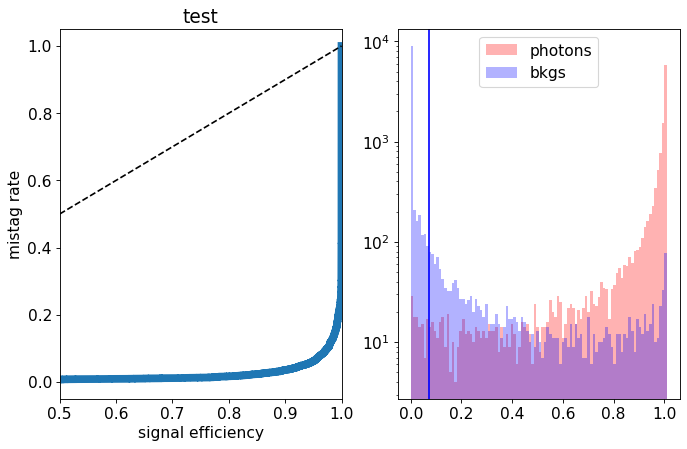

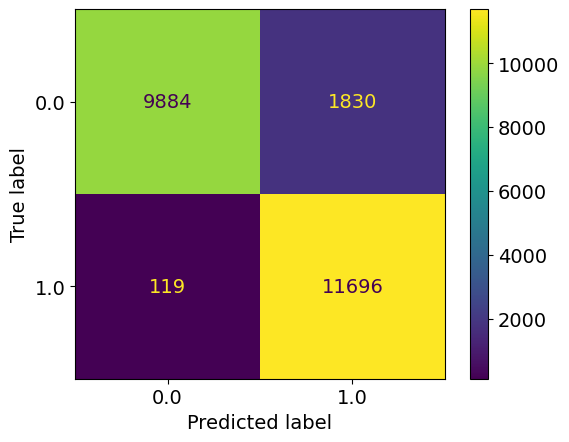

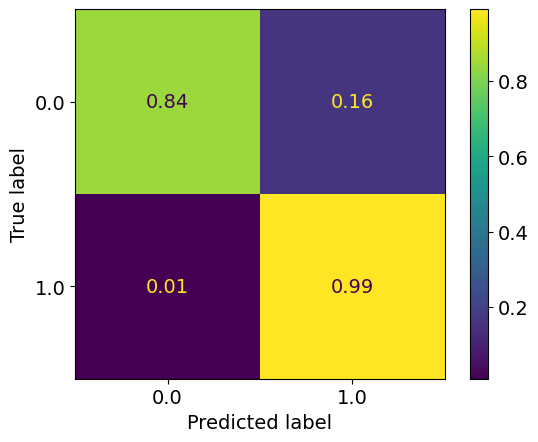

epoch: 290
Learning rate: 9.56091518800029e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.13827097615238967
train acc: 0.94590604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.20it/s]


test loss: 0.15532078500837088
test acc: 0.9477666
epoch: 291
Learning rate: 7.794329076833767e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.13786920307168535
train acc: 0.9455979


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]


test loss: 0.1600625028833747
test acc: 0.94746906
epoch: 292
Learning rate: 6.194309466864034e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13845520566223532
train acc: 0.9453216


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.15760220922529697
test acc: 0.9477241
epoch: 293
Learning rate: 4.767170904512269e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13652145226669918
train acc: 0.9463204


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.86it/s]


test loss: 0.16114206984639168
test acc: 0.94738406
epoch: 294
Learning rate: 3.5185456536864556e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.13783169376432516
train acc: 0.9460229


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.43it/s]


test loss: 0.15581066273152827
test acc: 0.9477241
epoch: 295
Learning rate: 2.453361467808979e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13753694053857948
train acc: 0.94604415


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.47it/s]


test loss: 0.14584107417613268
test acc: 0.9487441
epoch: 296
Learning rate: 1.5758221422251472e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.13744337168658616
train acc: 0.9461929


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]


test loss: 0.1509494984522462
test acc: 0.9482341
epoch: 297
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.13666532373732063
train acc: 0.9464267


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.14856792204082012
test acc: 0.9484041
epoch: 298
Learning rate: 3.967768427826535e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13562960471886737
train acc: 0.9460973


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]


test loss: 0.15110383611172437
test acc: 0.94848907
epoch: 299
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.09it/s]


train loss: 0.13553189177801656
train acc: 0.9464054


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]


test loss: 0.14845916647464036
test acc: 0.9484466


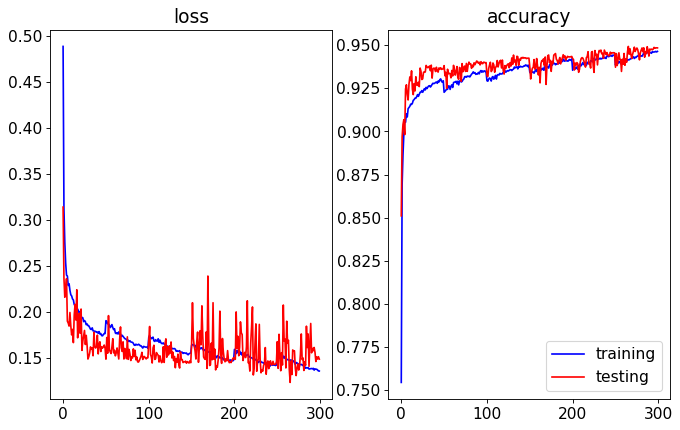

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.91it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


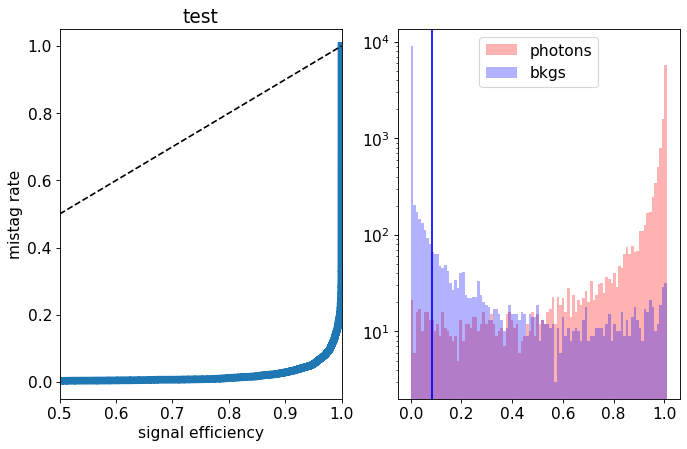

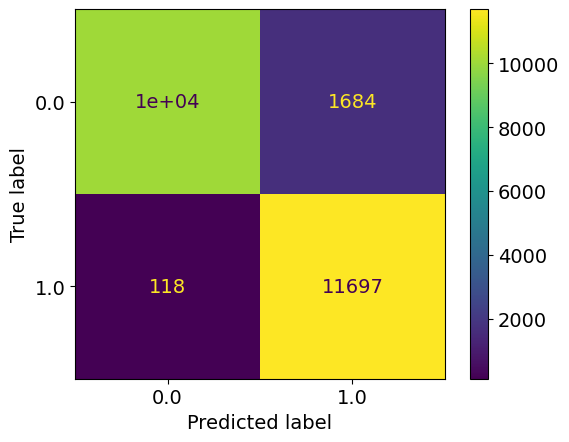

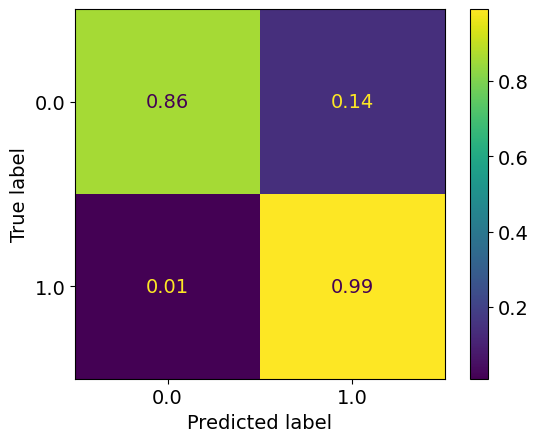

epoch: 300
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.14689106299619006
train acc: 0.94094396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.1316201627254486
test acc: 0.9481916
epoch: 301
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.1484988787846201
train acc: 0.9414327


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]


test loss: 0.12446715403348207
test acc: 0.9492966
epoch: 302
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14845173905609518
train acc: 0.94090146


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.24it/s]


test loss: 0.17659973725676537
test acc: 0.9419015
epoch: 303
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.14624880111900865
train acc: 0.94193214


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.1499174589291215
test acc: 0.94041395
epoch: 304
Learning rate: 0.0009843413049856061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:27<00:00,  5.62it/s]


train loss: 0.14684013979639976
train acc: 0.94212335


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.27it/s]


test loss: 0.15674847774207593
test acc: 0.94649154
epoch: 305
Learning rate: 0.0009755900548115212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14484906476584208
train acc: 0.94269717


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.25it/s]


test loss: 0.14872443582862616
test acc: 0.94717157
epoch: 306
Learning rate: 0.0009649618679675236


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.29it/s]


train loss: 0.14333009866962007
train acc: 0.9437172


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.18179062493145465
test acc: 0.942964
epoch: 307
Learning rate: 0.0009524986890515297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.14568916238417293
train acc: 0.9414859


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.1629187036305666
test acc: 0.943389
epoch: 308
Learning rate: 0.0009382497045368365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.145193363261071
train acc: 0.94293094


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.17it/s]


test loss: 0.14636184442788364
test acc: 0.9455565
epoch: 309
Learning rate: 0.0009222711486555812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14369525432966318
train acc: 0.94228274


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.13294077571481466
test acc: 0.9489566


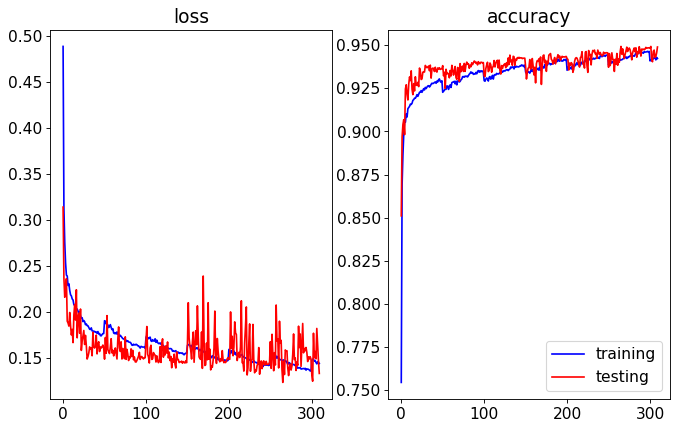

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


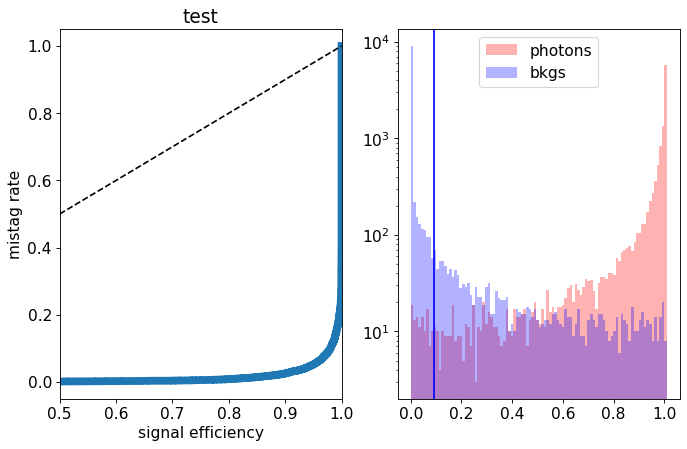

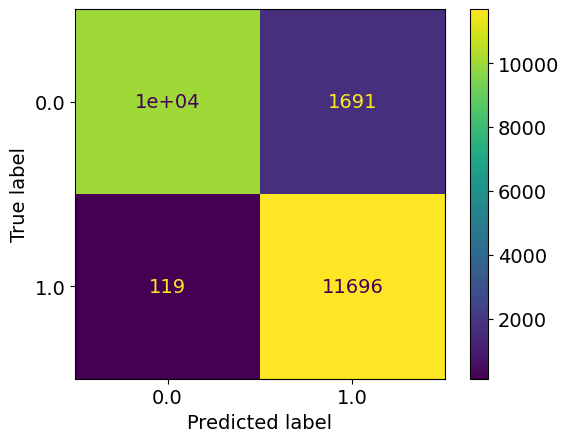

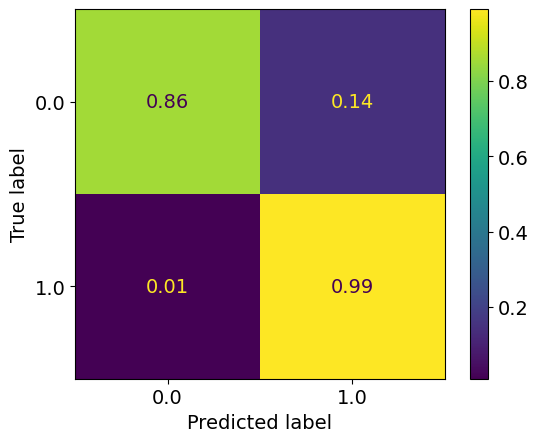

epoch: 310
Learning rate: 0.0009046260814679198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14498185499268731
train acc: 0.94212335


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.73it/s]


test loss: 0.14878982566297055
test acc: 0.94479156
epoch: 311
Learning rate: 0.0008853841399927774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14466522093031817
train acc: 0.9434728


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.18693452049046755
test acc: 0.94045645
epoch: 312
Learning rate: 0.0008646212633823492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.14279166647013586
train acc: 0.9433984


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.16691552363336087
test acc: 0.94385654
epoch: 313
Learning rate: 0.000842419393224961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.14183044855951504
train acc: 0.9445035


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.58it/s]


test loss: 0.13255684096366166
test acc: 0.9490416
epoch: 314
Learning rate: 0.0008188661501590542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14248079317770188
train acc: 0.9434516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.84it/s]


test loss: 0.17576695568859577
test acc: 0.9431765
epoch: 315
Learning rate: 0.0007940544880745564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.1430352819478436
train acc: 0.9436216


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.14321230705827476
test acc: 0.9467891
epoch: 316
Learning rate: 0.0007680823272663455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.14179360861801038
train acc: 0.944291


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.11it/s]


test loss: 0.1277068242430687
test acc: 0.95057166
new best acc: 0.95057166
epoch: 317
Learning rate: 0.0007410521679875796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.14162177497604092
train acc: 0.9443016


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.03it/s]


test loss: 0.14389720968902112
test acc: 0.9475541
epoch: 318
Learning rate: 0.0007130706859280269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.30it/s]


train loss: 0.1409323969084746
train acc: 0.9453535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.17it/s]


test loss: 0.15444088466465472
test acc: 0.9480641
epoch: 319
Learning rate: 0.0006842483112138533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:27<00:00,  5.61it/s]


train loss: 0.13964264953781844
train acc: 0.9455235


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.27it/s]


test loss: 0.18459494430571793
test acc: 0.94160396


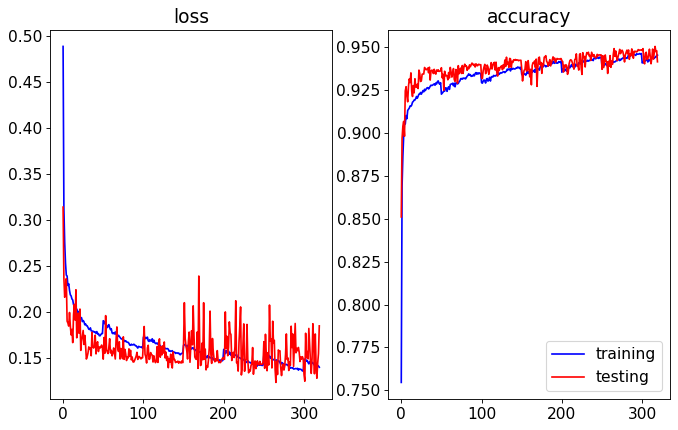

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


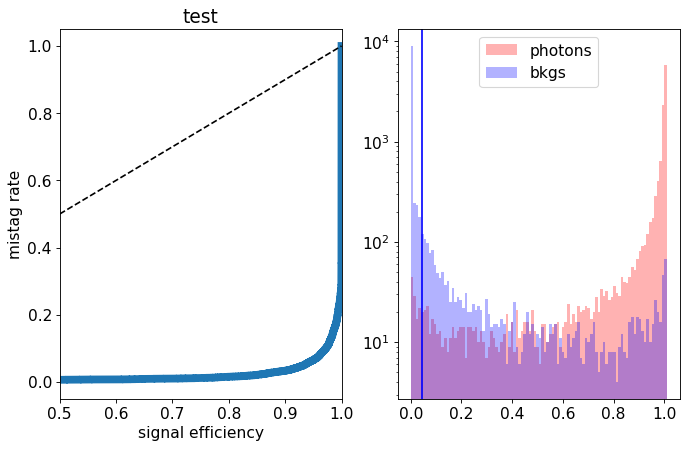

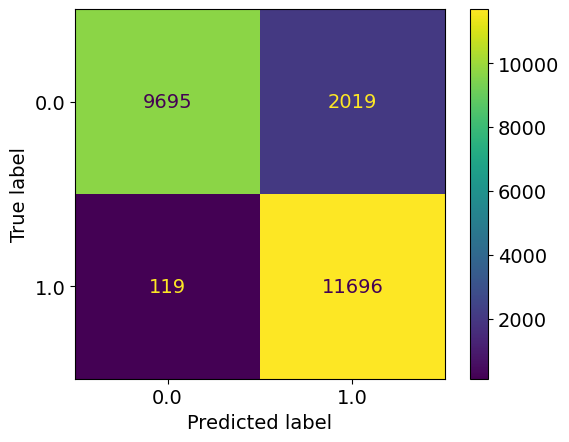

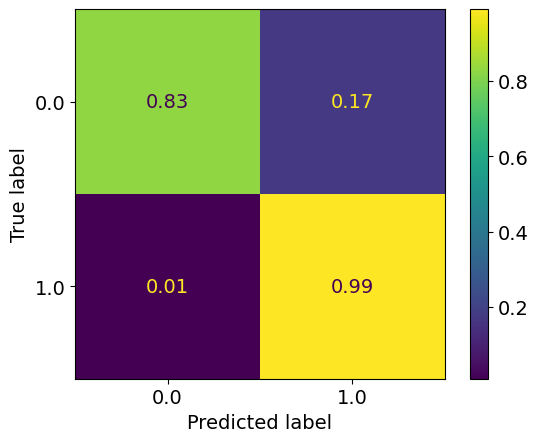

epoch: 320
Learning rate: 0.0006546987925903651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.29it/s]


train loss: 0.1405692337804539
train acc: 0.9451835


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.17301511913537979
test acc: 0.94627905
epoch: 321
Learning rate: 0.0006245387485076785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1396523523767283
train acc: 0.9445991


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.71it/s]


test loss: 0.17640410400927067
test acc: 0.9431765
epoch: 322
Learning rate: 0.000593887206880974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.13903179807457955
train acc: 0.9460229


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.95it/s]


test loss: 0.17748089283704757
test acc: 0.9441965
epoch: 323
Learning rate: 0.0005628651353416952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.13861673909008124
train acc: 0.945226


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.17265235260128975
test acc: 0.94474906
epoch: 324
Learning rate: 0.000531594963833571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.139243801735389
train acc: 0.9457679


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.24it/s]


test loss: 0.15706936754286288
test acc: 0.94521654
epoch: 325
Learning rate: 0.000500200101437562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13760349695469923
train acc: 0.94620353


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.44it/s]


test loss: 0.1570605719462037
test acc: 0.9480641
epoch: 326
Learning rate: 0.0004688044493325963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.13757185713880382
train acc: 0.94704294


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.23it/s]


test loss: 0.1620331799611449
test acc: 0.9456841
epoch: 327
Learning rate: 0.0004375319118142234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13666181014791415
train acc: 0.94604415


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.20it/s]


test loss: 0.12995125241577626
test acc: 0.9498916
epoch: 328
Learning rate: 0.000406505907300965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.13688834742376
train acc: 0.9461929


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]


test loss: 0.16710367612540722
test acc: 0.94627905
epoch: 329
Learning rate: 0.00037584888125820174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.13620663448503822
train acc: 0.9465648


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.1313681287690997
test acc: 0.9498491


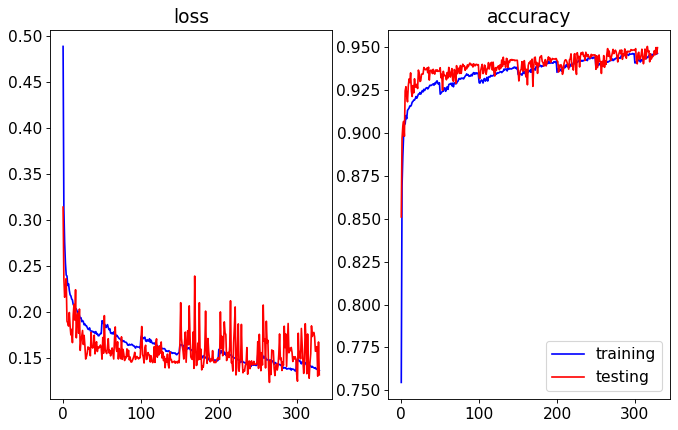

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.65it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


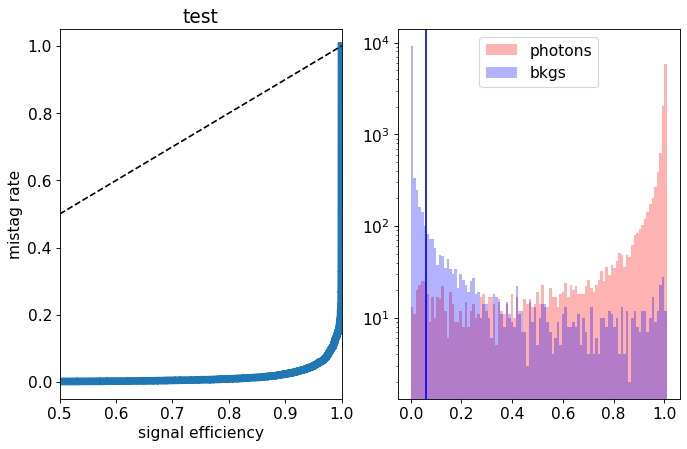

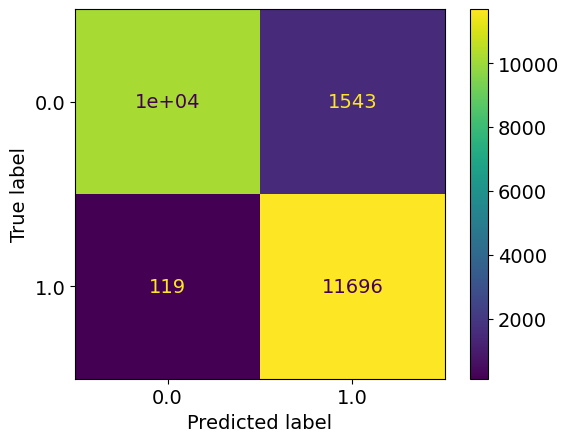

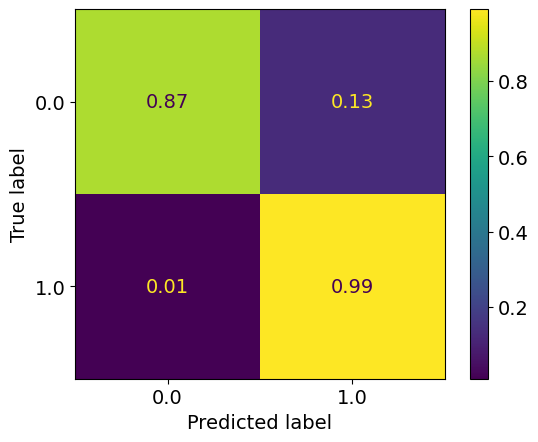

epoch: 330
Learning rate: 0.00034568182296186134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.23it/s]


train loss: 0.1358383665703664
train acc: 0.94705355


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.54it/s]


test loss: 0.13604485541582106
test acc: 0.9492541
epoch: 331
Learning rate: 0.0003161237880090216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.13524617890643467
train acc: 0.9466923


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.14it/s]


test loss: 0.14603758342564105
test acc: 0.9470866
epoch: 332
Learning rate: 0.0002872914284598598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.13522062075745528
train acc: 0.94712794


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.63it/s]


test loss: 0.13944473005831243
test acc: 0.94955164
epoch: 333
Learning rate: 0.00025929853246526403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.09it/s]


train loss: 0.13434487187368854
train acc: 0.94694734


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]


test loss: 0.14010616391897202
test acc: 0.9491266
epoch: 334
Learning rate: 0.0002322555751969876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13487955462780726
train acc: 0.9470642


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.76it/s]


test loss: 0.12902372013777494
test acc: 0.95057166
epoch: 335
Learning rate: 0.00020626928285261644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.13486897518300706
train acc: 0.9471492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.15124709568917752
test acc: 0.9484041
epoch: 336
Learning rate: 0.00018144221145602573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13410045975332807
train acc: 0.9483924


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]


test loss: 0.13241944182664156
test acc: 0.9504016
epoch: 337
Learning rate: 0.00015787234211560807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1338814319034291
train acc: 0.9474255


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.13257893733680248
test acc: 0.95082664
new best acc: 0.95082664
epoch: 338
Learning rate: 0.00013565269433760108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.13281711674989408
train acc: 0.9481055


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]


test loss: 0.14312775135040284
test acc: 0.9493816
epoch: 339
Learning rate: 0.00011487095892059296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.13160820851090607
train acc: 0.94770175


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.1421946244314313
test acc: 0.9499341


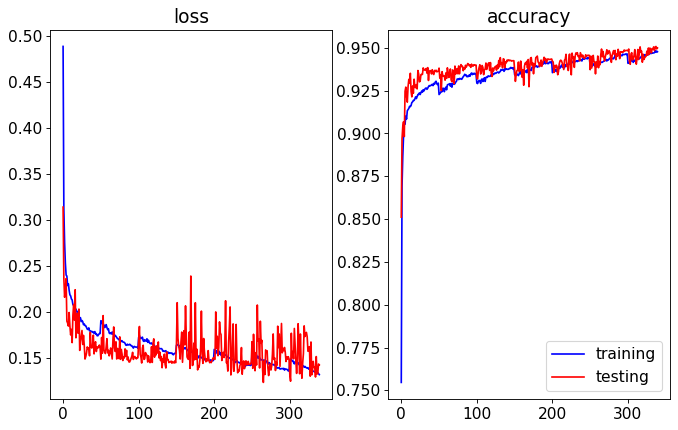

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


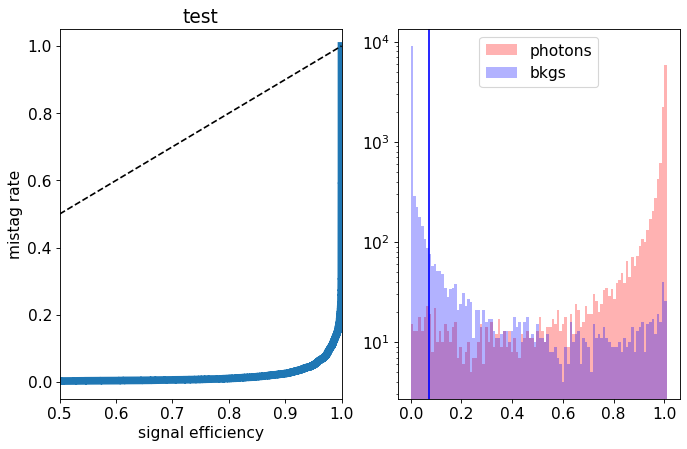

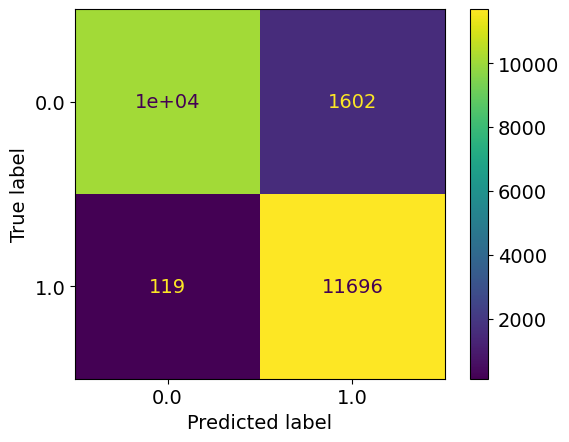

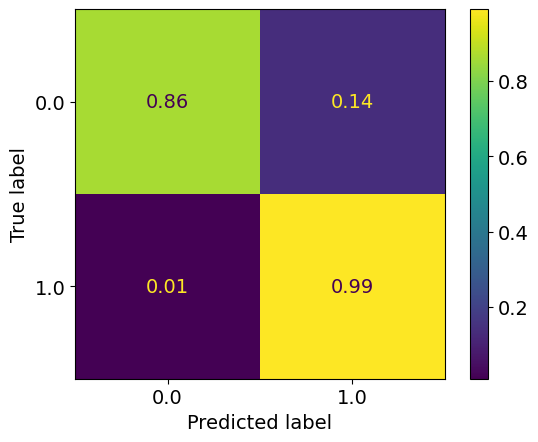

epoch: 340
Learning rate: 9.56091518800029e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.1324250884116835
train acc: 0.9484561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.1387468159198761
test acc: 0.95044416
epoch: 341
Learning rate: 7.794329076833767e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1323898660054632
train acc: 0.9484455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.24it/s]


test loss: 0.12402495183050632
test acc: 0.95235664
new best acc: 0.95235664
epoch: 342
Learning rate: 6.194309466864034e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13189763737142465
train acc: 0.9489874


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.26it/s]


test loss: 0.12822712250053883
test acc: 0.9515492
epoch: 343
Learning rate: 4.767170904512269e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1327368744714245
train acc: 0.94793546


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.17it/s]


test loss: 0.13165323063731194
test acc: 0.95074165
epoch: 344
Learning rate: 3.5185456536864556e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13234397598132966
train acc: 0.94822234


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.93it/s]


test loss: 0.12950115296989678
test acc: 0.9511666
epoch: 345
Learning rate: 2.453361467808979e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.13097854713155965
train acc: 0.94872177


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.13048864398151636
test acc: 0.95091164
epoch: 346
Learning rate: 1.5758221422251472e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13093613287445846
train acc: 0.9483074


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.1300027972087264
test acc: 0.9514217
epoch: 347
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13168552902283942
train acc: 0.94917864


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:05<00:00,  7.99it/s]


test loss: 0.13252694383263589
test acc: 0.95099664
epoch: 348
Learning rate: 3.967768427826535e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.1315134045234911
train acc: 0.94888115


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.60it/s]


test loss: 0.1326313955709338
test acc: 0.95086914
epoch: 349
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.1313473632096485
train acc: 0.9488174


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.13it/s]


test loss: 0.13480859007686377
test acc: 0.9511666


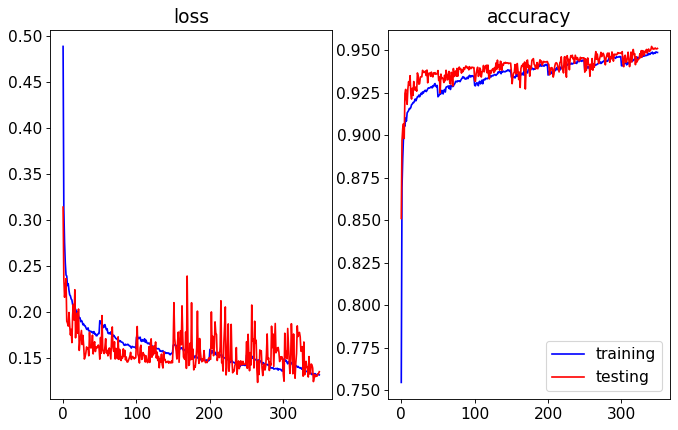

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


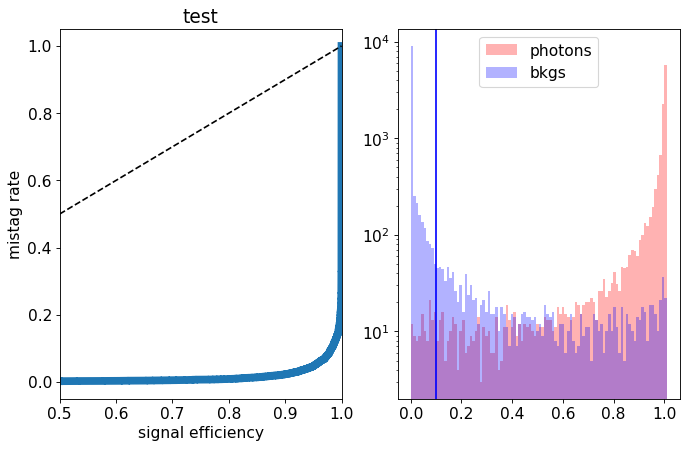

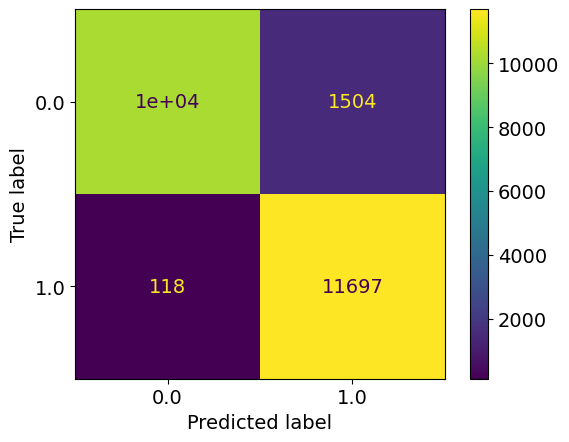

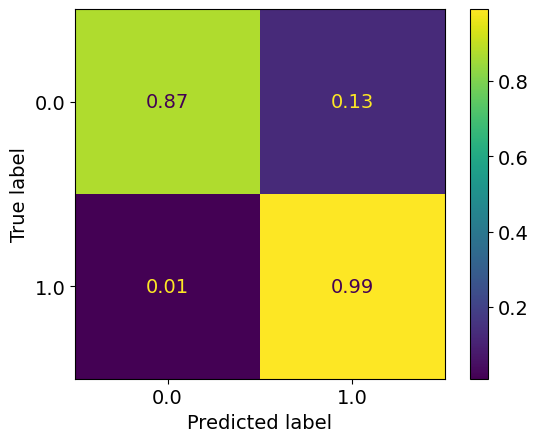

epoch: 350
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.24it/s]


train loss: 0.1425626978847631
train acc: 0.94402534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.90it/s]


test loss: 0.17438572328537702
test acc: 0.944239
epoch: 351
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.143003254132286
train acc: 0.9445672


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.11it/s]


test loss: 0.12236165199428797
test acc: 0.9512091
epoch: 352
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.12it/s]


train loss: 0.1424487919374636
train acc: 0.94416344


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.14728013314306737
test acc: 0.9476391
epoch: 353
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14206424146700816
train acc: 0.94407845


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.31it/s]


test loss: 0.2757696844637394
test acc: 0.93352884
epoch: 354
Learning rate: 0.0009843413049856061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.14043140506288807
train acc: 0.94500285


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]


test loss: 0.1420159537345171
test acc: 0.94508904
epoch: 355
Learning rate: 0.0009755900548115212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.14034632370350467
train acc: 0.9463417


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.12708069607615471
test acc: 0.9494666
epoch: 356
Learning rate: 0.0009649618679675236


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.14015505220859673
train acc: 0.94561917


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.13124452754855156
test acc: 0.9484466
epoch: 357
Learning rate: 0.0009524986890515297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.1370563723953666
train acc: 0.9465117


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.13160572489723563
test acc: 0.95210165
epoch: 358
Learning rate: 0.0009382497045368365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13916157764993656
train acc: 0.9451091


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]


test loss: 0.15728915054351092
test acc: 0.94606656
epoch: 359
Learning rate: 0.0009222711486555812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13797337500153073
train acc: 0.94590604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.47it/s]


test loss: 0.12659927122294903
test acc: 0.9515067


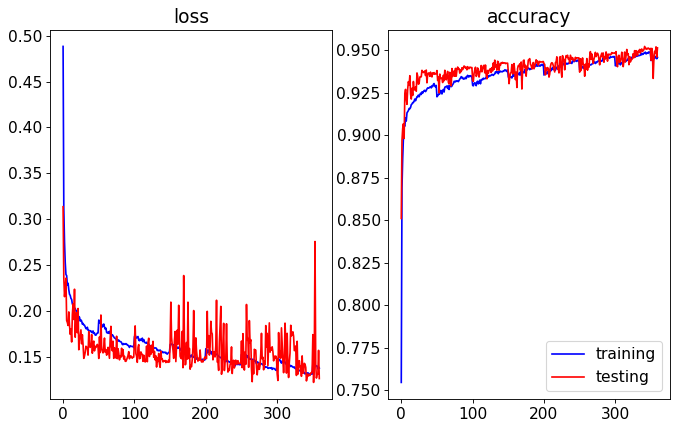

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


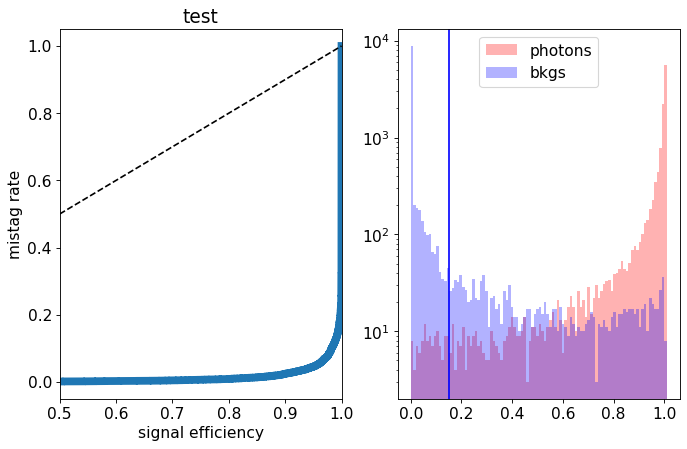

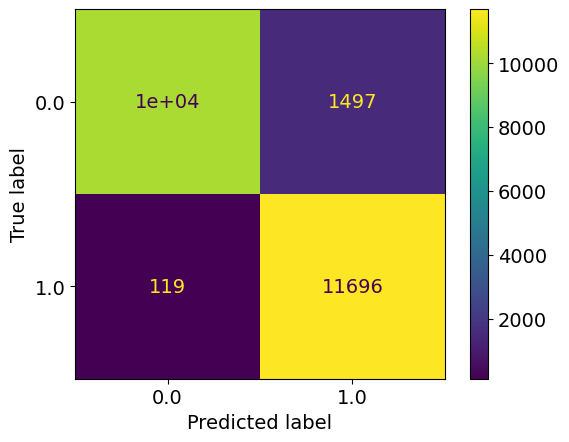

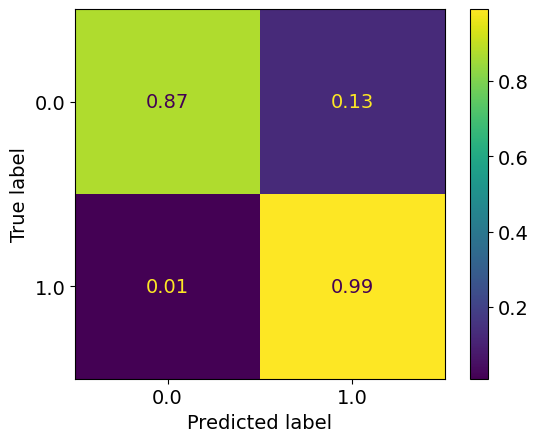

epoch: 360
Learning rate: 0.0009046260814679198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.13853956706774462
train acc: 0.94570416


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.1417274609208107
test acc: 0.94742656
epoch: 361
Learning rate: 0.0008853841399927774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13889739453602748
train acc: 0.94591665


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.24519077707082032
test acc: 0.93913895
epoch: 362
Learning rate: 0.0008646212633823492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.13822248198424175
train acc: 0.94578916


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]


test loss: 0.14034625943750142
test acc: 0.9500191
epoch: 363
Learning rate: 0.000842419393224961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13847221994096306
train acc: 0.94605476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.44it/s]


test loss: 0.12731050364673138
test acc: 0.9514642
epoch: 364
Learning rate: 0.0008188661501590542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13828805240855854
train acc: 0.94612914


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


test loss: 0.15862589441239833
test acc: 0.9476391
epoch: 365
Learning rate: 0.0007940544880745564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.13955179312426574
train acc: 0.9452791


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.54it/s]


test loss: 0.1770407296717167
test acc: 0.9430065
epoch: 366
Learning rate: 0.0007680823272663455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.13709527780865408
train acc: 0.9472661


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.35it/s]


test loss: 0.14384446274489165
test acc: 0.9501891
epoch: 367
Learning rate: 0.0007410521679875796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.13663109709882432
train acc: 0.9465967


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.13348288144916295
test acc: 0.9503166
epoch: 368
Learning rate: 0.0007130706859280269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13622789739803143
train acc: 0.94687295


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.1421856118366122
test acc: 0.95052916
epoch: 369
Learning rate: 0.0006842483112138533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.13518281328450343
train acc: 0.9474255


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.14it/s]


test loss: 0.16059281267225742
test acc: 0.94534403


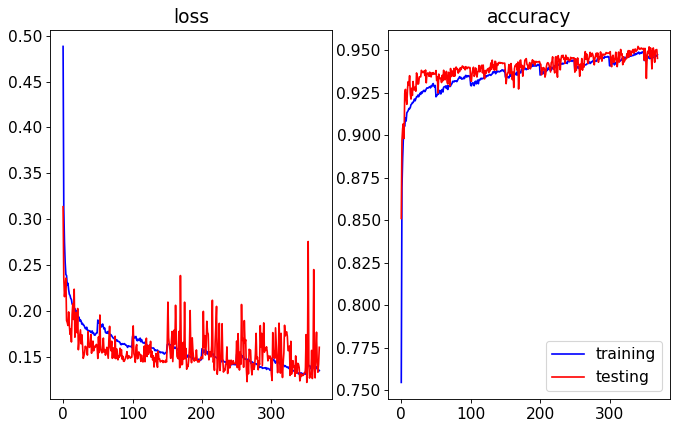

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.12it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


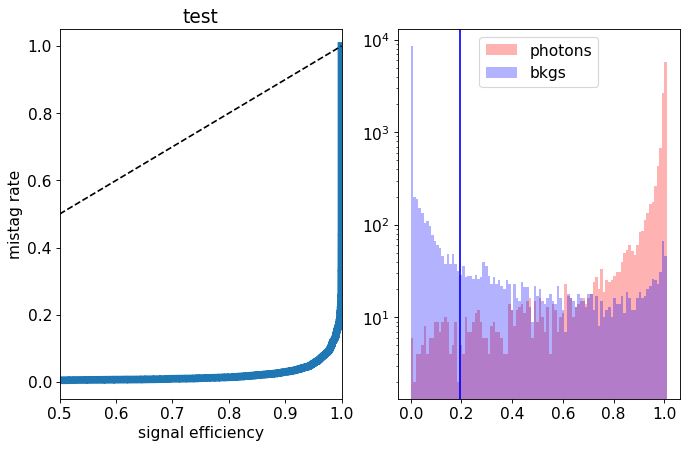

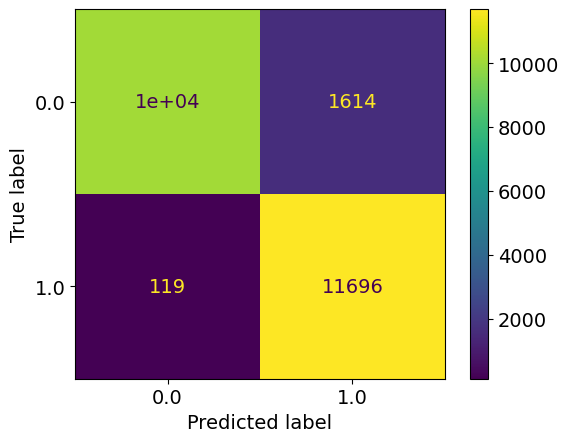

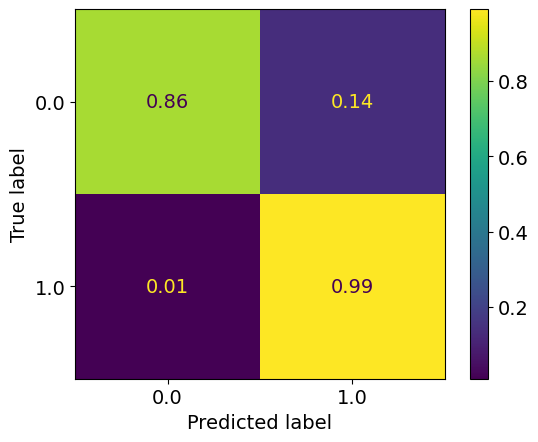

epoch: 370
Learning rate: 0.0006546987925903651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.13584212337140064
train acc: 0.9472342


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.27it/s]


test loss: 0.13629280738532543
test acc: 0.9499341
epoch: 371
Learning rate: 0.0006245387485076785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1364715642230526
train acc: 0.9468517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.47it/s]


test loss: 0.13648394383490087
test acc: 0.9487441
epoch: 372
Learning rate: 0.000593887206880974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.21it/s]


train loss: 0.1355065365505826
train acc: 0.94793546


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.16it/s]


test loss: 0.14884059578180314
test acc: 0.9481491
epoch: 373
Learning rate: 0.0005628651353416952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.43it/s]


train loss: 0.1346443631941346
train acc: 0.94817984


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.13659629113972188
test acc: 0.95103914
epoch: 374
Learning rate: 0.000531594963833571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.13367569546221167
train acc: 0.9475955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.47it/s]


test loss: 0.1364625807851553
test acc: 0.9485741
epoch: 375
Learning rate: 0.000500200101437562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1336136333122375
train acc: 0.948488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.43it/s]


test loss: 0.12099413722753524
test acc: 0.9534617
new best acc: 0.9534617
epoch: 376
Learning rate: 0.0004688044493325963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.1321230588635062
train acc: 0.94876426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.91it/s]


test loss: 0.13425375074148177
test acc: 0.95069915
epoch: 377
Learning rate: 0.0004375319118142234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.13245532386432027
train acc: 0.94866866


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.14407848361879588
test acc: 0.9501041
epoch: 378
Learning rate: 0.000406505907300965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.13126205135682587
train acc: 0.94891304


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.17it/s]


test loss: 0.14099184945225715
test acc: 0.9499341
epoch: 379
Learning rate: 0.00037584888125820174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.13208891674401654
train acc: 0.94878554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.88it/s]


test loss: 0.14893711730837822
test acc: 0.94632155


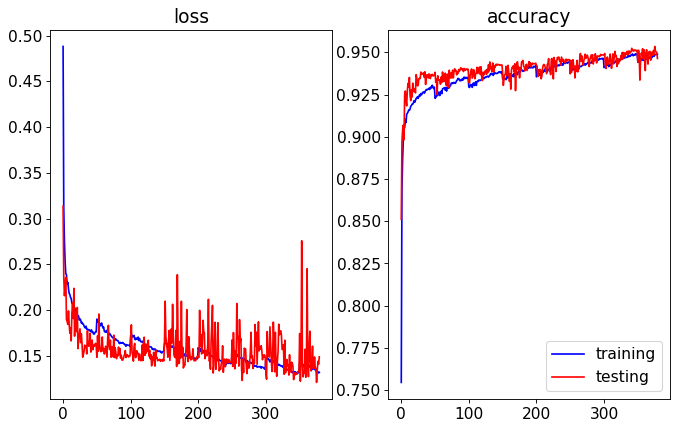

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


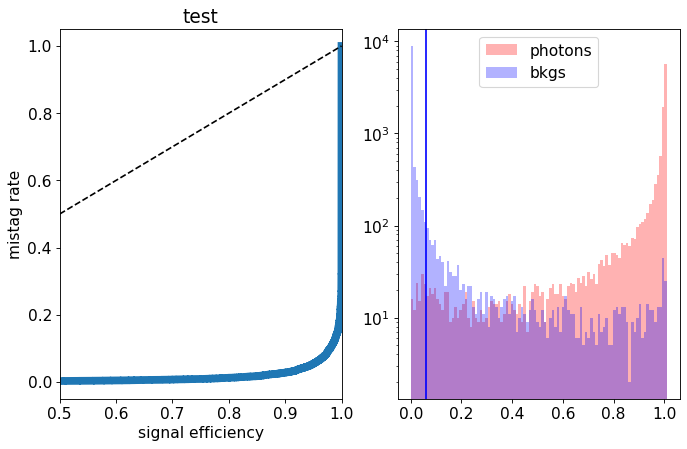

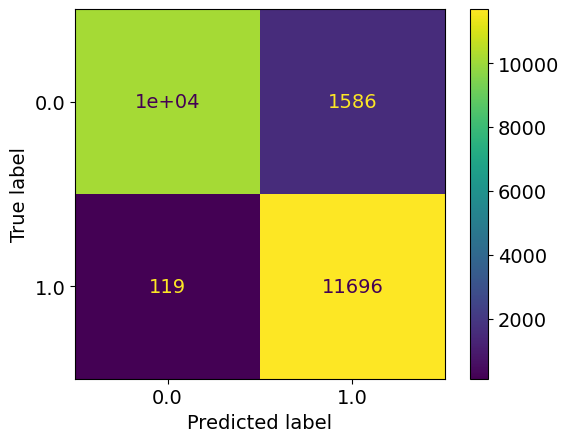

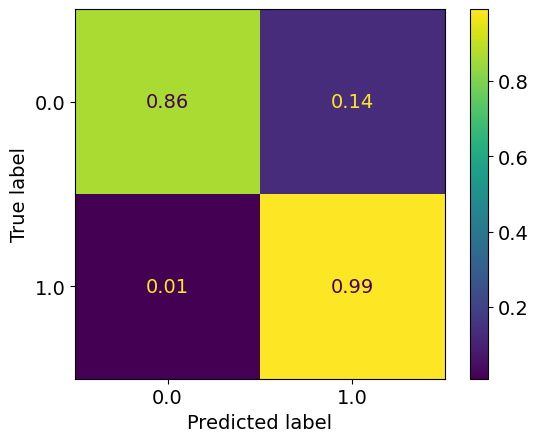

epoch: 380
Learning rate: 0.00034568182296186134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1315485005545768
train acc: 0.949168


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.15656023900955915
test acc: 0.9500616
epoch: 381
Learning rate: 0.0003161237880090216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.13102918127729635
train acc: 0.9492955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.14215345177799463
test acc: 0.9498916
epoch: 382
Learning rate: 0.0002872914284598598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.13114836532029378
train acc: 0.949168


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.90it/s]


test loss: 0.13176390919834374
test acc: 0.95095414
epoch: 383
Learning rate: 0.00025929853246526403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.1313293521666223
train acc: 0.94879615


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.09it/s]


test loss: 0.15318371281027793
test acc: 0.9489141
epoch: 384
Learning rate: 0.0002322555751969876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.1300387487859483
train acc: 0.94967806


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.13517787344753743
test acc: 0.9513366
epoch: 385
Learning rate: 0.00020626928285261644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13105003056442663
train acc: 0.9493487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


test loss: 0.13624365124851465
test acc: 0.9515067
epoch: 386
Learning rate: 0.00018144221145602573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.12964056617325279
train acc: 0.9497312


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.74it/s]


test loss: 0.14852620381861925
test acc: 0.9492966
epoch: 387
Learning rate: 0.00015787234211560807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.16it/s]


train loss: 0.13055995196863346
train acc: 0.9491574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.45it/s]


test loss: 0.16785455942153932
test acc: 0.9475966
epoch: 388
Learning rate: 0.00013565269433760108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.1295538500995393
train acc: 0.9494868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.14462855383753775
test acc: 0.9500191
epoch: 389
Learning rate: 0.00011487095892059296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.1300369902591037
train acc: 0.9495293


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.29it/s]


test loss: 0.1334881389513612
test acc: 0.95210165


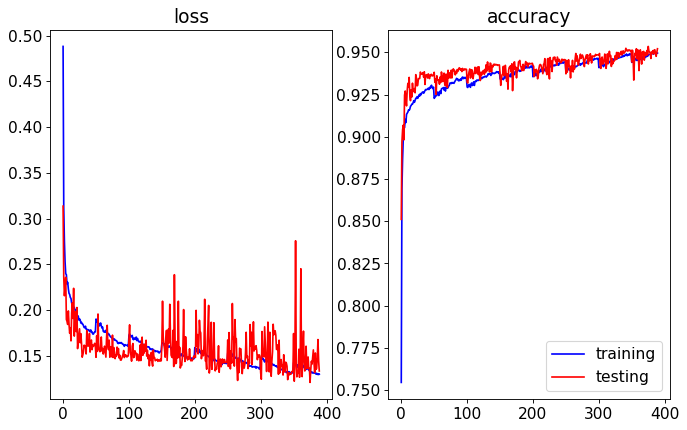

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.19it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


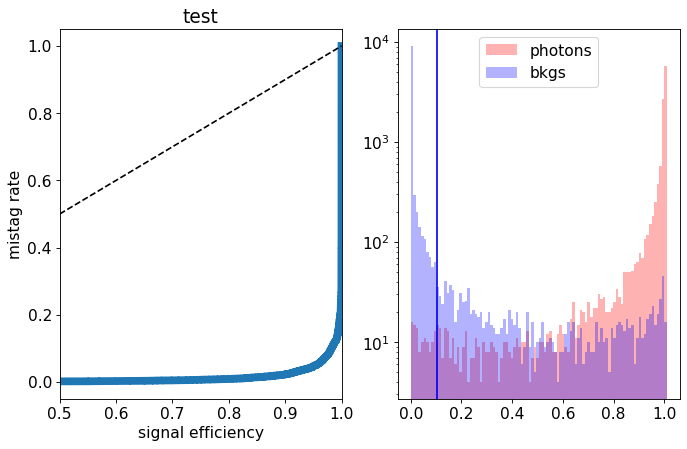

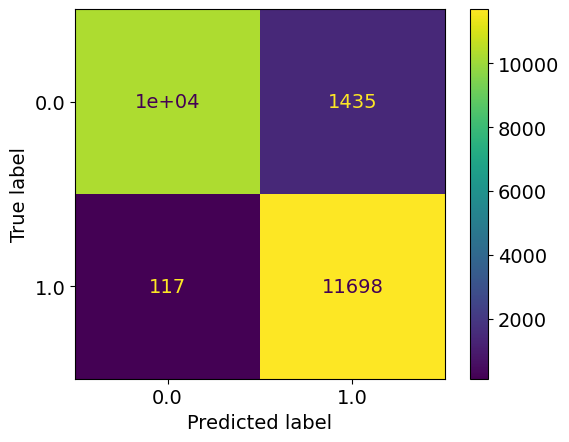

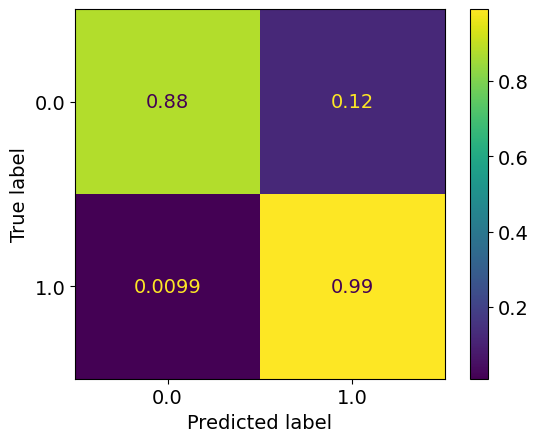

epoch: 390
Learning rate: 9.56091518800029e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.12882601963296816
train acc: 0.9494443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.13099725916981697
test acc: 0.95214415
epoch: 391
Learning rate: 7.794329076833767e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.12933186389458406
train acc: 0.9495399


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.22it/s]


test loss: 0.14142737500369548
test acc: 0.9512091
epoch: 392
Learning rate: 6.194309466864034e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.54it/s]


train loss: 0.12791505047849788
train acc: 0.9506131


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.75it/s]


test loss: 0.13582058921456336
test acc: 0.9515067
epoch: 393
Learning rate: 4.767170904512269e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.1273325696872298
train acc: 0.9507087


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.33it/s]


test loss: 0.13392479624599218
test acc: 0.95231414
epoch: 394
Learning rate: 3.5185456536864556e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.12712704361813842
train acc: 0.9502624


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.04it/s]


test loss: 0.13855455592274665
test acc: 0.9511666
epoch: 395
Learning rate: 2.453361467808979e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.12888858614453844
train acc: 0.9501987


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.22it/s]


test loss: 0.13379168342798947
test acc: 0.9513791
epoch: 396
Learning rate: 1.5758221422251472e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.12720793162941174
train acc: 0.95076185


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.87it/s]


test loss: 0.1388524290174246
test acc: 0.9511666
epoch: 397
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.12818363925833612
train acc: 0.9503581


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.22it/s]


test loss: 0.13617618195712566
test acc: 0.95112413
epoch: 398
Learning rate: 3.967768427826535e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.12858678196456022
train acc: 0.9504218


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.13426472134888173
test acc: 0.9515067
epoch: 399
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.12851608245615748
train acc: 0.9501562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.13759322743862867
test acc: 0.9515917


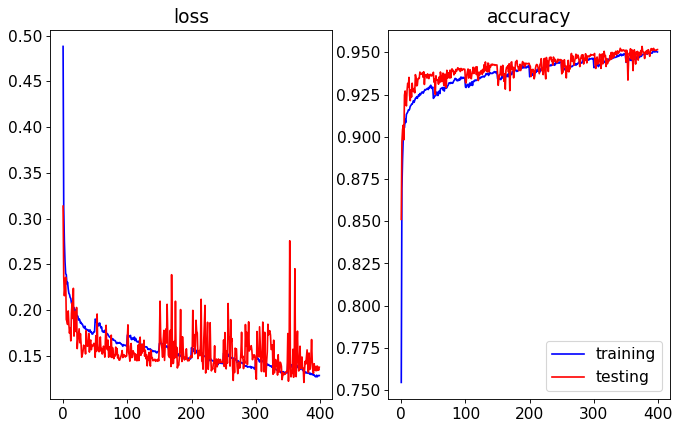

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


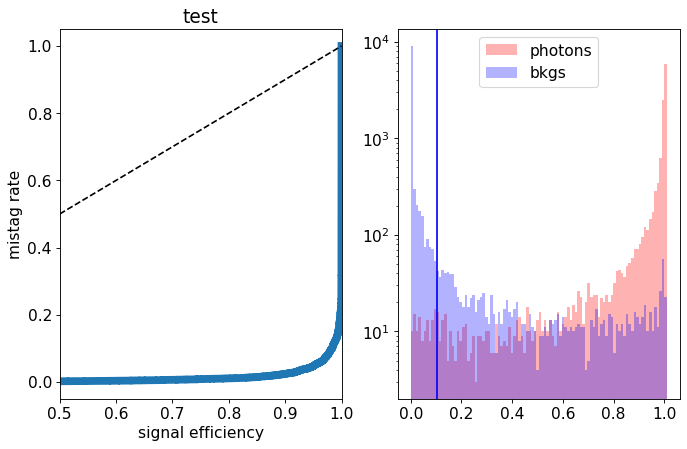

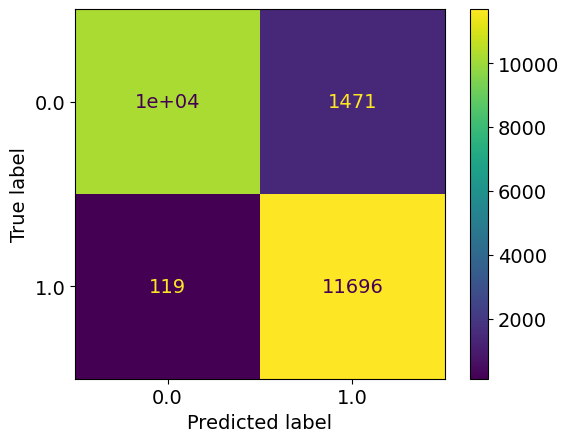

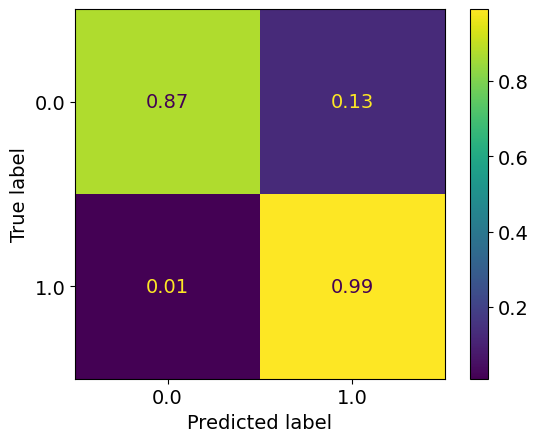

epoch: 400
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.13695783058928837
train acc: 0.9469792


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.1194989450275898
test acc: 0.9513366
epoch: 401
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.13776985038617615
train acc: 0.9462248


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.11it/s]


test loss: 0.13961821421980858
test acc: 0.95074165
epoch: 402
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13678667328919575
train acc: 0.9463629


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.28it/s]


test loss: 0.20524522010236979
test acc: 0.9435165
epoch: 403
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13756067320040077
train acc: 0.9462885


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]


test loss: 0.14453478530049324
test acc: 0.9488291
epoch: 404
Learning rate: 0.0009843413049856061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.13693575034285807
train acc: 0.94607604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.13789321444928646
test acc: 0.9487441
epoch: 405
Learning rate: 0.0009755900548115212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.1359876599756016
train acc: 0.94721293


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.99it/s]


test loss: 0.15140319000929595
test acc: 0.94521654
epoch: 406
Learning rate: 0.0009649618679675236


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.19it/s]


train loss: 0.13668274110669543
train acc: 0.9467348


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.84it/s]


test loss: 0.12250513844192028
test acc: 0.95171916
epoch: 407
Learning rate: 0.0009524986890515297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.13480829385815152
train acc: 0.94774425


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.95it/s]


test loss: 0.15438426844775677
test acc: 0.9481916
epoch: 408
Learning rate: 0.0009382497045368365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.1367913557180933
train acc: 0.9474148


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.34it/s]


test loss: 0.14996528327465058
test acc: 0.94636405
epoch: 409
Learning rate: 0.0009222711486555812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.06it/s]


train loss: 0.1347065706541584
train acc: 0.9469792


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.48it/s]


test loss: 0.13397972676903008
test acc: 0.94976413


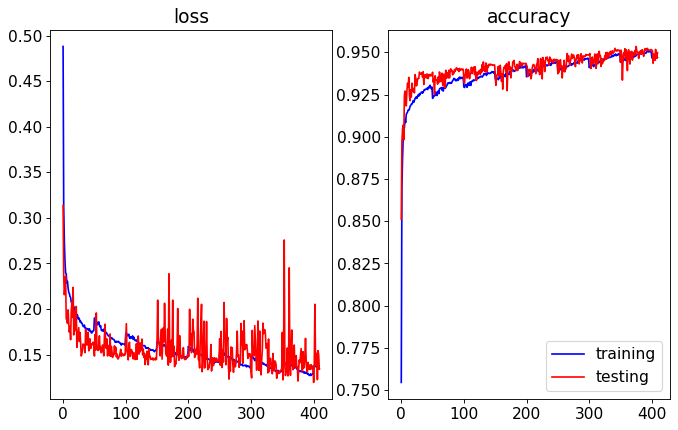

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


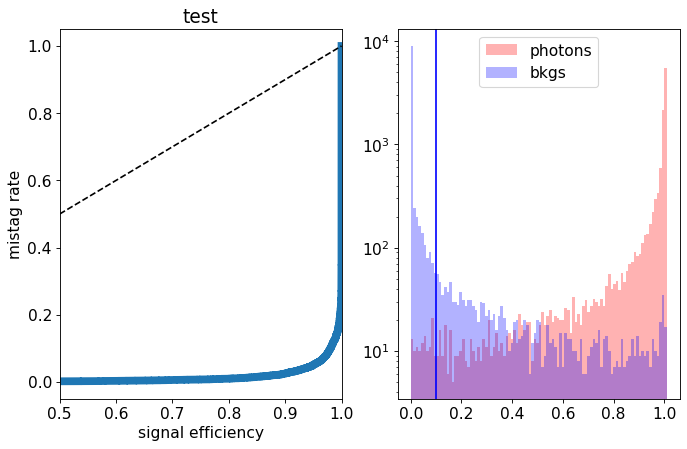

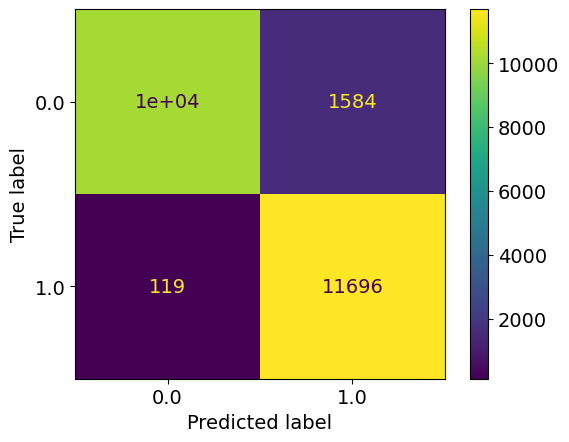

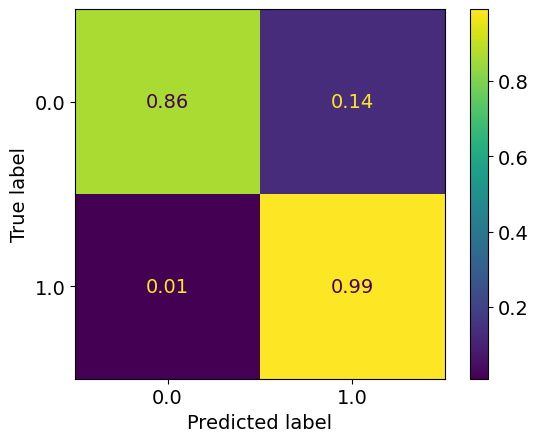

epoch: 410
Learning rate: 0.0009046260814679198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.52it/s]


train loss: 0.1346845967090054
train acc: 0.9473086


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.59it/s]


test loss: 0.13508899454027415
test acc: 0.95052916
epoch: 411
Learning rate: 0.0008853841399927774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.13it/s]


train loss: 0.13577497048172982
train acc: 0.94683045


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.68it/s]


test loss: 0.15724287647753954
test acc: 0.9479366
epoch: 412
Learning rate: 0.0008646212633823492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.13576448072863231
train acc: 0.94758487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.86it/s]


test loss: 0.13421498537063598
test acc: 0.9502741
epoch: 413
Learning rate: 0.000842419393224961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.13525083072625907
train acc: 0.94688356


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.89it/s]


test loss: 0.1324200252071023
test acc: 0.95205915
epoch: 414
Learning rate: 0.0008188661501590542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.1353927163086879
train acc: 0.94679856


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.12997954189777375
test acc: 0.95091164
epoch: 415
Learning rate: 0.0007940544880745564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.13424878572202792
train acc: 0.9478611


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.15464499164372683
test acc: 0.9475966
epoch: 416
Learning rate: 0.0007680823272663455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.1339155002764076
train acc: 0.94713855


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.80it/s]


test loss: 0.17085786089301108
test acc: 0.9435165
epoch: 417
Learning rate: 0.0007410521679875796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.13256679821735734
train acc: 0.94871116


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.20950890462845564
test acc: 0.94389904
epoch: 418
Learning rate: 0.0007130706859280269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.13358031208537946
train acc: 0.9478186


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.11883739456534385
test acc: 0.95329165
epoch: 419
Learning rate: 0.0006842483112138533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.13196441583382856
train acc: 0.9484349


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.67it/s]


test loss: 0.1476453274488449
test acc: 0.94967914


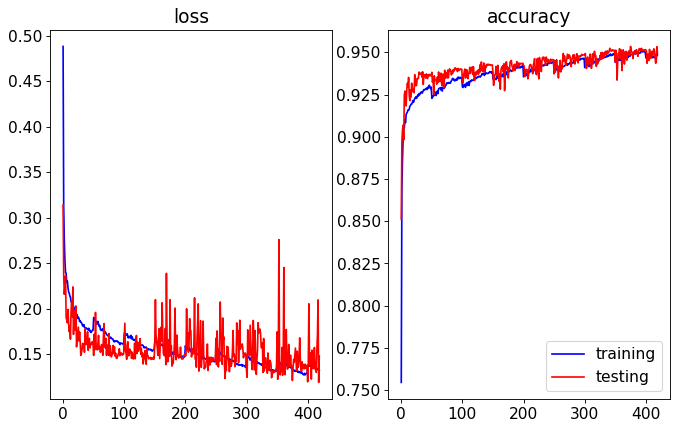

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


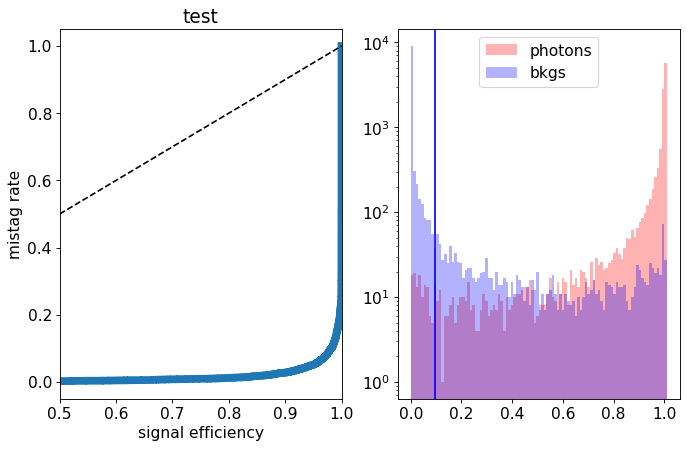

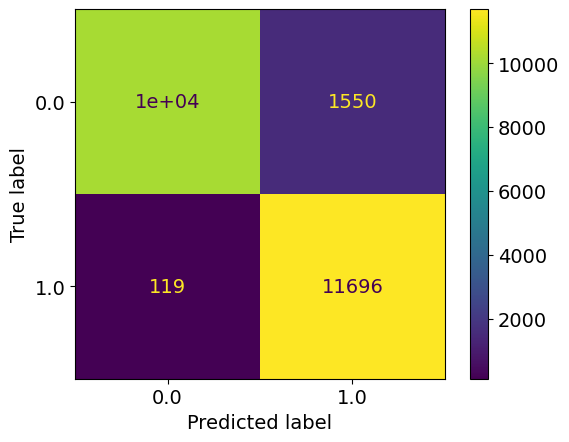

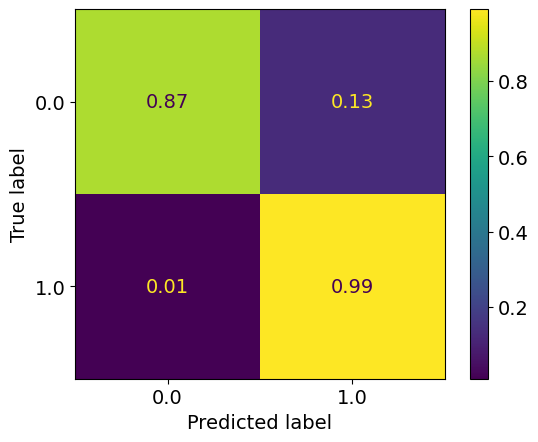

epoch: 420
Learning rate: 0.0006546987925903651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1324152890948733
train acc: 0.94900864


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.97it/s]


test loss: 0.14395312499254942
test acc: 0.9492116
epoch: 421
Learning rate: 0.0006245387485076785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.11it/s]


train loss: 0.13321980900445562
train acc: 0.94785047


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.16039154641330242
test acc: 0.9467891
epoch: 422
Learning rate: 0.000593887206880974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13204319086993577
train acc: 0.94896615


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.28it/s]


test loss: 0.13257569149136544
test acc: 0.95095414
epoch: 423
Learning rate: 0.0005628651353416952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.13104290220957654
train acc: 0.9492424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.27it/s]


test loss: 0.14790055733174085
test acc: 0.9486591
epoch: 424
Learning rate: 0.000531594963833571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:27<00:00,  5.61it/s]


train loss: 0.1322140059653361
train acc: 0.94862616


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.1311435727402568
test acc: 0.9500191
epoch: 425
Learning rate: 0.000500200101437562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:27<00:00,  5.62it/s]


train loss: 0.13083467105771326
train acc: 0.94913614


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.29it/s]


test loss: 0.1445452082902193
test acc: 0.94955164
epoch: 426
Learning rate: 0.0004688044493325963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.12980198584924077
train acc: 0.9500712


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.99it/s]


test loss: 0.1275778567418456
test acc: 0.95231414
epoch: 427
Learning rate: 0.0004375319118142234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.13029549678989277
train acc: 0.95009243


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.40it/s]


test loss: 0.1302007343620062
test acc: 0.9526967
epoch: 428
Learning rate: 0.000406505907300965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.1306185476054811
train acc: 0.94917864


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.51it/s]


test loss: 0.13405128698796034
test acc: 0.95078415
epoch: 429
Learning rate: 0.00037584888125820174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.12916158096995323
train acc: 0.9491255


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.15329659264534712
test acc: 0.9477666


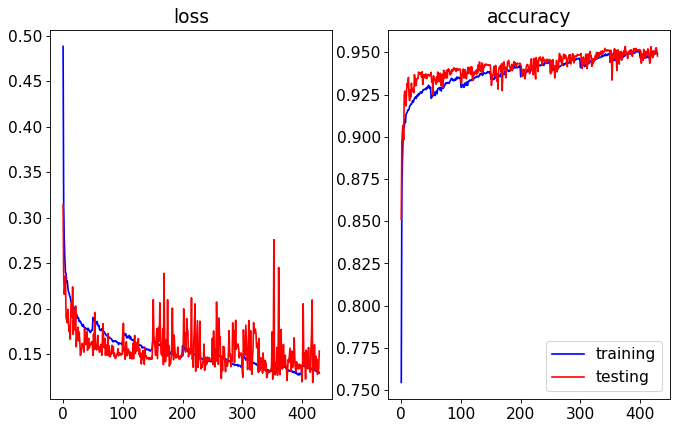

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


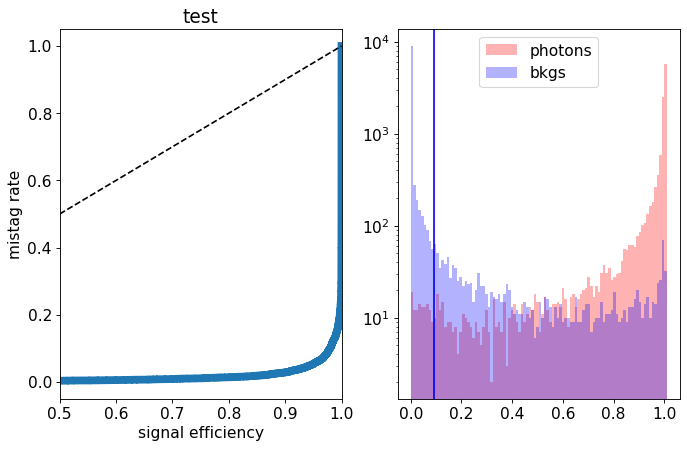

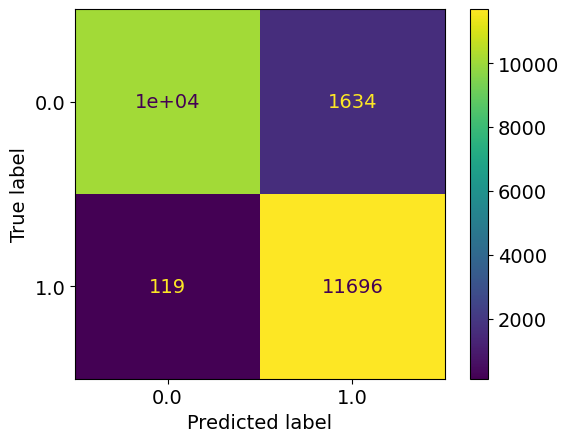

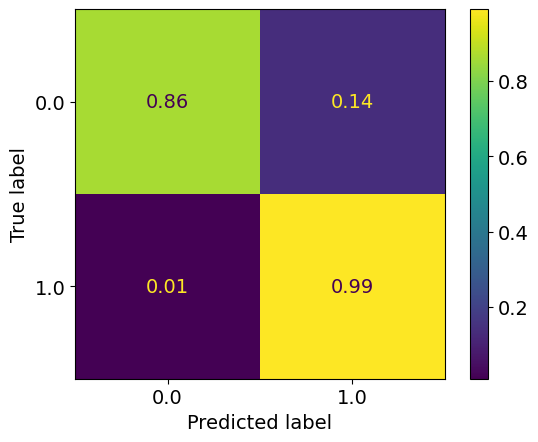

epoch: 430
Learning rate: 0.00034568182296186134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.12869555289578286
train acc: 0.95017743


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.12it/s]


test loss: 0.1318578839302063
test acc: 0.9524417
epoch: 431
Learning rate: 0.0003161237880090216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.44it/s]


train loss: 0.12938137684658074
train acc: 0.9503262


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.25it/s]


test loss: 0.14583446849137544
test acc: 0.9487016
epoch: 432
Learning rate: 0.0002872914284598598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.55it/s]


train loss: 0.12830835457440395
train acc: 0.94986933


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.11it/s]


test loss: 0.13603910692036153
test acc: 0.9503591
epoch: 433
Learning rate: 0.00025929853246526403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.26it/s]


train loss: 0.1288503499072828
train acc: 0.9495718


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1420444453135133
test acc: 0.9501891
epoch: 434
Learning rate: 0.0002322555751969876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.1291999483279362
train acc: 0.95010304


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.98it/s]


test loss: 0.16691009290516376
test acc: 0.9475541
epoch: 435
Learning rate: 0.00020626928285261644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1272560480958337
train acc: 0.95102745


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.58it/s]


test loss: 0.1498031025752425
test acc: 0.9501891
epoch: 436
Learning rate: 0.00018144221145602573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.12772533729387697
train acc: 0.95089996


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.87it/s]


test loss: 0.13133697733283042
test acc: 0.9524842
epoch: 437
Learning rate: 0.00015787234211560807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.12731124935256447
train acc: 0.9505387


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.30it/s]


test loss: 0.15337002109736203
test acc: 0.9498491
epoch: 438
Learning rate: 0.00013565269433760108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.12704296628381037
train acc: 0.9512081


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.28it/s]


test loss: 0.133797487616539
test acc: 0.9526542
epoch: 439
Learning rate: 0.00011487095892059296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.48it/s]


train loss: 0.12662877702409295
train acc: 0.9514631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.43it/s]


test loss: 0.1377171291038394
test acc: 0.95163417


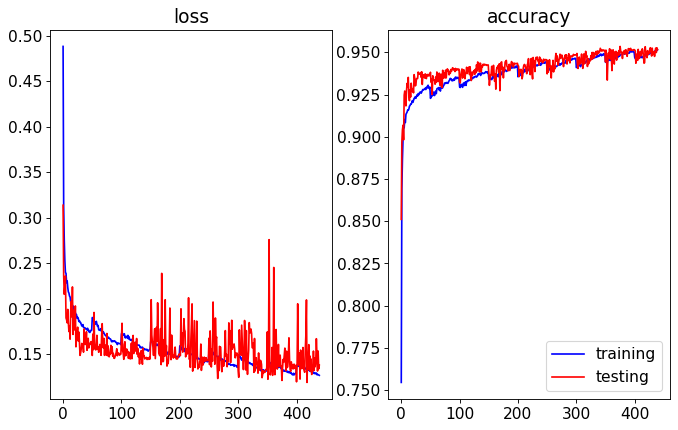

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


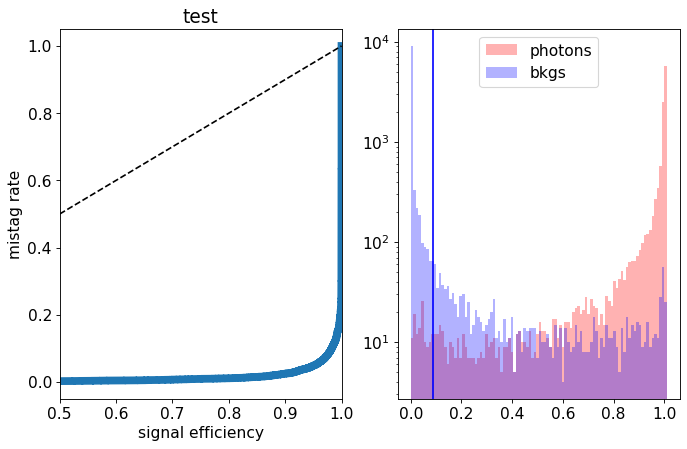

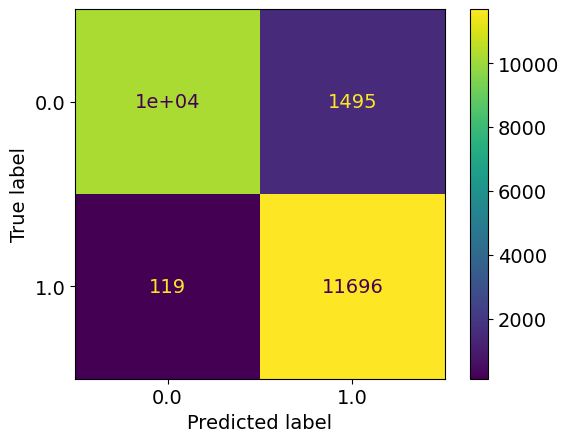

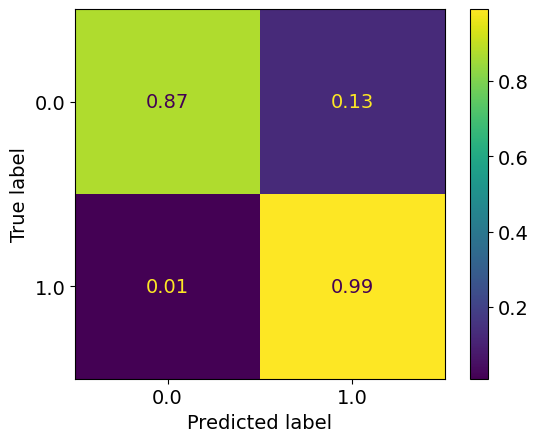

epoch: 440
Learning rate: 9.56091518800029e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.17it/s]


train loss: 0.12678103300796192
train acc: 0.95085746


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.27it/s]


test loss: 0.1421269614249468
test acc: 0.95078415
epoch: 441
Learning rate: 7.794329076833767e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.12599426313380527
train acc: 0.95089996


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.13978848941624164
test acc: 0.95057166
epoch: 442
Learning rate: 6.194309466864034e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.12684037759425534
train acc: 0.9511125


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.13556298445910214
test acc: 0.9515067
epoch: 443
Learning rate: 4.767170904512269e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.14it/s]


train loss: 0.12651784983789846
train acc: 0.95080435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.43it/s]


test loss: 0.13532483242452145
test acc: 0.9512941
epoch: 444
Learning rate: 3.5185456536864556e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.12560116860327447
train acc: 0.9508256


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.140984183549881
test acc: 0.95052916
epoch: 445
Learning rate: 2.453361467808979e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.1259884309426994
train acc: 0.95105934


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.79it/s]


test loss: 0.14266440067440272
test acc: 0.95057166
epoch: 446
Learning rate: 1.5758221422251472e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.12631710006552896
train acc: 0.9515269


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 13.78it/s]


test loss: 0.1401597922667861
test acc: 0.95099664
epoch: 447
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.12615824661626937
train acc: 0.95122933


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.10it/s]


test loss: 0.13768440913408994
test acc: 0.95091164
epoch: 448
Learning rate: 3.967768427826535e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.22it/s]


train loss: 0.12550526060116518
train acc: 0.9514631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.13875672016292812
test acc: 0.95082664
epoch: 449
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1266423363214845
train acc: 0.95071936


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.37it/s]


test loss: 0.14054246116429567
test acc: 0.95074165


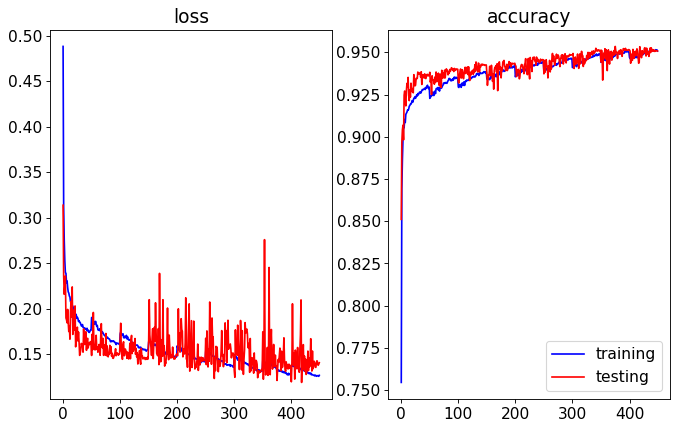

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.44it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


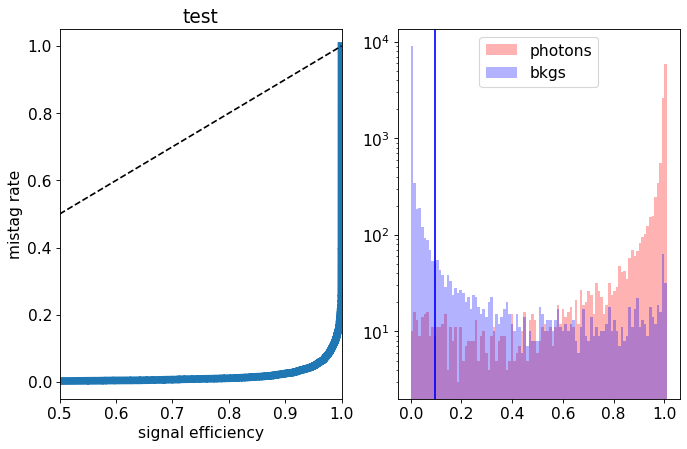

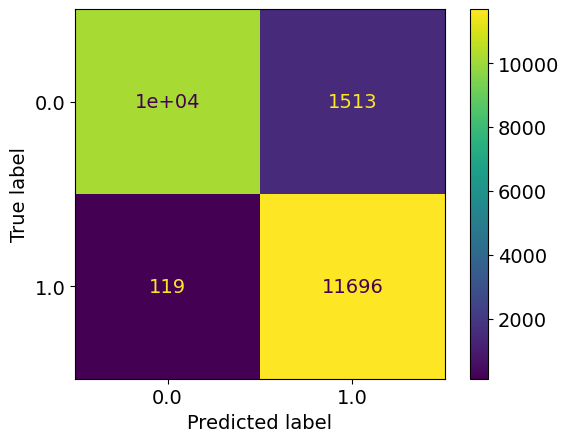

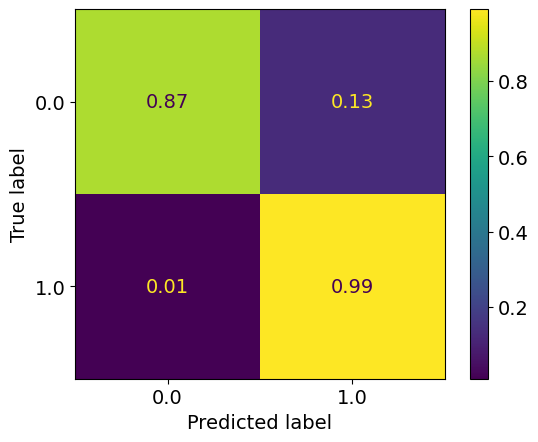

epoch: 450
Learning rate: 4.004058690165735e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.13599639907953845
train acc: 0.94683045


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.32it/s]


test loss: 0.12938879523426294
test acc: 0.9494241
epoch: 451
Learning rate: 0.000999025888725783


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.13533698392521804
train acc: 0.94707483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.61it/s]


test loss: 0.14251044616103173
test acc: 0.9484041
epoch: 452
Learning rate: 0.0009960823902925946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.45it/s]


train loss: 0.133473196701639
train acc: 0.9482861


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.41it/s]


test loss: 0.13184247240424157
test acc: 0.9515917
epoch: 453
Learning rate: 0.0009911810813034072


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.18it/s]


train loss: 0.13512233772854895
train acc: 0.9475955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.49it/s]


test loss: 0.1385867243632674
test acc: 0.94950914
epoch: 454
Learning rate: 0.0009843413049856061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.13394344450941512
train acc: 0.9475955


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.34it/s]


test loss: 0.1225630210712552
test acc: 0.95295167
epoch: 455
Learning rate: 0.0009755900548115212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.1350965287275375
train acc: 0.9471173


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.56it/s]


test loss: 0.16563094556331634
test acc: 0.9486166
epoch: 456
Learning rate: 0.0009649618679675236


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.13426844647545724
train acc: 0.9475636


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.50it/s]


test loss: 0.1827539486810565
test acc: 0.94589657
epoch: 457
Learning rate: 0.0009524986890515297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.13292472083477458
train acc: 0.9483286


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.1989445235580206
test acc: 0.94385654
epoch: 458
Learning rate: 0.0009382497045368365


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.20it/s]


train loss: 0.1332914317204694
train acc: 0.948743


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1393760761246085
test acc: 0.9470866
epoch: 459
Learning rate: 0.0009222711486555812


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.13376002488242592
train acc: 0.9476805


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.12976781912148
test acc: 0.95086914


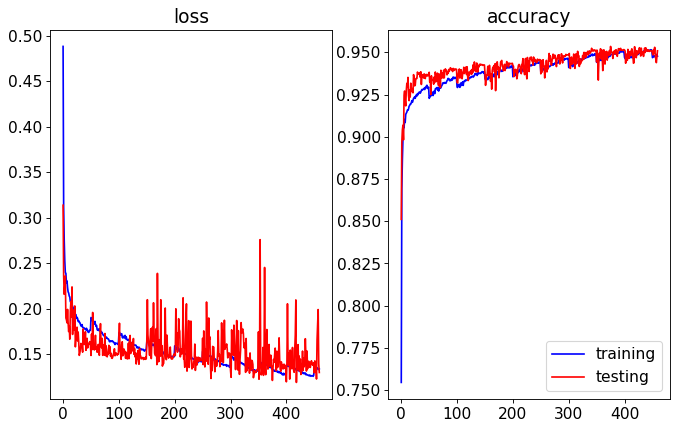

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


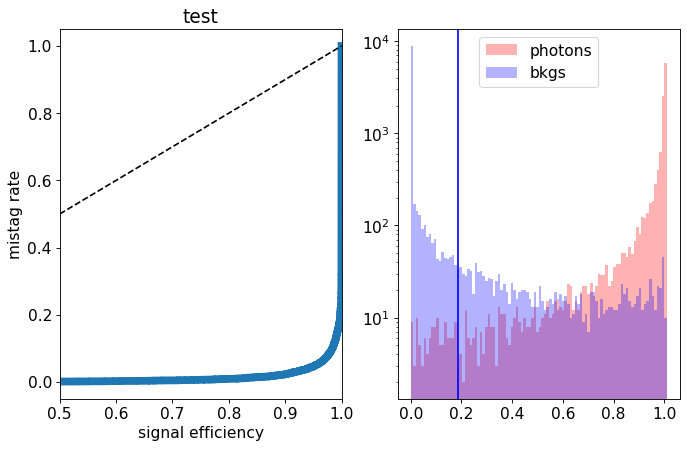

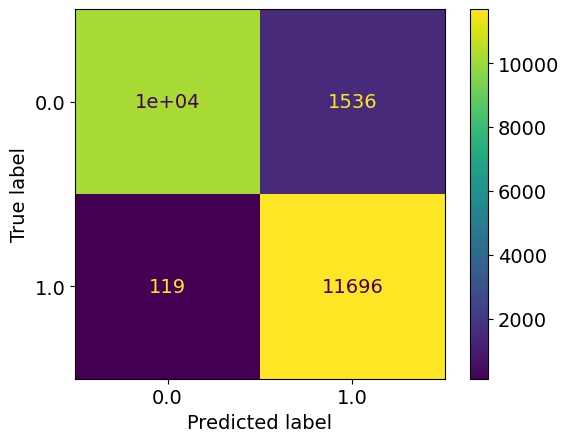

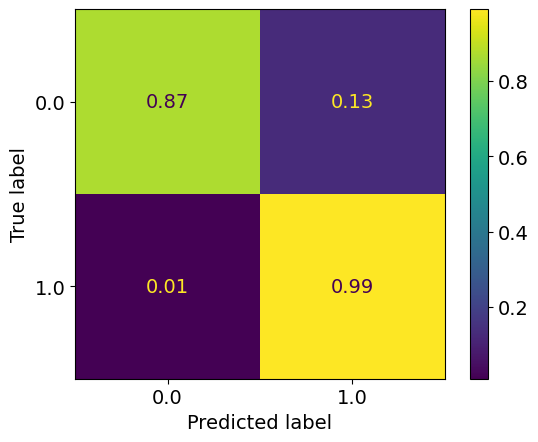

epoch: 460
Learning rate: 0.0009046260814679198


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.27it/s]


train loss: 0.13347013878404715
train acc: 0.9474148


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.13it/s]


test loss: 0.12431927286088466
test acc: 0.9529092
epoch: 461
Learning rate: 0.0008853841399927774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13236027628563013
train acc: 0.9484668


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.14425837937742472
test acc: 0.9500616
epoch: 462
Learning rate: 0.0008646212633823492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.13262404434999842
train acc: 0.94883865


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.13it/s]


test loss: 0.13726172931492328
test acc: 0.9514217
epoch: 463
Learning rate: 0.000842419393224961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.57it/s]


train loss: 0.1313561618707742
train acc: 0.9494549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.81it/s]


test loss: 0.12928930297493935
test acc: 0.95052916
epoch: 464
Learning rate: 0.0008188661501590542


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.13318259871689378
train acc: 0.94872177


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.1953700188547373
test acc: 0.943644
epoch: 465
Learning rate: 0.0007940544880745564


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.13200823929469296
train acc: 0.94880676


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.22it/s]


test loss: 0.15712107196450234
test acc: 0.94742656
epoch: 466
Learning rate: 0.0007680823272663455


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.13179524076782215
train acc: 0.94862616


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.42it/s]


test loss: 0.14899791367352008
test acc: 0.95048666
epoch: 467
Learning rate: 0.0007410521679875796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.13248724983945773
train acc: 0.9488599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.1345356496050954
test acc: 0.95235664
epoch: 468
Learning rate: 0.0007130706859280269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.13018323343460728
train acc: 0.94908303


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.21196317672729492
test acc: 0.9431765
epoch: 469
Learning rate: 0.0006842483112138533


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1317753765708322
train acc: 0.9487749


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.29it/s]


test loss: 0.20006699915975332
test acc: 0.94487655


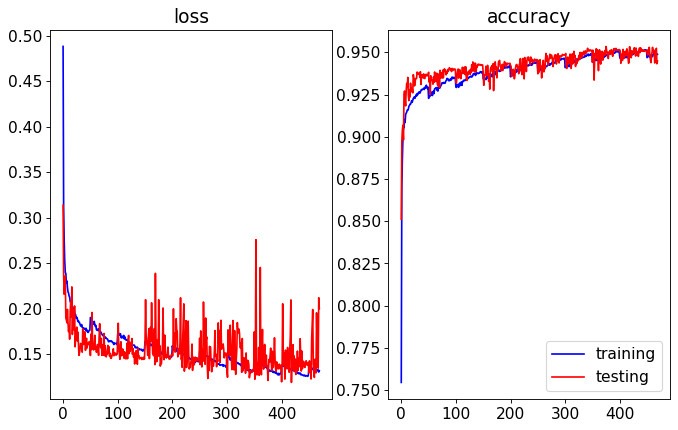

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


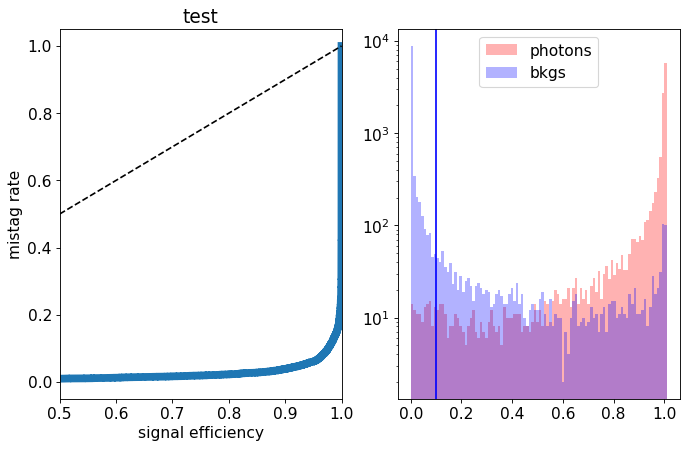

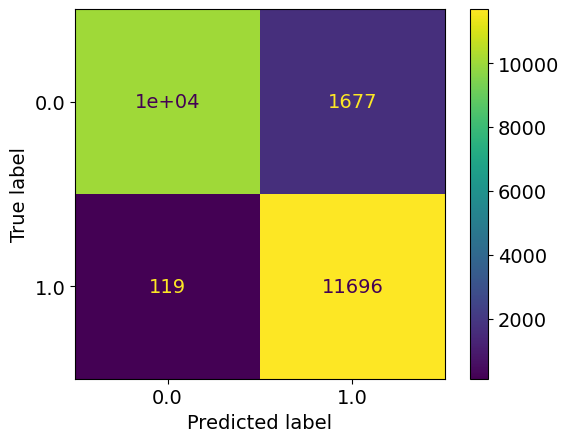

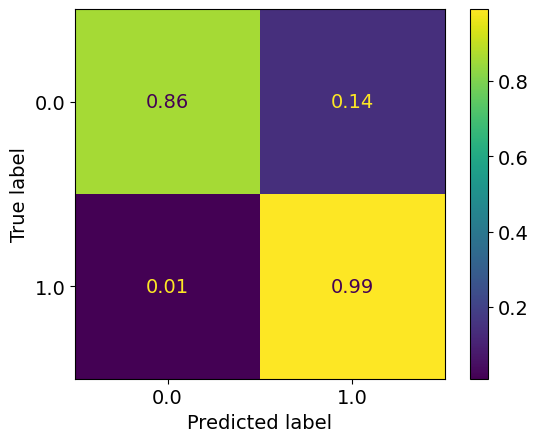

epoch: 470
Learning rate: 0.0006546987925903651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.13001596381899658
train acc: 0.9492105


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.13794646095484495
test acc: 0.95201665
epoch: 471
Learning rate: 0.0006245387485076785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.1304485175260313
train acc: 0.9493274


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.14501562528312206
test acc: 0.9488291
epoch: 472
Learning rate: 0.000593887206880974


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.29it/s]


train loss: 0.12927682147284222
train acc: 0.9504325


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.21it/s]


test loss: 0.1283324148505926
test acc: 0.9526542
epoch: 473
Learning rate: 0.0005628651353416952


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:27<00:00,  5.61it/s]


train loss: 0.1296981268912364
train acc: 0.94986933


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.15it/s]


test loss: 0.13094293158501386
test acc: 0.95099664
epoch: 474
Learning rate: 0.000531594963833571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.61it/s]


train loss: 0.12970277723992707
train acc: 0.9494124


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.15242355540394784
test acc: 0.94950914
epoch: 475
Learning rate: 0.000500200101437562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.29it/s]


train loss: 0.12927196611454533
train acc: 0.95079374


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.26it/s]


test loss: 0.17183508053421975
test acc: 0.94657654
epoch: 476
Learning rate: 0.0004688044493325963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.46it/s]


train loss: 0.1280540178061291
train acc: 0.95056


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.80it/s]


test loss: 0.12891982663422824
test acc: 0.95112413
epoch: 477
Learning rate: 0.0004375319118142234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.53it/s]


train loss: 0.12879370893262754
train acc: 0.9499968


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.23it/s]


test loss: 0.14620228726416826
test acc: 0.9482341
epoch: 478
Learning rate: 0.000406505907300965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.51it/s]


train loss: 0.12889573239027316
train acc: 0.95039


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.38it/s]


test loss: 0.14915729276835918
test acc: 0.94980663
epoch: 479
Learning rate: 0.00037584888125820174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.12800095178139437
train acc: 0.9504218


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.68it/s]


test loss: 0.15683778580278157
test acc: 0.9492541


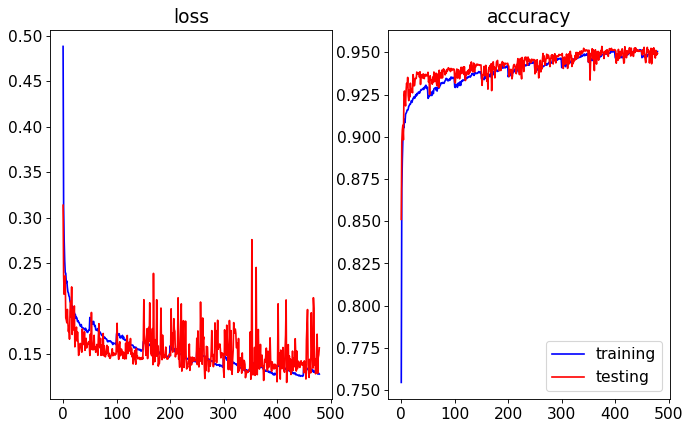

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


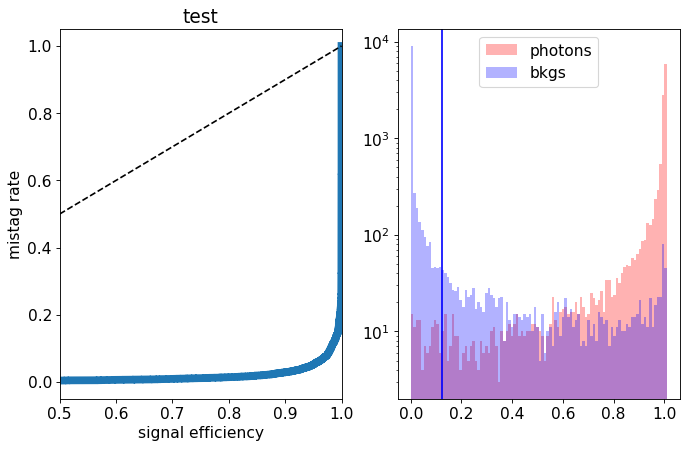

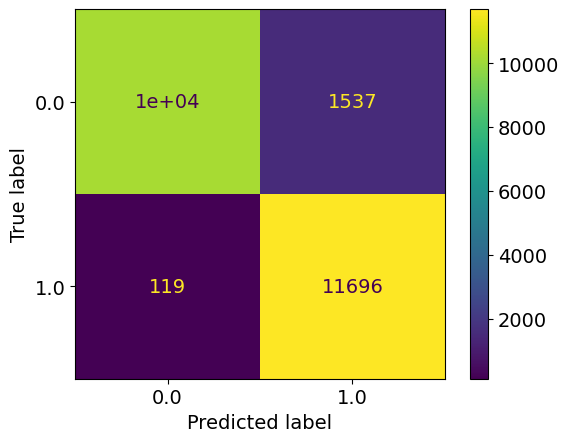

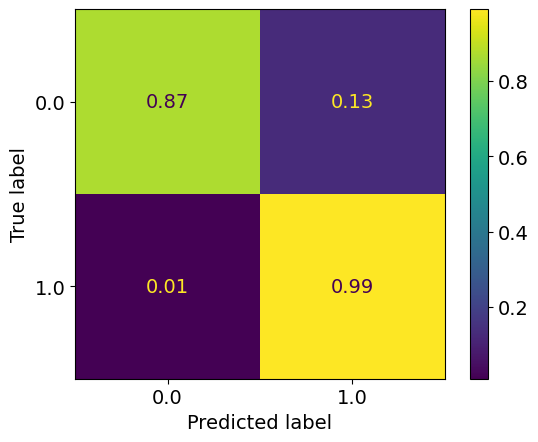

epoch: 480
Learning rate: 0.00034568182296186134


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.59it/s]


train loss: 0.12742087301934601
train acc: 0.9505387


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.69it/s]


test loss: 0.13111610803753138
test acc: 0.95218664
epoch: 481
Learning rate: 0.0003161237880090216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.58it/s]


train loss: 0.12820717108667276
train acc: 0.9505706


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.17it/s]


test loss: 0.15571761392056943
test acc: 0.9498491
epoch: 482
Learning rate: 0.0002872914284598598


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.12715335902135083
train acc: 0.9505812


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.25it/s]


test loss: 0.15806599501520396
test acc: 0.9493391
epoch: 483
Learning rate: 0.00025929853246526403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.12628496300642658
train acc: 0.951325


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.23it/s]


test loss: 0.1884156670421362
test acc: 0.94644904
epoch: 484
Learning rate: 0.0002322555751969876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1265545945828128
train acc: 0.9500287


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.62it/s]


test loss: 0.1572575582191348
test acc: 0.9494666
epoch: 485
Learning rate: 0.00020626928285261644


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.15it/s]


train loss: 0.1261138335155074
train acc: 0.9514525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.96it/s]


test loss: 0.13254562467336656
test acc: 0.9528242
epoch: 486
Learning rate: 0.00018144221145602573


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1265502209496346
train acc: 0.95004994


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.13756012693047523
test acc: 0.95167667
epoch: 487
Learning rate: 0.00015787234211560807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.28it/s]


train loss: 0.126531776349256
train acc: 0.95080435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.24it/s]


test loss: 0.15365122798830272
test acc: 0.94967914
epoch: 488
Learning rate: 0.00013565269433760108


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.56it/s]


train loss: 0.12601123826139293
train acc: 0.95105934


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.14it/s]


test loss: 0.1368090944364667
test acc: 0.95197415
epoch: 489
Learning rate: 0.00011487095892059296


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.12457074822893568
train acc: 0.9514631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.1673864835873246
test acc: 0.9485316


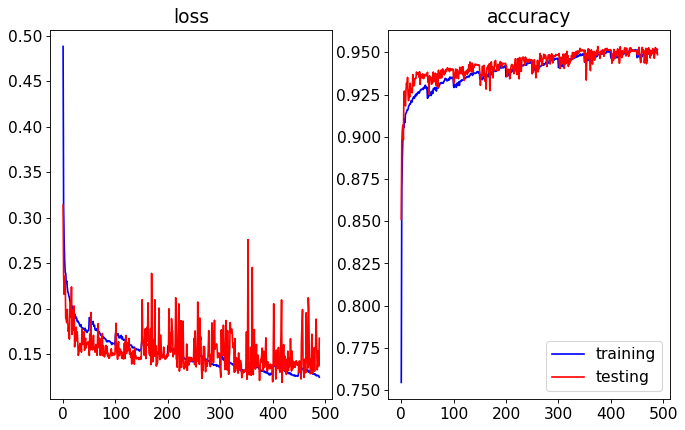

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.17it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


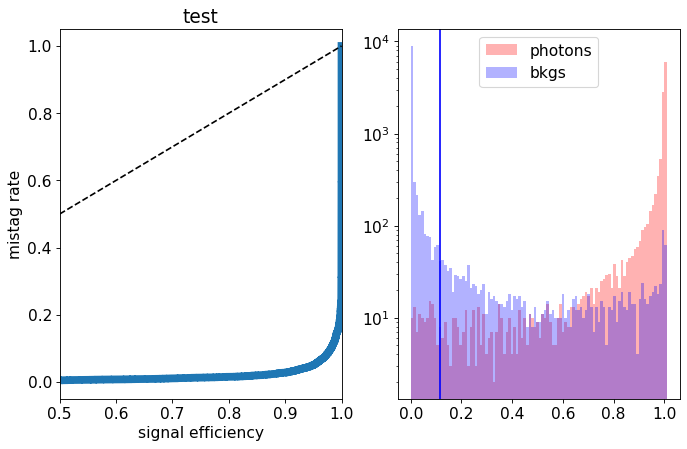

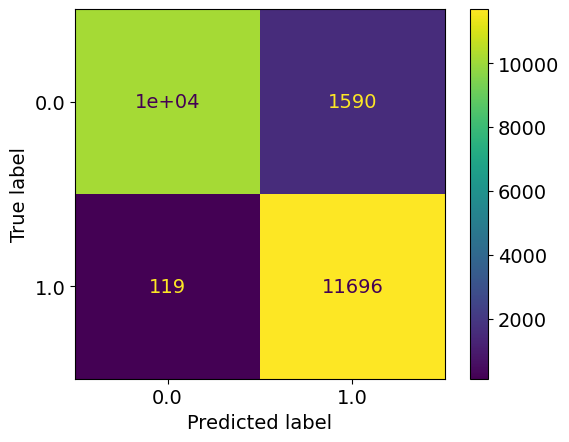

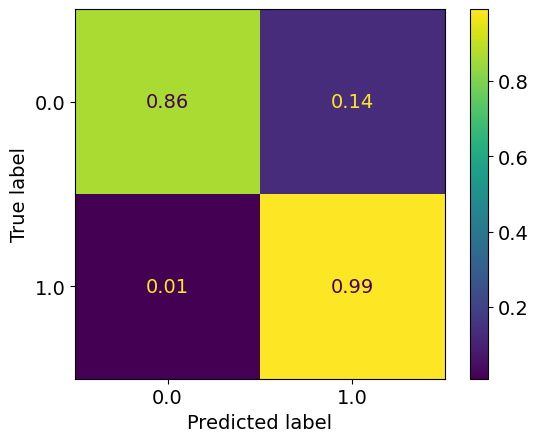

epoch: 490
Learning rate: 9.56091518800029e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.1258555777892945
train acc: 0.9515269


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.26it/s]


test loss: 0.14621114116162062
test acc: 0.95074165
epoch: 491
Learning rate: 7.794329076833767e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.12459054783840848
train acc: 0.9514419


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.22it/s]


test loss: 0.15172959063202143
test acc: 0.95082664
epoch: 492
Learning rate: 6.194309466864034e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:30<00:00,  5.09it/s]


train loss: 0.1240785498717788
train acc: 0.9519944


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.12it/s]


test loss: 0.14996435437351466
test acc: 0.95052916
epoch: 493
Learning rate: 4.767170904512269e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.47it/s]


train loss: 0.1254129758116546
train acc: 0.9511975


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.39it/s]


test loss: 0.15716559197753668
test acc: 0.94950914
epoch: 494
Learning rate: 3.5185456536864556e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.12414572236074764
train acc: 0.95172876


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.31it/s]


test loss: 0.1582472098991275
test acc: 0.94967914
epoch: 495
Learning rate: 2.453361467808979e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.1241766253284588
train acc: 0.95197314


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.46it/s]


test loss: 0.15674211084842682
test acc: 0.9503591
epoch: 496
Learning rate: 1.5758221422251472e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.50it/s]


train loss: 0.12385459633389856
train acc: 0.9509956


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.16it/s]


test loss: 0.1492865623906255
test acc: 0.95048666
epoch: 497
Learning rate: 8.893909237434605e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:29<00:00,  5.25it/s]


train loss: 0.12335750422659952
train acc: 0.9522813


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.18it/s]


test loss: 0.15127417612820865
test acc: 0.9502741
epoch: 498
Learning rate: 3.967768427826535e-06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.60it/s]


train loss: 0.12401634511674285
train acc: 0.951495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 14.87it/s]


test loss: 0.15200363453477622
test acc: 0.9504016
epoch: 499
Learning rate: 9.992402206632777e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:28<00:00,  5.49it/s]


train loss: 0.12355431088596393
train acc: 0.9522494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.93it/s]


test loss: 0.15382354706525803
test acc: 0.9504016


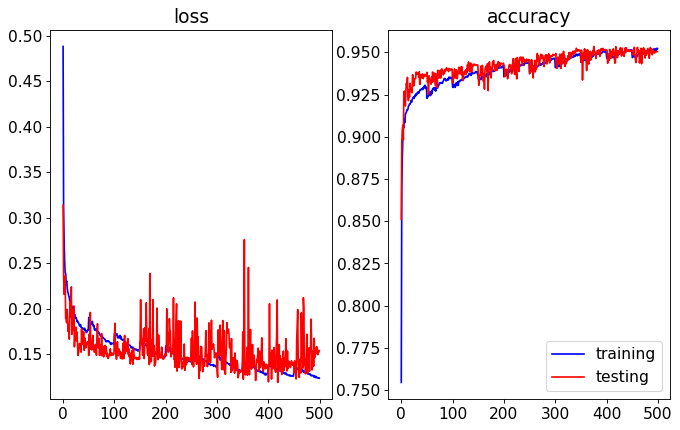

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.08it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


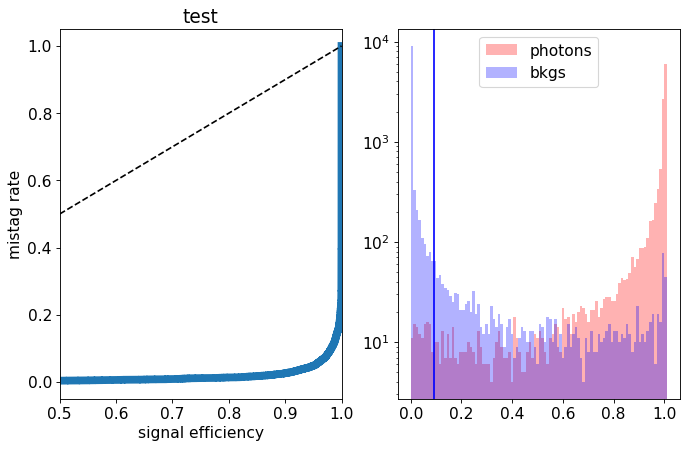

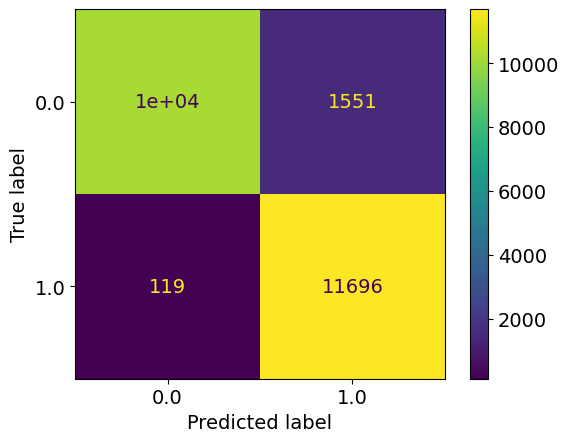

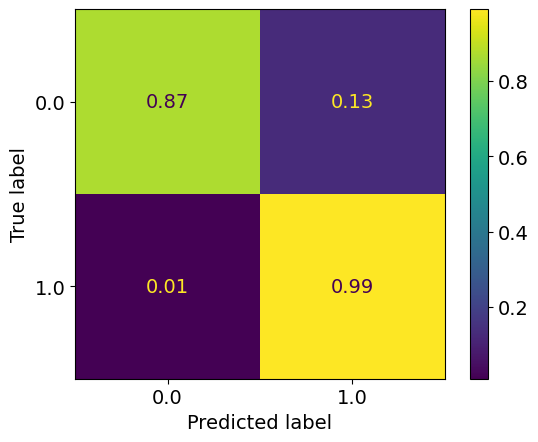

In [19]:
from tqdm import tqdm as tqdm

## OUTPUT directory
checkpoint_dir = out_dir
os.makedirs(checkpoint_dir, exist_ok=True)


nepoch=500
best_loss = 99999999
best_acc = 0.
losst = []
lossv = []
acct = []
accv = []
epochs = []
for epoch in range(nepoch):
    print ('epoch:',epoch)
    print("Learning rate:", optimizer.param_groups[0]['lr'])
    loss_t, acc_t = train(epoch)
    losst.append(loss_t)
    acct.append(acc_t)
    loss_v, acc_v = test(epoch)
    loss_epoch = loss_v
    lossv.append(loss_epoch)
    accv.append(acc_v)
    epochs.append(epoch)

    
     
    
    checkpoint = {
    'epoch': epoch + 1,
    'state_dict': model.state_dict(),
    'optimizer': optimizer.state_dict()
    }
    checkpoint_file = 'model_epoch_%i.pth.tar' % ( epoch )
    torch.save(checkpoint,
                   os.path.join(checkpoint_dir,checkpoint_file ))
    
#     if loss_epoch < best_loss:
#         best_loss = loss_epoch
#         print('new best test loss:',best_loss)
#         torch.save(checkpoint,
#                    os.path.join(checkpoint_dir,'model_checkpoint_best.pth.tar' ))
    
    
    if acc_v > best_acc:
        print('new best acc:',acc_v)
        best_acc = acc_v
        torch.save(checkpoint,
                   os.path.join(checkpoint_dir,'model_checkpoint_bestacc.pth.tar' ))
    
    if ((epoch+1)%10 == 0):
        fig, (ax0,ax1) = plt.subplots(1,2,figsize=(10, 6),dpi=80)
        
        ax0.plot(np.array(epochs),np.array(losst),c='b',label='training')
        ax0.plot(np.array(epochs),np.array(lossv),c='r',label='testing')
        ax0.title.set_text("loss")
        #if ((epoch+1) == nepoch):
        #    plt.savefig('%s/TrainvsValLoss_ep%d.png'%(plot_dir, epoch), bbox_inches='tight')
        #plt.legend()
        #plt.show()
        ax1.plot(np.array(epochs),np.array(acct),c='b',label='training')
        ax1.plot(np.array(epochs),np.array(accv),c='r',label='testing')
        ax1.title.set_text("accuracy")
        plt.legend()
        #if ((epoch+1) == nepoch):
        #    plt.savefig('%s/TrainvsValLoss_ep%d.png'%(plot_dir, epoch), bbox_inches='tight')
        plt.show()
        
        
        model.eval()
        scores = []
        trues = []
        true_preds, num_preds = 0., 0.
        for data in tqdm(testloader): ### change to loaderDNN for DNN
                datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
                optimizer.zero_grad()
                #label = label.to(torch.long).squeeze()
                result = model(datax, masks, info3d)
                scores.append(torch.exp(result)[:,1].detach().cpu().flatten().numpy())
                trues.append(label.detach().cpu().numpy().flatten())
        
        
        truesa = np.hstack(trues)
        scoresa = np.hstack(scores)
        fpr, tpr, thresholds = metrics.roc_curve(truesa, scoresa, pos_label=1)
        aucv = metrics.auc(fpr, tpr)

        tpr90,fpr90,threshold90 = 0,0,0
        for i,j,k in zip(tpr,fpr,thresholds):
            if i >0.99:
                tpr90 = i
                fpr90 = j
                threshold90 = k
                break

        fig, (ax0,ax1) = plt.subplots(1,2,figsize=(10, 6),dpi=80)
        plt.rcParams['font.size'] = '14'
        ax0.plot(tpr,fpr, linewidth=7.0, label= "AUC:"+str(round(aucv,3))+" eff:"+str(round(tpr90,3))+" @ bkg rejection rate:"+str(round(1-fpr90,3)))
        ax0.set_xlabel("signal efficiency")
        ax0.set_ylabel("mistag rate")
        ax0.set_xlim([0.5,1])
        ax0.plot([0.,1], [0.,1], 'k--')
        ax0.title.set_text("test")
        plt.legend()
        #ax.text(0.6,0.6,aucv,)
        #plt.yscale("log")
        
        ax1.hist(scoresa[truesa == 1],bins=100, range=[0,1.01], label='photons',linewidth=2.0, color="r" , alpha=0.3)
        ax1.hist(scoresa[truesa == 0],bins=100, range=[0,1.01], label='bkgs',linewidth=2.0, color="b", alpha=0.3 )
        ax1.axvline(threshold90,c="b")
        plt.yscale("log")
        plt.legend()
        plt.show()

        
        
        
        
        
        ConfusionMatrixDisplay.from_predictions(np.hstack(trues), np.where(np.hstack(scores)>threshold90, 1, 0))
        plt.show()
        ConfusionMatrixDisplay.from_predictions(np.hstack(trues), np.where(np.hstack(scores)>threshold90, 1, 0), normalize="true")
        plt.show()
        

## Inference with model of best accuracy checkpoint

### Load best accuracy checkpoint and define model

In [20]:
### REMEMBER: specify the correct input model

# old trainings directories
#out_dir = '20250226_225333_checkpoints' # training 4
#out_dir = '20250227_190925_checkpoints' # training 6
#out_dir = '20250227_235925_checkpoints' # training 7
#out_dir = '20250306_181358_checkpoints' # training 8

## no need to specify the out_dir if launching the full notebook alltogether

device = torch.device('cuda:0')#('cuda' if torch.cuda.is_available() else 'cpu')
model_load = torch.load(out_dir+"/model_checkpoint_bestacc.pth.tar")
print(out_dir)


model = MHA_model(n_seq=150,
        input_dim = 4,
        dim_emb = 16,#32
        n_heads = 16,
        num_enclayers = 6,#4
        dim_feedforward = 64,
        output_dim = 2)


model.to(device)
model.load_state_dict(model_load["state_dict"])
model.eval()

20250702_195731_checkpoints


/opt/exp_soft/vo.gridcl.fr/software/torch/2.0.1/py311-cuda117/lib/python3.11/site-packages/torch/jit/_recursive.py:266: UserWarning: 'batch_first' was found in ScriptModule constants, but was not actually set in __init__. Consider removing it.
  warnings.warn("'{}' was found in ScriptModule constants, "


MHA_model(
  (emb_inp): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=Dropout)
    (2): RecursiveScriptModule(original_name=ELU)
    (3): RecursiveScriptModule(original_name=Linear)
    (4): RecursiveScriptModule(original_name=Dropout)
    (5): RecursiveScriptModule(original_name=ELU)
  )
  (transformer_encoder): RecursiveScriptModule(
    original_name=TransformerEncoder
    (layers): RecursiveScriptModule(
      original_name=ModuleList
      (0): RecursiveScriptModule(
        original_name=TransformerEncoderLayer
        (self_attn): RecursiveScriptModule(
          original_name=MultiheadAttention
          (out_proj): RecursiveScriptModule(original_name=NonDynamicallyQuantizableLinear)
        )
        (linear1): RecursiveScriptModule(original_name=Linear)
        (dropout): RecursiveScriptModule(original_name=Dropout)
        (linear2): RecursiveScriptModule(original_name=Lin

### Confusion matrix and accuracy on test dataset (testloader)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:02<00:00, 15.13it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


accuracy: 0.9534617
threshold : 0.06383846


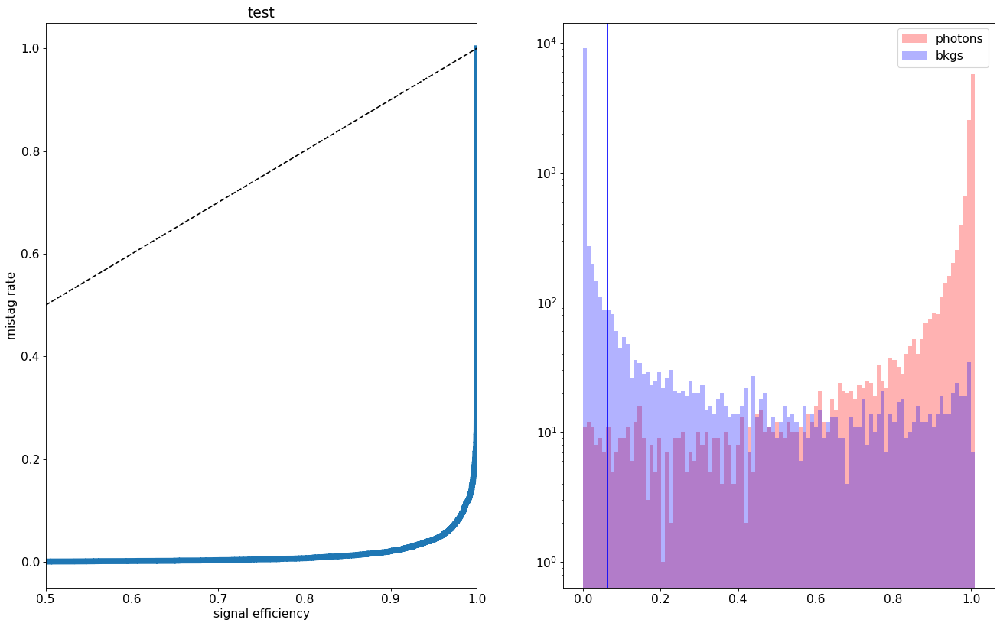

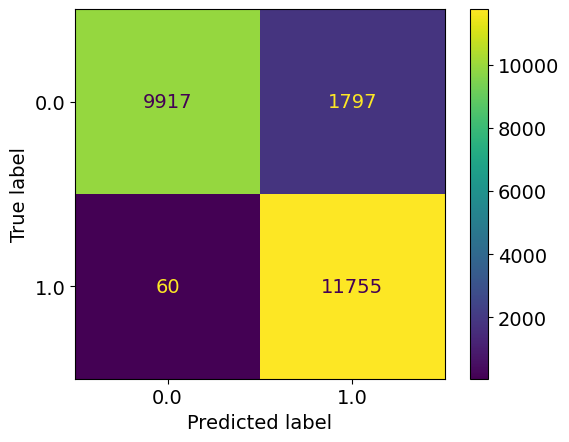

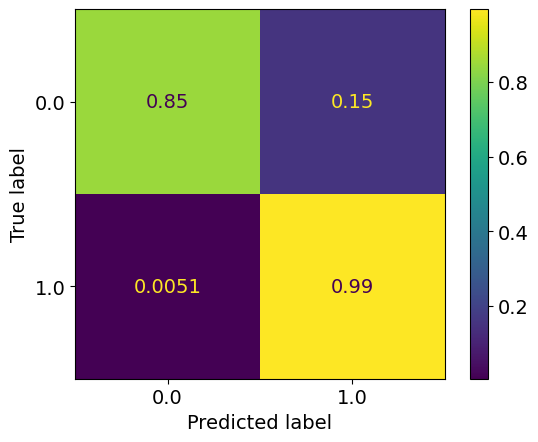

In [21]:
scores = []
trues = []
true_preds, num_preds = 0., 0.
#threshold90 = 0.152
mispredpho = []
mispredbkg = []
for data in tqdm(testloader): ### change to loaderDNN for DNN
    
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )

######## use the following lines if you want to store mispredicted event indices for plotting  (REMEMBER to set batch_size=1)

#        opt = np.where(np.hstack(op)>threshold90, 1, 0)
#        if (ip == 1)&(opt == 0):
#            mispredpho.append(datax.detach().cpu().numpy())
#        elif (ip == 0)&(opt == 1):
#            mispredbkg.append(datax.detach().cpu().numpy())

        
        
        ######## use the following lines if you want just the overall scores for accuracy etc (Use this when you want to extract threshold and plot confusion matrices)
        
        label = label.to(torch.long).squeeze()
        pred_labels = torch.argmax(result.cpu(), dim=-1) 
        true_preds += (pred_labels == label.cpu()).sum()
        num_preds += label.shape[0]
        
acc = true_preds / num_preds
print("accuracy:",np.mean(np.array(acc)))

########################### this part extracts the threshold value and plots overall confusion matrices

truesa = np.hstack(trues)
scoresa = np.hstack(scores)
fpr, tpr, thresholds = metrics.roc_curve(truesa, scoresa, pos_label=1)
aucv = metrics.auc(fpr, tpr)

tpr90,fpr90,threshold90_test = 0,0,0
for i,j,k in zip(tpr,fpr,thresholds):
    if i >0.995:
        tpr90 = i
        fpr90 = j
        threshold90_test = k
        break
print("threshold :",threshold90_test)
fig, (ax0,ax1) = plt.subplots(1,2,figsize=(20, 12),dpi=80)
plt.rcParams['font.size'] = '14'
### plot AUC
ax0.plot(tpr,fpr, linewidth=7.0, label= "AUC:"+str(round(aucv,3))+" eff:"+str(round(tpr90,3))+" @ bkg rejection rate:"+str(round(1-fpr90,3)))
ax0.set_xlabel("signal efficiency")
ax0.set_ylabel("mistag rate")
ax0.set_xlim([0.5,1])
ax0.plot([0.,1], [0.,1], 'k--')
ax0.title.set_text("test")
plt.legend()
#plt.show()

## plot signal-bkg distribution
ax1.hist(scoresa[truesa == 1],bins=100, range=[0,1.01], label='photons',linewidth=2.0, color="r" , alpha=0.3)
ax1.hist(scoresa[truesa == 0],bins=100, range=[0,1.01], label='bkgs',linewidth=2.0, color="b", alpha=0.3 )
ax1.axvline(threshold90_test,c="b")
plt.yscale("log")
plt.legend()
plt.show()

#ax.text(0.6,0.6,aucv,)
#plt.yscale("log")
#plt.legend()
#plt.show()



### plot confusion matrices
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_test, 1, 0))
plt.show()
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_test, 1, 0), normalize="true")
plt.show()

### Confusion matrix and accuracy on full dataset (totalloader)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 197/197 [00:13<00:00, 14.26it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


accuracy: 0.9525174
threshold : 0.057398967


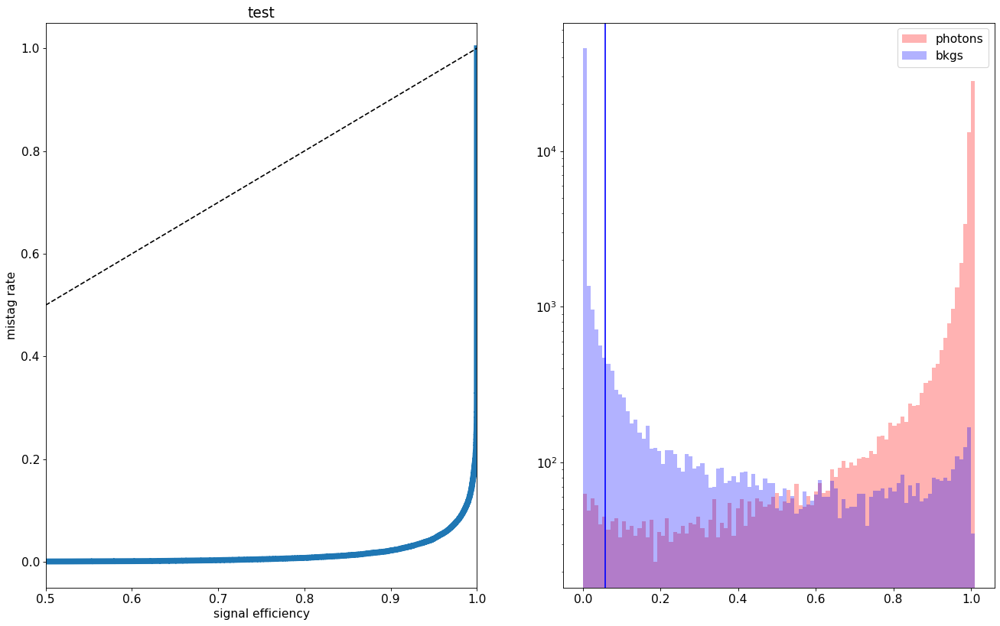

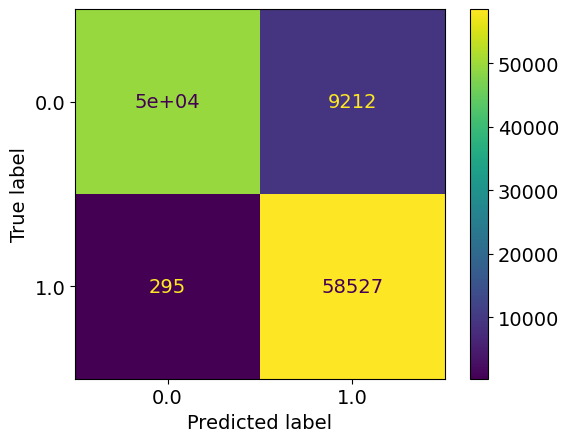

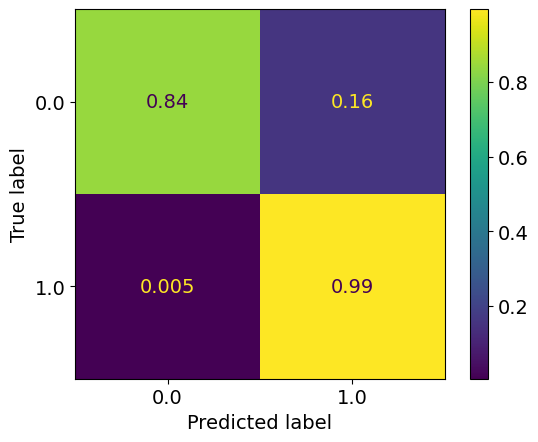

In [22]:
scores = []
trues = []
true_preds, num_preds = 0., 0.
#threshold90 = 0.152
mispredpho = []
mispredbkg = []
for data in tqdm(totalloader): ### change to loaderDNN for DNN
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )
     
        ######## use the following lines if you want just the overall scores for accuracy etc (Use this when you want to extract threshold and plot confusion matrices)
        
        label = label.to(torch.long).squeeze()
        pred_labels = torch.argmax(result.cpu(), dim=-1) 
        true_preds += (pred_labels == label.cpu()).sum()
        num_preds += label.shape[0]
        
acc = true_preds / num_preds
print("accuracy:",np.mean(np.array(acc)))

########################### this part extracts the threshold value and plots overall confusion matrices

truesa = np.hstack(trues)
scoresa = np.hstack(scores)
fpr, tpr, thresholds = metrics.roc_curve(truesa, scoresa, pos_label=1)
aucv = metrics.auc(fpr, tpr)

tpr90,fpr90,threshold90_tot = 0,0,0
for i,j,k in zip(tpr,fpr,thresholds):
    if i >0.995:
        tpr90 = i
        fpr90 = j
        threshold90_tot = k
        break
print("threshold :",threshold90_tot)
fig, (ax0,ax1) = plt.subplots(1,2,figsize=(20, 12),dpi=80)
plt.rcParams['font.size'] = '14'
### plot AUC
ax0.plot(tpr,fpr, linewidth=7.0, label= "AUC:"+str(round(aucv,3))+" eff:"+str(round(tpr90,3))+" @ bkg rejection rate:"+str(round(1-fpr90,3)))
ax0.set_xlabel("signal efficiency")
ax0.set_ylabel("mistag rate")
ax0.set_xlim([0.5,1])
ax0.plot([0.,1], [0.,1], 'k--')
ax0.title.set_text("test")
plt.legend()
#plt.show()

## plot signal-bkg distribution
ax1.hist(scoresa[truesa == 1],bins=100, range=[0,1.01], label='photons',linewidth=2.0, color="r" , alpha=0.3)
ax1.hist(scoresa[truesa == 0],bins=100, range=[0,1.01], label='bkgs',linewidth=2.0, color="b", alpha=0.3 )
ax1.axvline(threshold90_tot,c="b")
plt.yscale("log")
plt.legend()
plt.show()

#ax.text(0.6,0.6,aucv,)
#plt.yscale("log")
#plt.legend()
#plt.show()



### plot confusion matrices
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_tot, 1, 0))
plt.show()
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_tot, 1, 0), normalize="true")
plt.show()

### Confusion matrix and accuracy on unbiased dataset (unbiasloader)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:12<00:00, 12.50it/s]
/opt/exp_soft/llr/python/3.11.6/el7/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


accuracy: 0.92140156
threshold unbias: 0
threshold tot: 0.057398967


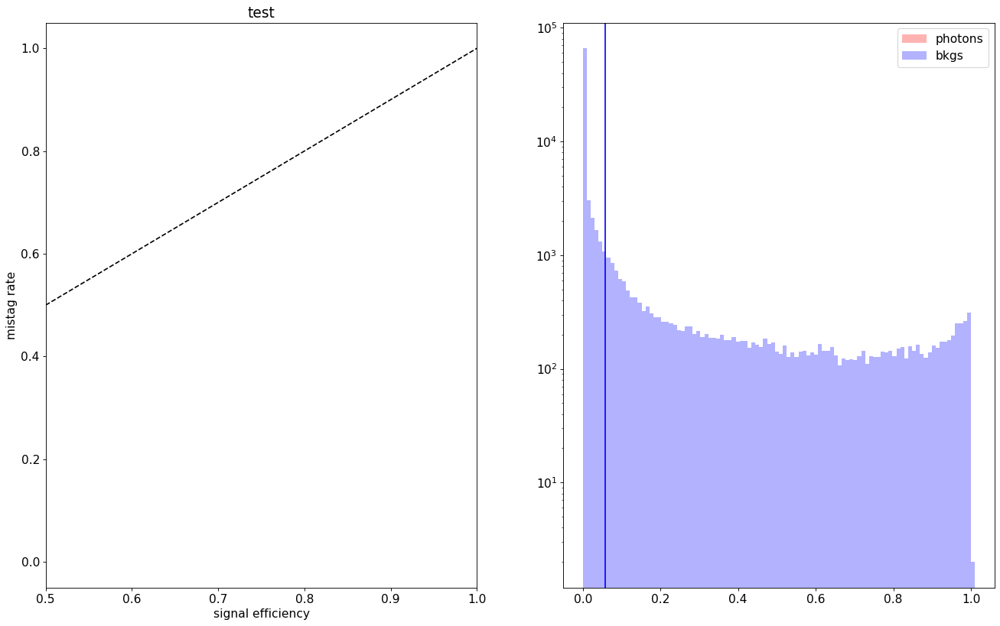

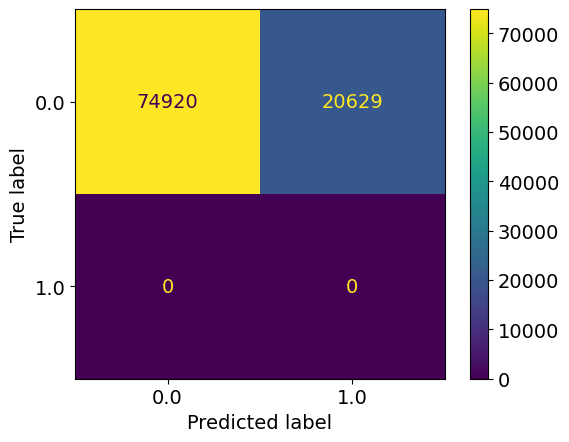

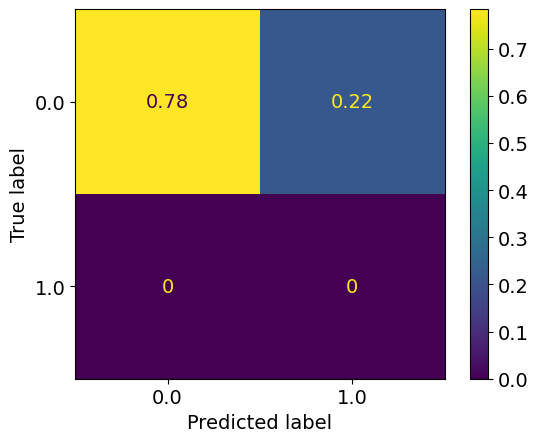

In [23]:
scores = []
trues = []
true_preds, num_preds = 0., 0.
#threshold90 = 0.152
mispredpho = []
mispredbkg = []
for data in tqdm(unbiasloader): ### change to loaderDNN for DNN
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )
     
        ######## use the following lines if you want just the overall scores for accuracy etc (Use this when you want to extract threshold and plot confusion matrices)
        
        label = label.to(torch.long).squeeze()
        pred_labels = torch.argmax(result.cpu(), dim=-1) 
        true_preds += (pred_labels == label.cpu()).sum()
        num_preds += label.shape[0]
        
acc = true_preds / num_preds
print("accuracy:",np.mean(np.array(acc)))

########################### this part extracts the threshold value and plots overall confusion matrices

truesa = np.hstack(trues)
scoresa = np.hstack(scores)
fpr, tpr, thresholds = metrics.roc_curve(truesa, scoresa, pos_label=1)
aucv = metrics.auc(fpr, tpr)

tpr90,fpr90,threshold90_unbias = 0,0,0
for i,j,k in zip(tpr,fpr,thresholds):
    if i >0.995:
        tpr90 = i
        fpr90 = j
        threshold90_unbias = k
        break
print("threshold unbias:",threshold90_unbias)
print("threshold tot:",threshold90_tot)
fig, (ax0,ax1) = plt.subplots(1,2,figsize=(20, 12),dpi=80)
plt.rcParams['font.size'] = '14'
### plot AUC
ax0.plot(tpr,fpr, linewidth=7.0, label= "AUC:"+str(round(aucv,3))+" eff:"+str(round(tpr90,3))+" @ bkg rejection rate:"+str(round(1-fpr90,3)))
ax0.set_xlabel("signal efficiency")
ax0.set_ylabel("mistag rate")
ax0.set_xlim([0.5,1])
ax0.plot([0.,1], [0.,1], 'k--')
ax0.title.set_text("test")
plt.legend()
#plt.show()

## plot signal-bkg distribution
ax1.hist(scoresa[truesa == 1],bins=100, range=[0,1.01], label='photons',linewidth=2.0, color="r" , alpha=0.3)
ax1.hist(scoresa[truesa == 0],bins=100, range=[0,1.01], label='bkgs',linewidth=2.0, color="b", alpha=0.3 )
ax1.axvline(threshold90_tot,c="b")
plt.yscale("log")
plt.legend()
plt.show()

#ax.text(0.6,0.6,aucv,)
#plt.yscale("log")
#plt.legend()
#plt.show()



### plot confusion matrices
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_tot, 1, 0))
plt.show()
ConfusionMatrixDisplay.from_predictions(truesa, np.where(scoresa>threshold90_tot, 1, 0), normalize="true")
plt.show()

### Plot mispredicted events

In [24]:
### set batch_size=1
testloader = torch.utils.data.DataLoader(tsdata, batch_size=1,shuffle=True)#, num_workers=2)
totalloader = torch.utils.data.DataLoader(combdataset, batch_size=1,shuffle=True)#, num_workers=2)
unbiasloader = torch.utils.data.DataLoader(unbiased_dataset, batch_size=1,shuffle=True)

#### mispredicted events on test dataset (testloader)

  0%|                                                                                                                               | 0/23529 [00:00<?, ?it/s]/opt/exp_soft/vo.gridcl.fr/software/torch/2.0.1/py311-cuda117/lib/python3.11/site-packages/torch/nn/modules/module.py:1501: UserWarning: FALLBACK path has been taken inside: runCudaFusionGroup. This is an indication that codegen Failed for some reason.
To debug try disable codegen fallback path via setting the env variable `export PYTORCH_NVFUSER_DISABLE=fallback`
 (Triggered internally at ../third_party/nvfuser/csrc/manager.cpp:335.)
  return forward_call(*args, **kwargs)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23529/23529 [02:05<00:00, 187.39it/s]


threshold 0.06383846
mispred_pho 59


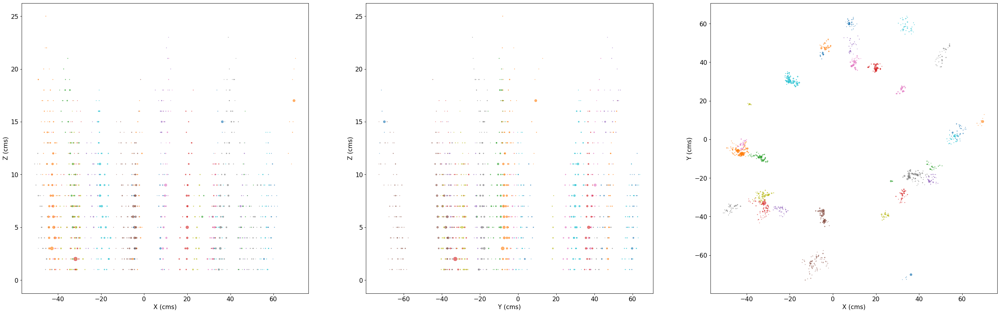

mispred_bkg 1797


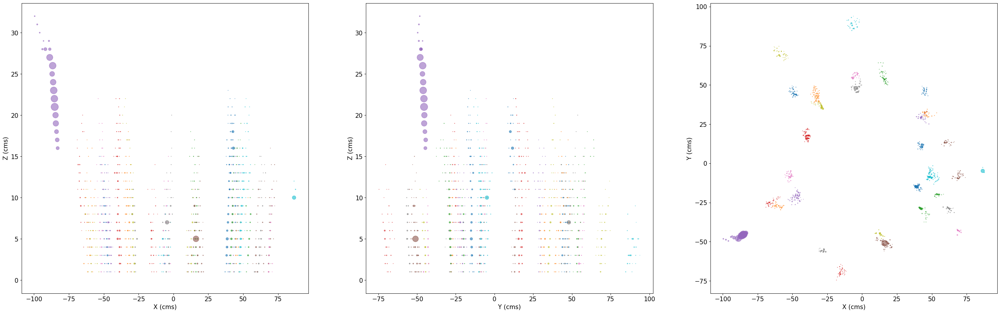

In [25]:
## REMEMBER to specify the threshold (to match the one obtained above)
scores = []
trues = []
true_preds, num_preds = 0., 0.
threshold90 = threshold90_test #0.152
mispredpho = []
mispredpho_3d = []
mispredbkg = []
mispredbkg_3d = []

for data in tqdm(testloader): ### change to loaderDNN for DNN
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )

######## use the following lines if you want to store mispredicted event indices for plotting  (REMEMBER to set batch_size=1)

        opt = np.where(np.hstack(op)>threshold90, 1, 0)
        if (ip == 1)&(opt == 0):
            mispredpho.append(datax.detach().cpu().numpy())     ## get info of layer clusters (2D obj)
            mispredpho_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters (3D obj)
        elif (ip == 0)&(opt == 1):
            mispredbkg.append(datax.detach().cpu().numpy())     ## get info of layer clusters
            mispredbkg_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters


#Plot mispredicted events:
print("threshold", threshold90)

## mispredicted PHOTONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_pho",len(mispredpho))
cc = 0
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')

    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

## mispredicted PIONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_bkg",len(mispredbkg))
cc = 0
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')
    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

Plot Barycenter of mispredicted photons
len: 59


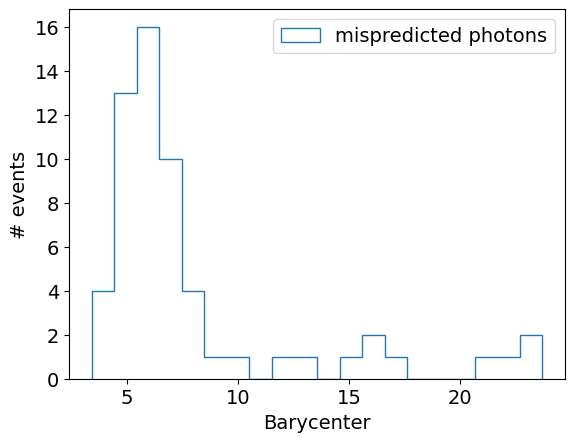

Plot Barycenter of mispredicted pions
len: 1797


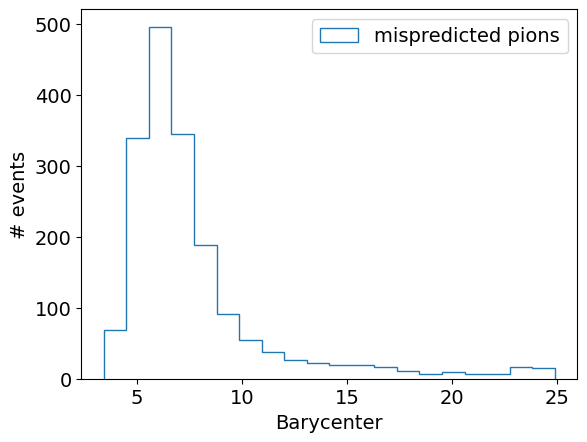

In [26]:
# mispredicted PHOTONS
print("Plot Barycenter of mispredicted photons")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_pho = []
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_pho.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_pho))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_pho, bins=20, histtype='step',linewidth=1,label='mispredicted photons')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 
plt.show()


### -------------
# mispredicted PIONS
print("Plot Barycenter of mispredicted pions")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_bkg = []
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_bkg.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_bkg))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_bkg, bins=20, histtype='step',linewidth=1,label='mispredicted pions')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 

plt.show()


Plot 3D features of mispredicted photons
mispredicted pho: 59


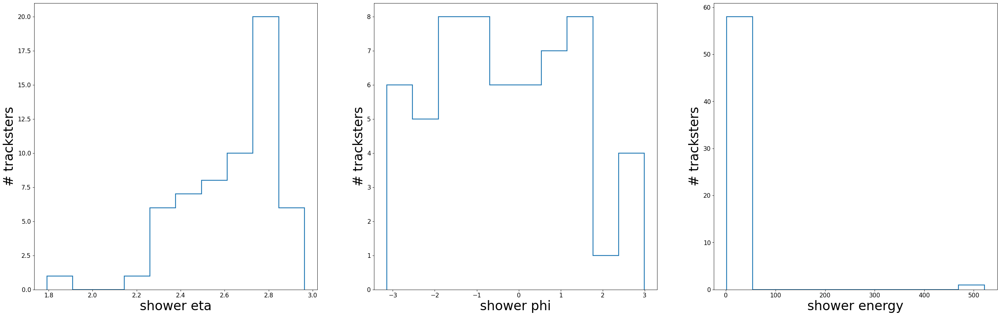

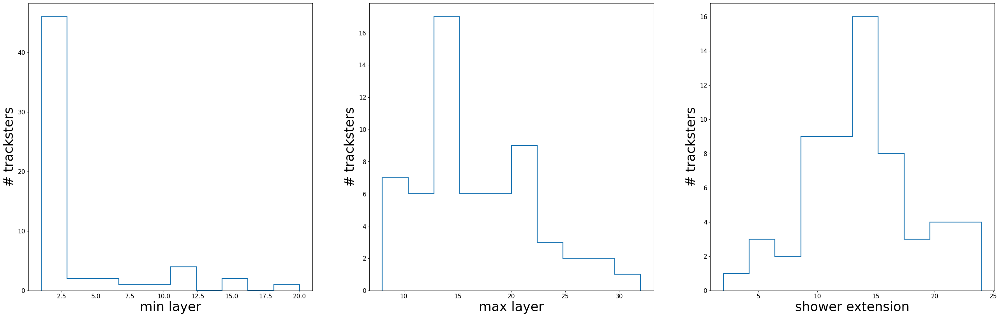

Plot 3D features of mispredicted pions
mispredicted bkg: 1797


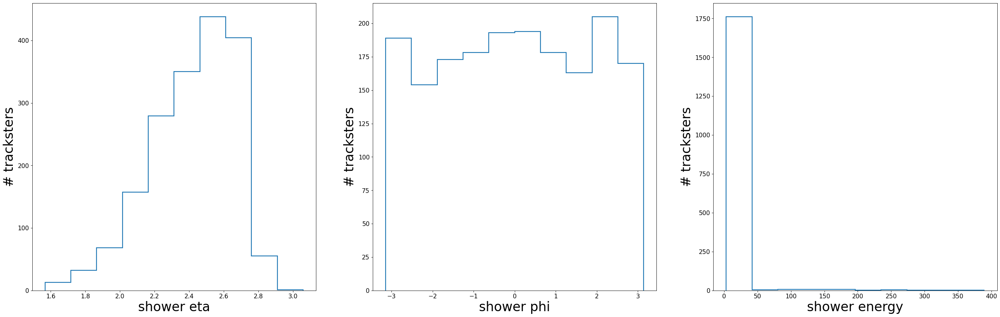

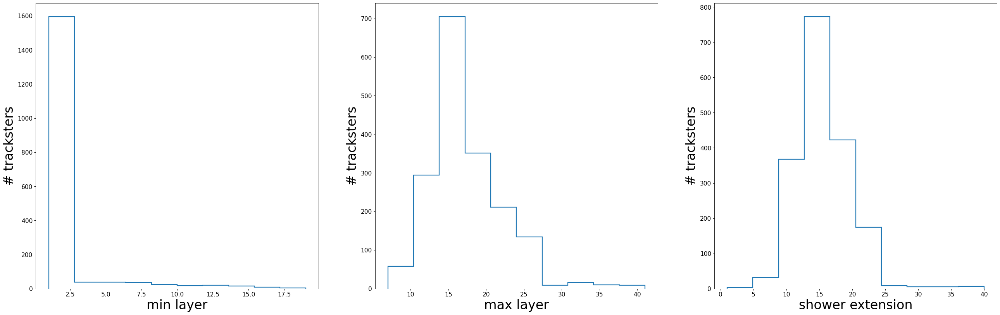

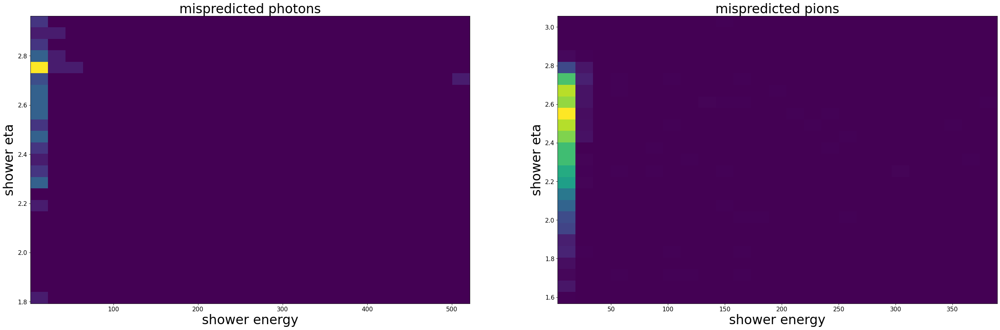

In [27]:
# mispredicted PHOTONS
print("Plot 3D features of mispredicted photons")

# mispredpho_3d is tensor of trackster information with 
# - mispredpho_3d[0] = eta
# - mispredpho_3d[1] = phi
# - mispredpho_3d[2] = energy
# - mispredpho_3d[3] = min layer
# - mispredpho_3d[4] = max layer


eta_mis_pho_3D = []  
phi_mis_pho_3D = []  
en_mis_pho_3D = []
minL_mis_pho_3D = []
maxL_mis_pho_3D = []
ext_mis_pho_3D = [] # shower extension

for tracksterarray in mispredpho_3d:

    eta_mis_pho_3D.append(tracksterarray[0][0]) #photons have eta >0 because of the selection
    phi_mis_pho_3D.append(tracksterarray[0][1])
    en_mis_pho_3D.append(tracksterarray[0][2])
    minL_mis_pho_3D.append(tracksterarray[0][3])
    maxL_mis_pho_3D.append(tracksterarray[0][4])
    ext_mis_pho_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted pho:',len(mispredpho_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()


# mispredicted PIONS
print("Plot 3D features of mispredicted pions")

# mispredbkg_3d is tensor of trackster information with 
# - mispredbkg_3d[0] = eta
# - mispredbkg_3d[1] = phi
# - mispredbkg_3d[2] = energy
# - mispredbkg_3d[3] = min layer
# - mispredbkg_3d[4] = max layer


eta_mis_bkg_3D = []  
phi_mis_bkg_3D = []  
en_mis_bkg_3D = []
minL_mis_bkg_3D = []
maxL_mis_bkg_3D = []
ext_mis_bkg_3D = [] # shower extension

for tracksterarray in mispredbkg_3d:

    eta_mis_bkg_3D.append(abs(tracksterarray[0][0])) # bkg do not have eta>0, so the abs is imposed
    phi_mis_bkg_3D.append(tracksterarray[0][1])
    en_mis_bkg_3D.append(tracksterarray[0][2])
    minL_mis_bkg_3D.append(tracksterarray[0][3])
    maxL_mis_bkg_3D.append(tracksterarray[0][4])
    ext_mis_bkg_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted bkg:',len(mispredbkg_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()

# eta vs energy
fig, (ax0,ax1) = plt.subplots(1, 2,figsize=(40, 12),dpi=80)
ax0.hist2d(en_mis_pho_3D, eta_mis_pho_3D, bins=25)
ax0.set_title('mispredicted photons',fontsize=30)
ax0.set_xlabel('shower energy',fontsize=30)
ax0.set_ylabel('shower eta',fontsize=30)
ax1.hist2d(en_mis_bkg_3D, eta_mis_bkg_3D, bins=25)
ax1.set_title('mispredicted pions',fontsize=30)
ax1.set_xlabel('shower energy',fontsize=30)
ax1.set_ylabel('shower eta',fontsize=30)
plt.show()

#### mispredicted events on full dataset (totalloader)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 117643/117643 [09:59<00:00, 196.26it/s]


threshold 0.057398967
mispred_pho 295


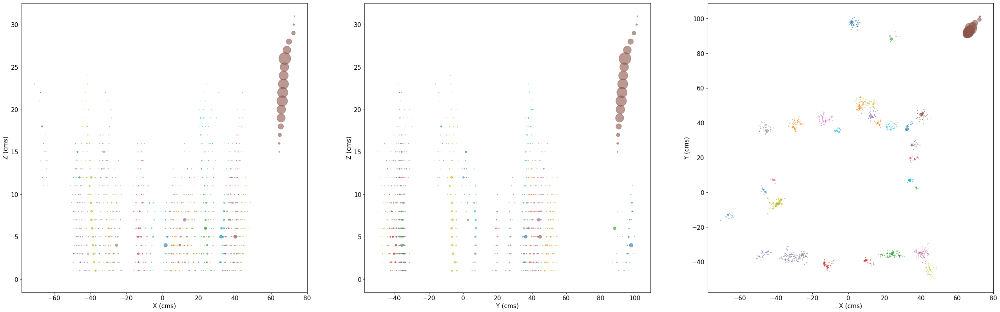

mispred_bkg 9212


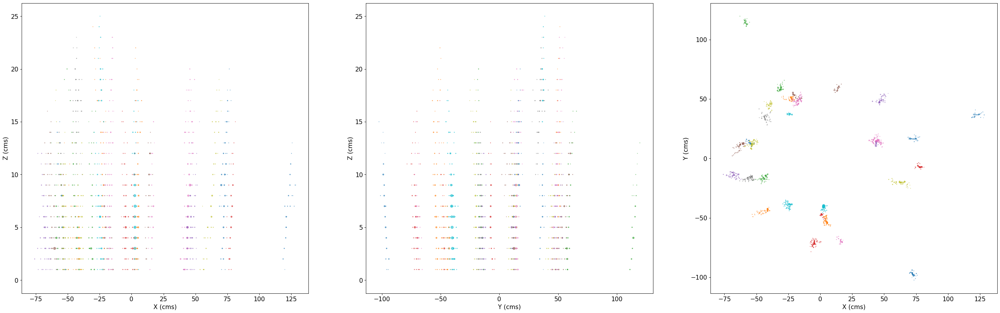

In [28]:
## REMEMBER to specify the threshold (to match the one obtained above)
scores = []
trues = []
true_preds, num_preds = 0., 0.
threshold90 = threshold90_tot #0.152
mispredpho = []
mispredpho_3d = []
mispredbkg = []
mispredbkg_3d = []

for data in tqdm(totalloader): ### change to loaderDNN for DNN
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )

######## use the following lines if you want to store mispredicted event indices for plotting  (REMEMBER to set batch_size=1)

        opt = np.where(np.hstack(op)>threshold90, 1, 0)
        if (ip == 1)&(opt == 0):
            mispredpho.append(datax.detach().cpu().numpy())
            mispredpho_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters (3D obj)
        elif (ip == 0)&(opt == 1):
            mispredbkg.append(datax.detach().cpu().numpy())
            mispredbkg_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters (3D obj)



#Plot mispredicted events:
print("threshold", threshold90)

## mispredicted PHOTONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_pho",len(mispredpho))
cc = 0
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')

    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

## mispredicted PIONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_bkg",len(mispredbkg))
cc = 0
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')

    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

Plot Barycenter of mispredicted photons
len: 295


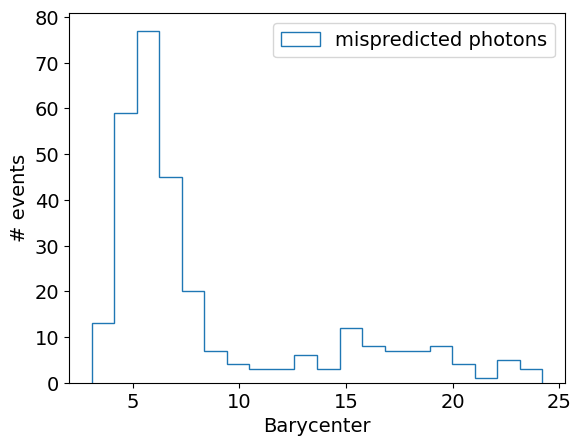

Plot Barycenter of mispredicted pions
len: 9212


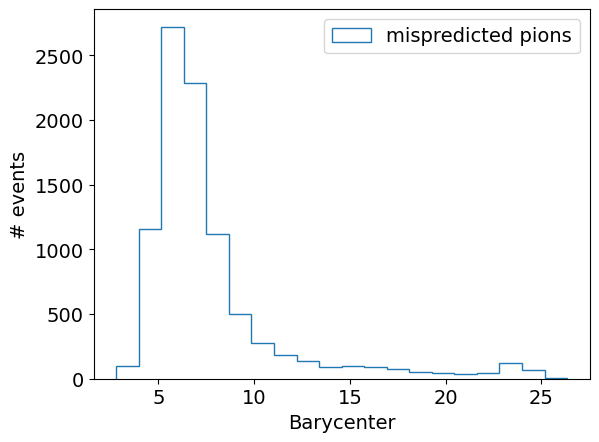

In [29]:
# mispredicted PHOTONS
print("Plot Barycenter of mispredicted photons")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_pho = []
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_pho.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_pho))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_pho, bins=20, histtype='step',linewidth=1,label='mispredicted photons')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 
plt.show()


### -------------
# mispredicted PIONS
print("Plot Barycenter of mispredicted pions")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_bkg = []
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_bkg.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_bkg))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_bkg, bins=20, histtype='step',linewidth=1,label='mispredicted pions')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 

plt.show()

Plot 3D features of mispredicted photons
mispredicted pho: 295


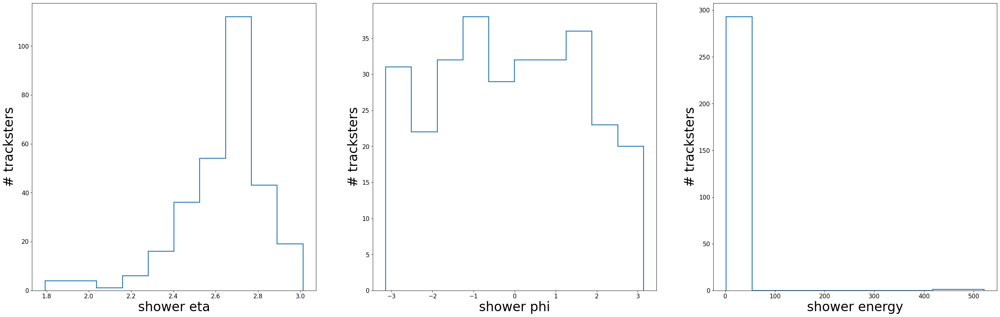

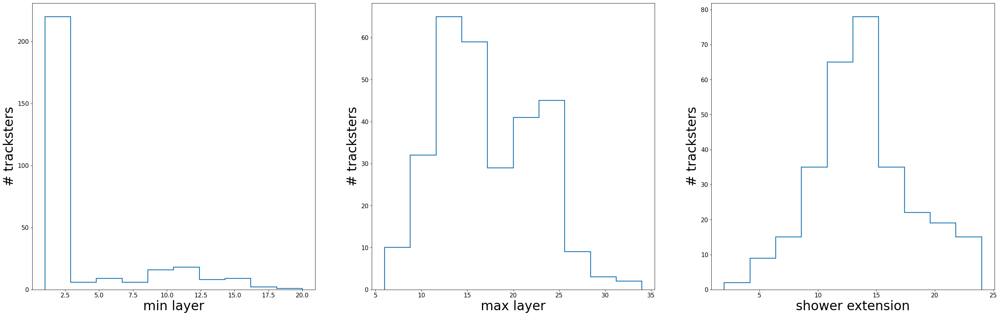

Plot 3D features of mispredicted pions
mispredicted bkg: 9212


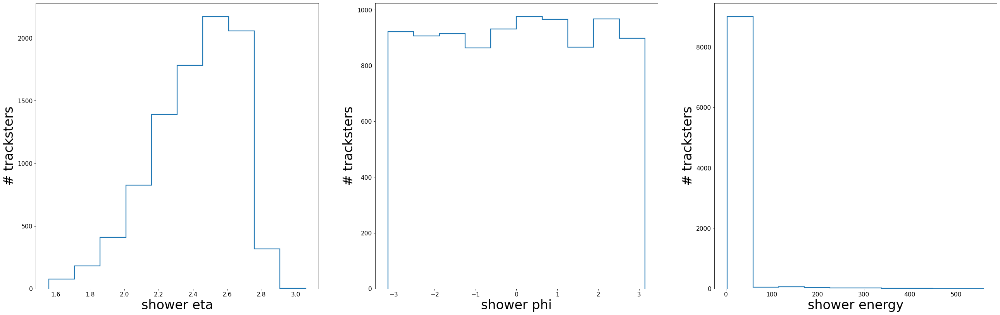

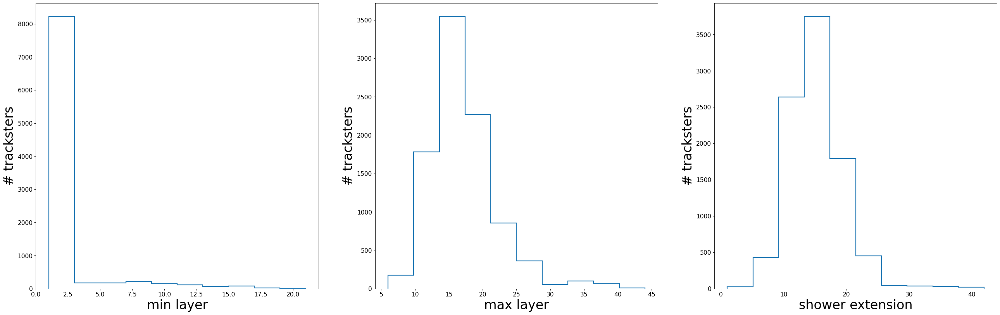

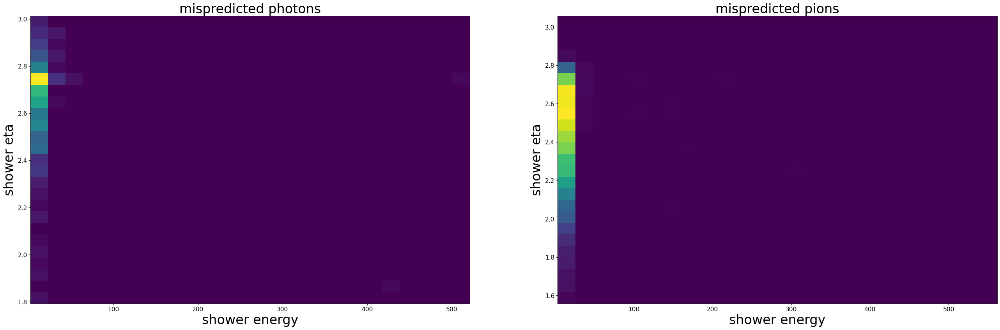

In [30]:
# mispredicted PHOTONS
print("Plot 3D features of mispredicted photons")

# mispredpho_3d is tensor of trackster information with 
# - mispredpho_3d[0] = eta
# - mispredpho_3d[1] = phi
# - mispredpho_3d[2] = energy
# - mispredpho_3d[3] = min layer
# - mispredpho_3d[4] = max layer


eta_mis_pho_3D = []  
phi_mis_pho_3D = []  
en_mis_pho_3D = []
minL_mis_pho_3D = []
maxL_mis_pho_3D = []
ext_mis_pho_3D = [] # shower extension

for tracksterarray in mispredpho_3d:

    eta_mis_pho_3D.append(tracksterarray[0][0])
    phi_mis_pho_3D.append(tracksterarray[0][1])
    en_mis_pho_3D.append(tracksterarray[0][2])
    minL_mis_pho_3D.append(tracksterarray[0][3])
    maxL_mis_pho_3D.append(tracksterarray[0][4])
    ext_mis_pho_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted pho:',len(mispredpho_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()


# mispredicted PIONS
print("Plot 3D features of mispredicted pions")

# mispredbkg_3d is tensor of trackster information with 
# - mispredbkg_3d[0] = eta
# - mispredbkg_3d[1] = phi
# - mispredbkg_3d[2] = energy
# - mispredbkg_3d[3] = min layer
# - mispredbkg_3d[4] = max layer


eta_mis_bkg_3D = []  
phi_mis_bkg_3D = []  
en_mis_bkg_3D = []
minL_mis_bkg_3D = []
maxL_mis_bkg_3D = []
ext_mis_bkg_3D = [] # shower extension

for tracksterarray in mispredbkg_3d:

    eta_mis_bkg_3D.append(abs(tracksterarray[0][0]))
    phi_mis_bkg_3D.append(tracksterarray[0][1])
    en_mis_bkg_3D.append(tracksterarray[0][2])
    minL_mis_bkg_3D.append(tracksterarray[0][3])
    maxL_mis_bkg_3D.append(tracksterarray[0][4])
    ext_mis_bkg_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted bkg:',len(mispredbkg_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()

# eta vs energy
fig, (ax0,ax1) = plt.subplots(1, 2,figsize=(40, 12),dpi=80)
ax0.hist2d(en_mis_pho_3D, eta_mis_pho_3D, bins=25)
ax0.set_title('mispredicted photons',fontsize=30)
ax0.set_xlabel('shower energy',fontsize=30)
ax0.set_ylabel('shower eta',fontsize=30)
ax1.hist2d(en_mis_bkg_3D, eta_mis_bkg_3D, bins=25)
ax1.set_title('mispredicted pions',fontsize=30)
ax1.set_xlabel('shower energy',fontsize=30)
ax1.set_ylabel('shower eta',fontsize=30)
plt.show()

#### mispredicted events on test dataset (unbiasloader)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 95549/95549 [07:38<00:00, 208.35it/s]


threshold 0.057398967
mispred_pho 0


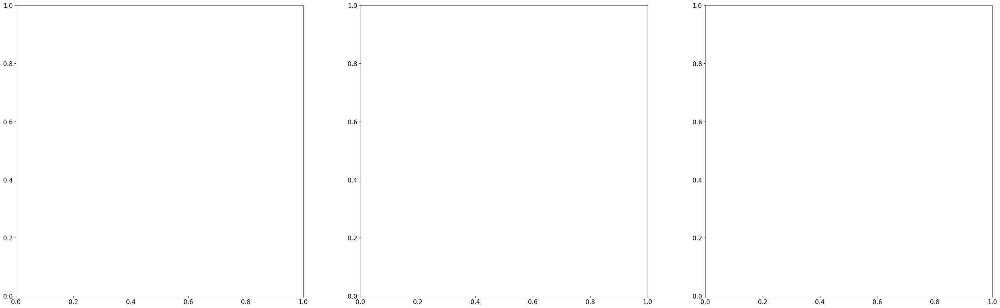

mispred_bkg 20629


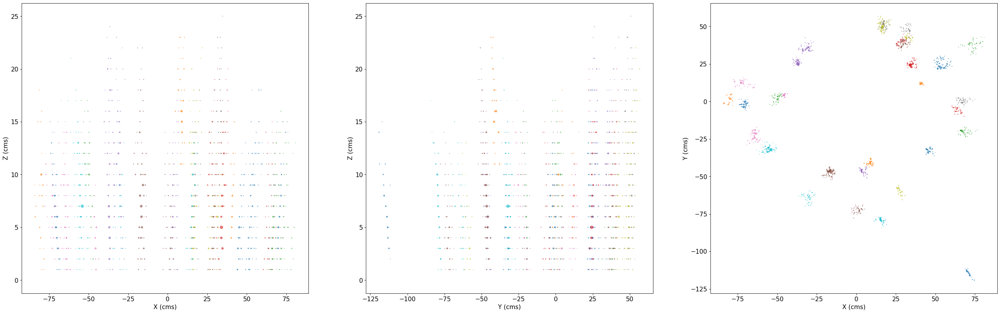

In [31]:
## REMEMBER to specify the threshold (to match the one obtained above)
scores = []
trues = []
true_preds, num_preds = 0., 0.
#threshold90 = threshold90_unbias #0.152
threshold90 = threshold90_tot
mispredpho = []
mispredpho_3d = []
mispredbkg = []
mispredbkg_3d = []

for data in tqdm(unbiasloader): ### change to loaderDNN for DNN
        datax, label, masks, info3d = data[0].to(device), data[1].to(device), data[2].to(device), data[3].to(device)
        #label = label.to(torch.long).squeeze()
        result = model(datax, masks, info3d)
        op = torch.exp(result)[:,1].detach().cpu().flatten().numpy()
        ip = label.detach().cpu().numpy().flatten()
        scores.append(op)
        trues.append( ip )

######## use the following lines if you want to store mispredicted event indices for plotting  (REMEMBER to set batch_size=1)

        opt = np.where(np.hstack(op)>threshold90, 1, 0)
        if (ip == 1)&(opt == 0):
            mispredpho.append(datax.detach().cpu().numpy())
            mispredpho_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters (3D obj)
        elif (ip == 0)&(opt == 1):
            mispredbkg.append(datax.detach().cpu().numpy())
            mispredbkg_3d.append(info3d.detach().cpu().numpy()) ## get info of tracksters (3D obj)



#Plot mispredicted events:
print("threshold", threshold90)

## mispredicted PHOTONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_pho",len(mispredpho))
cc = 0
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')

    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

## mispredicted PIONS
fig, (ax0,ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
print("mispred_bkg",len(mispredbkg))
cc = 0
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])
    #uarray = uarray[uarray[:,2]>0]
    ax0.scatter(uarray[:,0],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax0.set_xlabel('X (cms)')
    ax0.set_ylabel('Z (cms)')
    ax1.scatter(uarray[:,1],uarray[:,2],s=uarray[:,3]*10,alpha=0.6)
    ax1.set_xlabel('Y (cms)')
    ax1.set_ylabel('Z (cms)')

    ax2.scatter(uarray[:,0],uarray[:,1],s=uarray[:,3]*10,alpha=0.6)
    ax2.set_xlabel('X (cms)')
    ax2.set_ylabel('Y (cms)')
    cc += 1
    if cc > 30:
        break    

plt.show()

Plot Barycenter of mispredicted photons
len: 0


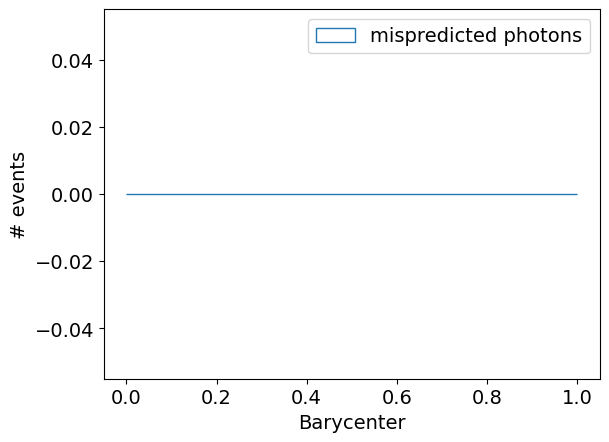

Plot Barycenter of mispredicted pions
len: 20629


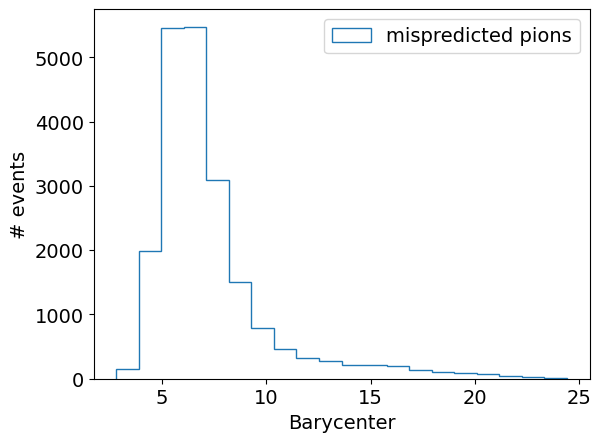

In [32]:
# mispredicted PHOTONS
print("Plot Barycenter of mispredicted photons")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_pho = []
for uarray in mispredpho:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_pho.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_pho))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_pho, bins=20, histtype='step',linewidth=1,label='mispredicted photons')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 
plt.show()


### -------------
# mispredicted PIONS
print("Plot Barycenter of mispredicted pions")

fig, ax = plt.subplots(1,1)#,figsize=(40, 12),dpi=80)

barycenter_mis_bkg = []
for uarray in mispredbkg:
    
    uarray = uarray.reshape(uarray.shape[1],uarray.shape[2])

    barycenter_z = np.average(uarray[:,2], weights=uarray[:,3])
    barycenter_mis_bkg.append(barycenter_z)
    #print(barycenter_z)

print("len:",len(barycenter_mis_bkg))
#print(barycenter_mis_pho)

ax.hist(barycenter_mis_bkg, bins=20, histtype='step',linewidth=1,label='mispredicted pions')
ax.legend()
ax.set_xlabel('Barycenter')
ax.set_ylabel('# events')
 

plt.show()

Plot 3D features of mispredicted photons
mispredicted pho: 0


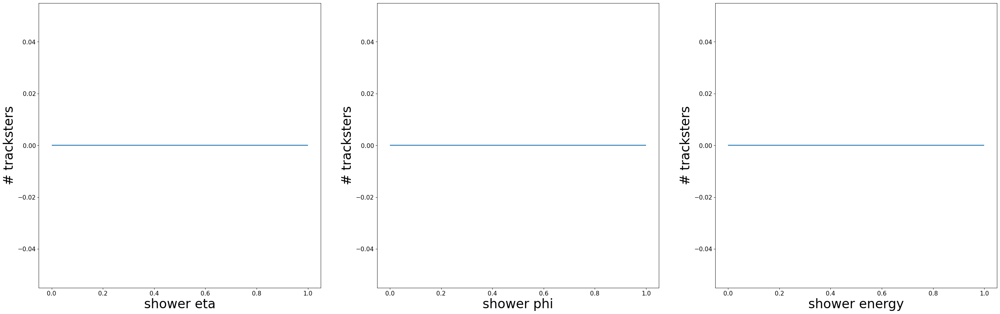

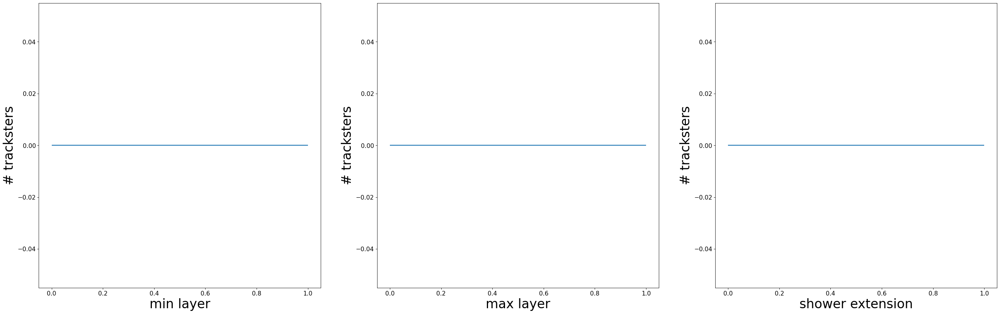

Plot 3D features of mispredicted pions
mispredicted bkg: 20629


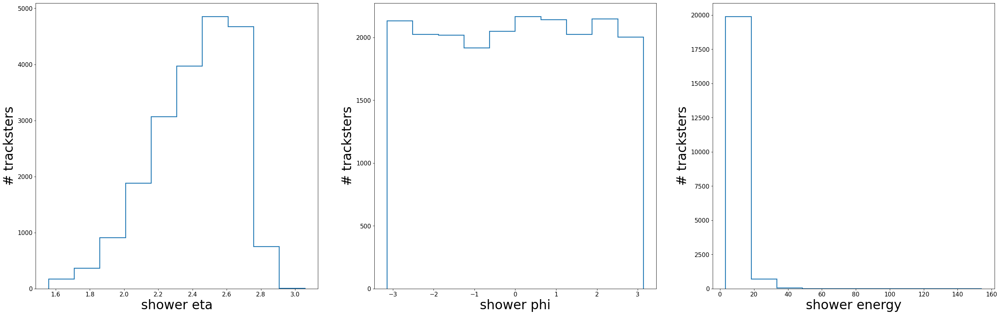

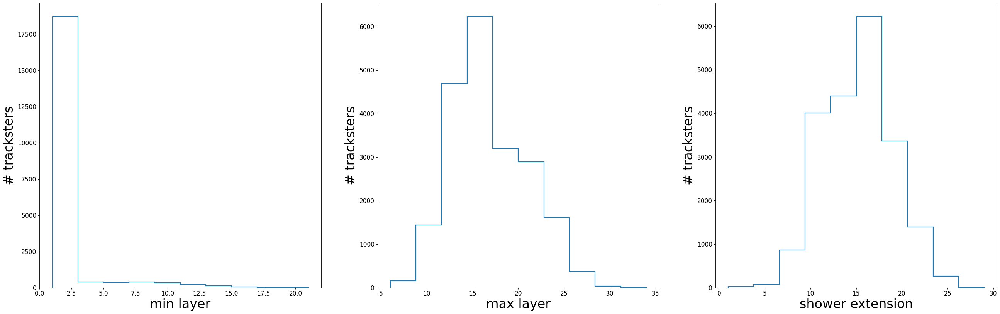

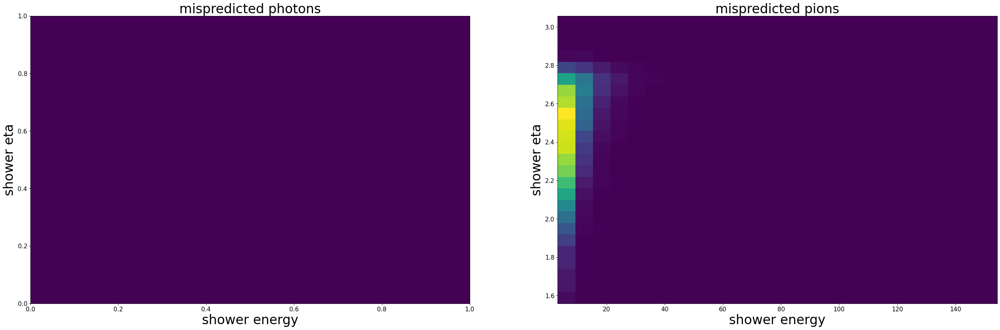

In [33]:
# mispredicted PHOTONS
print("Plot 3D features of mispredicted photons")

# mispredpho_3d is tensor of trackster information with 
# - mispredpho_3d[0] = eta
# - mispredpho_3d[1] = phi
# - mispredpho_3d[2] = energy
# - mispredpho_3d[3] = min layer
# - mispredpho_3d[4] = max layer


eta_mis_pho_3D = []  
phi_mis_pho_3D = []  
en_mis_pho_3D = []
minL_mis_pho_3D = []
maxL_mis_pho_3D = []
ext_mis_pho_3D = [] # shower extension

for tracksterarray in mispredpho_3d:

    eta_mis_pho_3D.append(tracksterarray[0][0])
    phi_mis_pho_3D.append(tracksterarray[0][1])
    en_mis_pho_3D.append(tracksterarray[0][2])
    minL_mis_pho_3D.append(tracksterarray[0][3])
    maxL_mis_pho_3D.append(tracksterarray[0][4])
    ext_mis_pho_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted pho:',len(mispredpho_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_pho_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()


# mispredicted PIONS
print("Plot 3D features of mispredicted pions")

# mispredbkg_3d is tensor of trackster information with 
# - mispredbkg_3d[0] = eta
# - mispredbkg_3d[1] = phi
# - mispredbkg_3d[2] = energy
# - mispredbkg_3d[3] = min layer
# - mispredbkg_3d[4] = max layer


eta_mis_bkg_3D = []  
phi_mis_bkg_3D = []  
en_mis_bkg_3D = []
minL_mis_bkg_3D = []
maxL_mis_bkg_3D = []
ext_mis_bkg_3D = [] # shower extension

for tracksterarray in mispredbkg_3d:

    eta_mis_bkg_3D.append(abs(tracksterarray[0][0]))
    phi_mis_bkg_3D.append(tracksterarray[0][1])
    en_mis_bkg_3D.append(tracksterarray[0][2])
    minL_mis_bkg_3D.append(tracksterarray[0][3])
    maxL_mis_bkg_3D.append(tracksterarray[0][4])
    ext_mis_bkg_3D.append(abs(tracksterarray[0][4] - tracksterarray[0][3]))

print('mispredicted bkg:',len(mispredbkg_3d))

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(eta_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('shower eta',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(phi_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('shower phi',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(en_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower energy',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)

plt.show()

fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(40, 12),dpi=80)
ax0.hist(minL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax0.set_xlabel('min layer',fontsize=30)
ax0.set_ylabel('# tracksters',fontsize=30)
ax1.hist(maxL_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax1.set_xlabel('max layer',fontsize=30)
ax1.set_ylabel('# tracksters',fontsize=30)
ax2.hist(ext_mis_bkg_3D, histtype='step', linewidth=2, label='mispredicted photons')
ax2.set_xlabel('shower extension',fontsize=30)
ax2.set_ylabel('# tracksters',fontsize=30)
 
plt.show()

# eta vs energy
fig, (ax0,ax1) = plt.subplots(1, 2,figsize=(40, 12),dpi=80)
ax0.hist2d(en_mis_pho_3D, eta_mis_pho_3D, bins=25)
ax0.set_title('mispredicted photons',fontsize=30)
ax0.set_xlabel('shower energy',fontsize=30)
ax0.set_ylabel('shower eta',fontsize=30)
ax1.hist2d(en_mis_bkg_3D, eta_mis_bkg_3D, bins=25)
ax1.set_title('mispredicted pions',fontsize=30)
ax1.set_xlabel('shower energy',fontsize=30)
ax1.set_ylabel('shower eta',fontsize=30)
plt.show()